<a href="https://colab.research.google.com/github/JohnMasapantaPozo/Machine-and-Deep-Learning-Applied-to-Geosciences/blob/root/Lithology_Prediction_Git.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **LITHOLOGY CLASSIFICATION BY USING ML AND DL METHODS**

## **IMPORTING LIBRARIES**

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import pickle
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from google.colab import drive   #Getting access to Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


## **1. LOADING AND INSPECTING DATA**

### Training Data

In [ ]:
traindata_path = '/content/drive/MyDrive/Thesis_data/train.csv'
labeled_data = pd.read_csv(traindata_path, sep=';')
labeled_data = labeled_data.rename(columns={'FORCE_2020_LITHOFACIES_LITHOLOGY':'LITHO', 'FORCE_2020_LITHOFACIES_CONFIDENCE':'LIT_CONF'})
#labeled_data = labeled_data[labeled_data['LIT_CONF'] == 1]
labeled_data = labeled_data.drop(['LIT_CONF'], axis=1)
#labeled_data.head()

In [ ]:
#Changing the lithology labels to a range from 0 10 11
# KEYS: 0:Sandstone, 1:Sandstone/Shale, 2:Shale, 3:Marl, 4:Dolomite, 5:Limestone
# 6:Chalk, 7:Halite, 8:Anhydrite, 9:Tuff, 10:Coal, 11:Basement

lithology_numbers = {30000: 0, 65030: 1, 65000: 2, 80000: 3, 74000: 4, 70000: 5, 70032: 6,
                88000: 7, 86000: 8, 99000: 9, 90000: 10, 93000: 11}

labeled_data['LITHO'] = labeled_data["LITHO"].map(lithology_numbers)
#display(labeled_data.head(10))

### Test Data

In [ ]:
## Test Data
testdata_path = '/content/drive/MyDrive/Thesis_data/test.csv'
testlabels_path = '/content/drive/MyDrive/Thesis_data/test_target.csv'

unlabeled_data = pd.read_csv(testdata_path, sep=';')
labels = pd.read_csv(testlabels_path, sep=';')
#display(unlabeled_data.head())

In [ ]:
## Merging test features and labels
test_data = pd.merge(unlabeled_data, labels, on=['WELL', 'DEPTH_MD'])
test_data = test_data.rename(columns={'FORCE_2020_LITHOFACIES_LITHOLOGY':'LITHO'})
test_data['LITHO'] = test_data["LITHO"].map(lithology_numbers)
#display(test_data.head())

### Hidden Data

In [ ]:
## Test Data
hiddendata_path = '/content/drive/MyDrive/Thesis_data/hidden_test.csv'

hidden_data = pd.read_csv(hiddendata_path, sep=';')
hidden_data = hidden_data.rename(columns={'FORCE_2020_LITHOFACIES_LITHOLOGY':'LITHO'})
hidden_data = hidden_data.drop(['FORCE_2020_LITHOFACIES_CONFIDENCE'], axis=1)

#Mapping lithology numbers
hidden_data['LITHO'] = hidden_data['LITHO'].map(lithology_numbers)

#display(hidden_data.head())

In [ ]:
print('Train data contains: {} data points'.format(labeled_data.shape))
print('Test data contains: {} data points'.format(test_data.shape))
print('Hidden data contains: {} data points'.format(hidden_data.shape))

#print(raw_data.columns, raw_tets_data.columns)

Train data contains: (1170511, 28) data points
Test data contains: (136786, 28) data points
Hidden data contains: (122397, 28) data points


## **2. DATA DESCRIPTION AND FIRST INSPECTION**

### A. Data Description

There is a total of **98 wells in the training dataset and 10 wells in the test dataset**. The `WELL` column is included so the data can be separated by well. This will be necessary for any "windowed" approaches where we use non-local information in the ML features. 

The data contains the metadata columns
* WELL: well name
* DEPTH_MD: measured depth
* X_LOC: UTM X coordinate 
* Y_LOC: UTM Y coordinate
* Z_LOC: DEPTH
* GROUP: NPD lithostratigraphy group
* FORMATION: NPD lithostratgraphy formation

The data contains the well log curves. For example the following:
* BS: Bit Size
* CALI: Caliper
* RDEP: Deep Resistivity
* RHOB: Bulk Density
* GR: Raw gamma data
* SGR: Spectral Gamma Ray
* RMED: Medium Resistivity
* ROP: Rate of Penetration
* NPHI: Neutron Porosity
* PEF: Photoelectric Absorption Factor
* RSHA: Shallow Resistivity
* DTS: Sonic (Sheer Slowness)
* DTC: Sonic (Compressional Slowness)

See contest page for full list.

as well as the interpretation

* LITHO: lithology class label
* LIT_CONF: confidence in lithology interpretation (1: high, 2: medium, 3: low)

### B. Wells Inluded - Training Dataset

In [ ]:
#Inspecting wells available in the dataset
labeled_wells = labeled_data['WELL'].unique()
print(labeled_wells)

['15/9-13' '15/9-15' '15/9-17' '16/1-2' '16/1-6 A' '16/10-1' '16/10-2'
 '16/10-3' '16/10-5' '16/11-1 ST3' '16/2-11 A' '16/2-16' '16/2-6' '16/4-1'
 '16/5-3' '16/7-4' '16/7-5' '16/8-1' '17/11-1' '25/11-15' '25/11-19 S'
 '25/11-5' '25/2-13 T4' '25/2-14' '25/2-7' '25/3-1' '25/4-5' '25/5-1'
 '25/5-4' '25/6-1' '25/6-2' '25/6-3' '25/7-2' '25/8-5 S' '25/8-7' '25/9-1'
 '26/4-1' '29/6-1' '30/3-3' '30/3-5 S' '30/6-5' '31/2-1' '31/2-19 S'
 '31/2-7' '31/2-8' '31/2-9' '31/3-1' '31/3-2' '31/3-3' '31/3-4' '31/4-10'
 '31/4-5' '31/5-4 S' '31/6-5' '31/6-8' '32/2-1' '33/5-2' '33/6-3 S'
 '33/9-1' '33/9-17' '34/10-19' '34/10-21' '34/10-33' '34/10-35' '34/11-1'
 '34/11-2 S' '34/12-1' '34/2-4' '34/3-1 A' '34/4-10 R' '34/5-1 A'
 '34/5-1 S' '34/7-13' '34/7-20' '34/7-21' '34/8-1' '34/8-3' '34/8-7 R'
 '35/11-1' '35/11-10' '35/11-11' '35/11-12' '35/11-13' '35/11-15 S'
 '35/11-6' '35/11-7' '35/12-1' '35/3-7 S' '35/4-1' '35/8-4' '35/8-6 S'
 '35/9-10 S' '35/9-2' '35/9-5' '35/9-6 S' '36/7-3' '7/1-1' '7/1-2 S']


In [ ]:
#Number of wells contained in the train dataset
print("The data contains {} wells".format(len(labeled_wells)))

The data contains 98 wells


### C. Wells Inluded - Unlabeled Dataset

In [ ]:
#Inspecting wells available in the dataset
test_wells = test_data['WELL'].unique()
print(test_wells)

['15/9-14' '25/10-10' '25/11-24' '25/5-3' '29/3-1' '34/10-16 R' '34/3-3 A'
 '34/6-1 S' '35/6-2 S' '35/9-8']


In [ ]:
#Number of wells contained in the test dataset
print("The data contains {} wells".format(len(test_wells)))

The data contains 10 wells


### D. Wells Inluded - Hidden Dataset

In [ ]:
hidden_wells = hidden_data['WELL'].unique()
hidden_wells

array(['15/9-23', '16/2-7', '16/7-6', '17/4-1', '25/10-9', '31/2-10',
       '31/2-21 S', '34/3-2 S', '35/11-5', '35/9-7'], dtype=object)

In [ ]:
#Number of wells contained in the test dataset
print("The data contains {} wells".format(len(hidden_wells)))

The data contains 10 wells


### E. Visualizing well locations

Reference: https://github.com/brendonhall/FORCE-2020-Lithology/blob/master/notebooks/02-Map-View.ipynb

In [ ]:
#Visualizing Wells Location

well_names = np.concatenate((labeled_wells, test_wells, hidden_wells))
well_names_df = pd.DataFrame({'WELL':well_names})
#well_names_df

#NPD metadata containing important information for the wells
well_meta_csv = '/content/drive/MyDrive/Thesis_data/wellbore_exploration_all.csv'
well_meta_df = pd.read_csv(well_meta_csv)

#Rename columns of interest
well_meta_df.rename(columns={'wlbWellboreName': 'WELL',
                             'wlbWell': 'WELL_HEAD',
                            'wlbNsDecDeg': 'lat',
                            'wlbEwDesDeg': 'lon',
                            'wlbDrillingOperator': 'Drilling_Operator',
                            'wlbPurposePlanned': 'Purpose',
                            'wlbCompletionYear': 'Completion_Year',
                            'wlbFormationAtTd': 'Formation'}, inplace=True)

# get df of WELL_HEAD and the lat long
well_locations_df = well_meta_df[['WELL_HEAD', 'lat', 'lon']].drop_duplicates(subset=['WELL_HEAD'])

# we only need a few of the columns for the map plot
well_meta_df = well_meta_df[['WELL', 'Drilling_Operator', 'Purpose', 'Completion_Year', 'Formation']]

def base_well_name(row):
    well_name = row['WELL']
    return well_name.split()[0]

# apply the function to extract the WELL_HEAD base name from the well
well_names_df['WELL_HEAD'] = well_names_df.apply(lambda row: base_well_name(row), axis=1)

# merge with location data to get lat/lon
locations_df = well_names_df.merge(well_locations_df, how='inner', on='WELL_HEAD')
# merge with the meta data to get other data
locations_df = locations_df.merge(well_meta_df, how='left', on='WELL')

#Labeling train and test wells
locations_df.loc[locations_df['WELL'].isin(labeled_wells), 'Dataset'] = 'Train'
locations_df.loc[locations_df['WELL'].isin(test_wells), 'Dataset'] = 'Test'
locations_df.loc[locations_df['WELL'].isin(hidden_wells), 'Dataset'] = 'Hidden'

In [ ]:
#Visualization
import plotly.express as px
fig = px.scatter_mapbox(locations_df, lat="lat", lon="lon",
                        color='Dataset', 
                        zoom=5, height=600
                        )

fig.update_layout(mapbox_style="open-street-map" )
fig.update_layout(margin={"r":300,"t":50,"l":300,"b":0})
fig.show()

### F. Labels Distributions

In [ ]:
lithology_numbers2 = {0:'Sandstone', 1:'Sandstone/Shale', 2:'Shale', 
                     3:'Marl', 4:'Dolomite', 5:'Limestone', 6:'Chalk', 
                     7:'Halite', 8:'Anhydrite', 9:'Tuff', 10:'Coal', 11:'Basement'}

train_label_dict = dict(labeled_data['LITHO'].map(lithology_numbers2).value_counts())
train_label_counts = {key:np.round(value*100/labeled_data['LITHO'].count(), 2) for key, value in train_label_dict.items()}

test_label_dict = dict(test_data['LITHO'].map(lithology_numbers2).value_counts())
test_label_counts = {key:np.round(value*100/test_data['LITHO'].count(), 2) for key, value in test_label_dict.items()}

hidden_label_dict = dict(hidden_data['LITHO'].map(lithology_numbers2).value_counts())
hidden_label_counts = {key:np.round(value*100/hidden_data['LITHO'].count(), 2) for key, value in hidden_label_dict.items()}

total_conts = {'TRAIN':train_label_counts,
               'TEST':test_label_counts,
               'HIDDEN': hidden_label_counts}

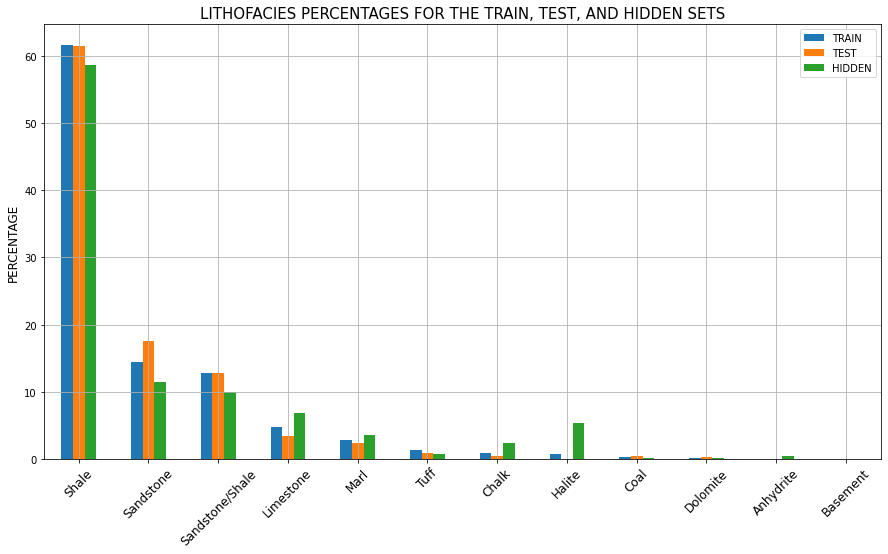

In [ ]:
pd.DataFrame(total_conts).plot(kind='bar', figsize=(15,8))
plt.title('LITHOFACIES PERCENTAGES FOR THE TRAIN, TEST, AND HIDDEN SETS', size=15)
plt.ylabel('PERCENTAGE', size=12)
plt.xticks(size=12, rotation=45)
plt.grid(True)
plt.show()


### G. Features Percentages in Datasets

#### Features - TRAINING DATASETS

**Notice that some of the curves are NaN. This is an imporant aspect of this dataset and of this competition.** The only log columns that are **guaranteed** to be present are WELL, DEPT, and GR. All other logs can (and will) be missing from some parts of the dataset.

In [ ]:
#labeled_data.isna().any()
#labeled_data.isna().sum()

The following plot shows how large a percentage of training data wells contain at least some depth interval with the given logs. As you can see a couple of logs like RT and DTS are present in less than half of the training wells. **Remember, the test data will have a similar distribution of available logs**

Text(0.5, 1.0, 'FEATURES PRECENSE PERCENTAGE - LABELED DATASET')

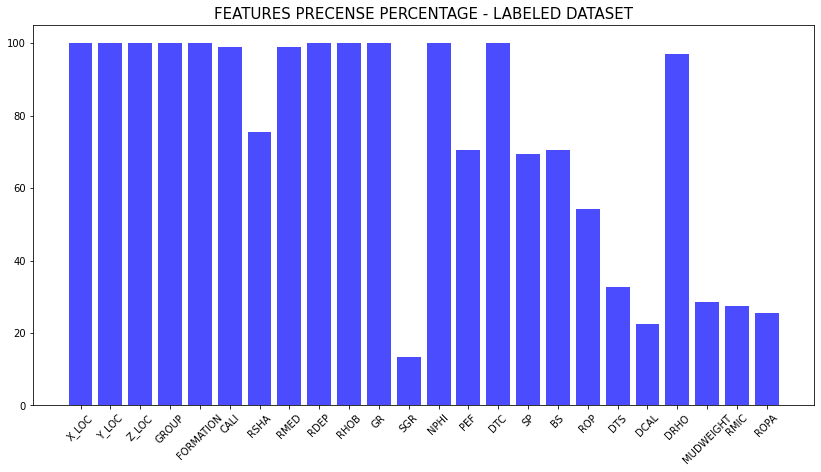

In [ ]:
occurences = np.zeros(24)
for well in labeled_data['WELL'].unique():
    occurences += labeled_data[labeled_data['WELL'] == well].isna().all().astype(int).values[2:-2]
fig, ax = plt.subplots(1, 1, figsize=(14, 7))
ax.bar(x=np.arange(occurences.shape[0]), height=(labeled_data.WELL.unique().shape[0]-occurences)/labeled_data.WELL.unique().shape[0]*100.0, color='b', alpha=0.7)
ax.set_xticklabels(labeled_data.columns[2:-2], rotation=45)
ax.set_xticks(np.arange(occurences.shape[0]))
ax.set_title("FEATURES PRECENSE PERCENTAGE - LABELED DATASET", size=15)

#### Features - TEST DATASETS

Text(0.5, 1.0, 'FEATURES PRECENSE PERCENTAGE - OPEN  DATASET')

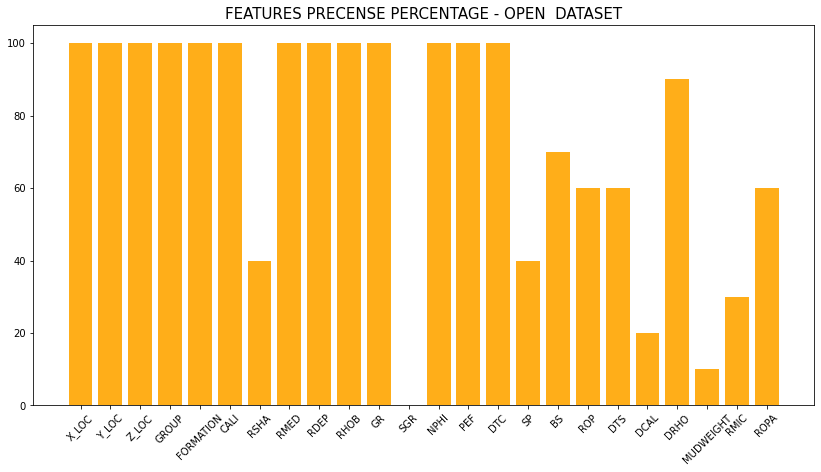

In [ ]:
occurences = np.zeros(24)
for well in test_data['WELL'].unique():
    occurences += test_data[test_data['WELL'] == well].isna().all().astype(int).values[2:-2]
fig, ax = plt.subplots(1, 1, figsize=(14, 7))
ax.bar(x=np.arange(occurences.shape[0]), height=(test_data.WELL.unique().shape[0]-occurences)/test_data.WELL.unique().shape[0]*100.0, color='orange', alpha=0.9)
ax.set_xticklabels(test_data.columns[2:-2], rotation=45)
ax.set_xticks(np.arange(occurences.shape[0]))
ax.set_title("FEATURES PRECENSE PERCENTAGE - OPEN  DATASET", size=15)

#### Features - HIDDEN DATASETS

Text(0.5, 1.0, 'FEATURES PRECENSE PERCENTAGE - HIDDEN  DATASET')

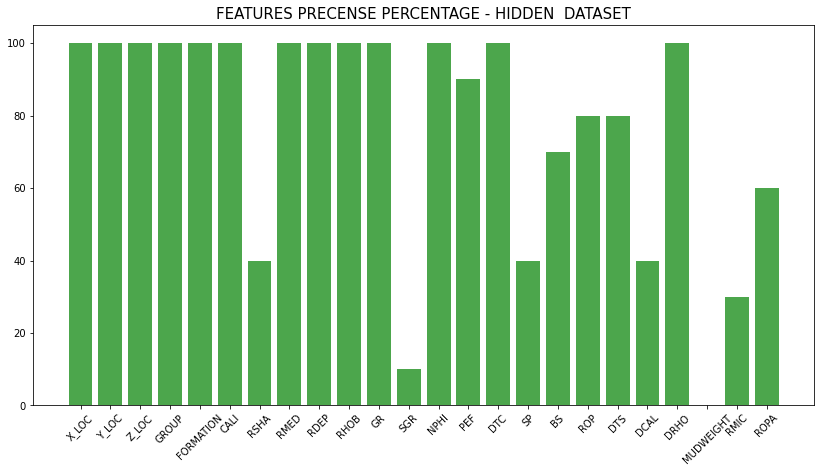

In [ ]:
occurences = np.zeros(24)
for well in hidden_data['WELL'].unique():
    occurences += hidden_data[hidden_data['WELL'] == well].isna().all().astype(int).values[2:-2]
fig, ax = plt.subplots(1, 1, figsize=(14, 7))
ax.bar(x=np.arange(occurences.shape[0]), height=(hidden_data.WELL.unique().shape[0]-occurences)/hidden_data.WELL.unique().shape[0]*100.0, color='green', alpha=0.7)
ax.set_xticklabels(hidden_data.columns[2:-2], rotation=45)
ax.set_xticks(np.arange(occurences.shape[0]))
ax.set_title("FEATURES PRECENSE PERCENTAGE - HIDDEN  DATASET", size=15)

### H. Misssing Values Visualization

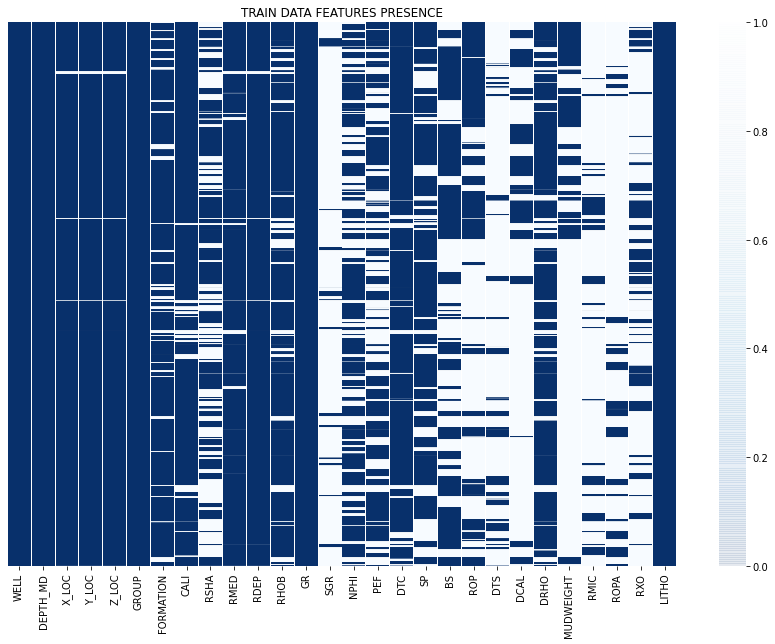

In [ ]:
#Missing values in labeled dataset
plt.subplots(figsize=(15,10))
plt.title('TRAIN DATA FEATURES PRESENCE')
sns.heatmap(labeled_data.isnull(), yticklabels=False, cmap='Blues_r', linecolor='black', alpha=0.1)

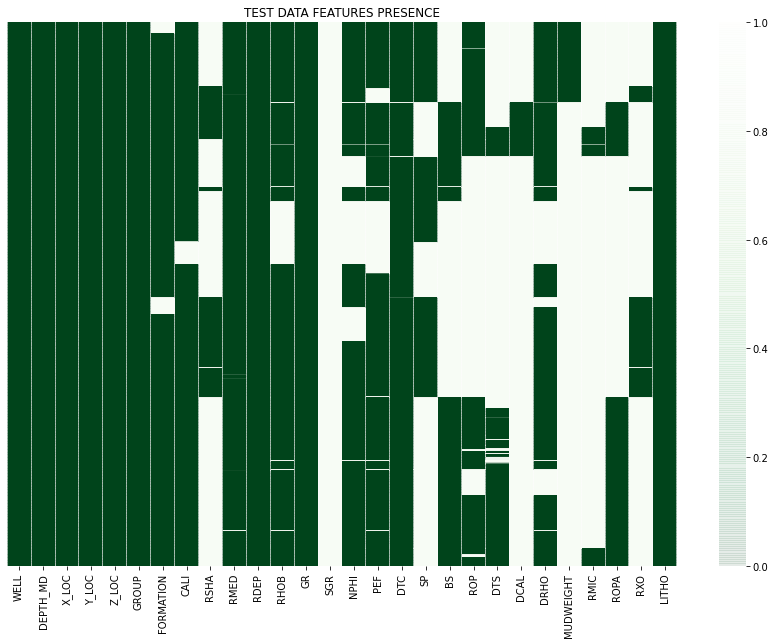

In [ ]:
#Missing values in labeled dataset
plt.subplots(figsize=(15,10))
plt.title('TEST DATA FEATURES PRESENCE')
sns.heatmap(test_data.isnull(), yticklabels=False, cmap='Greens_r', linecolor='black', alpha=0.1)

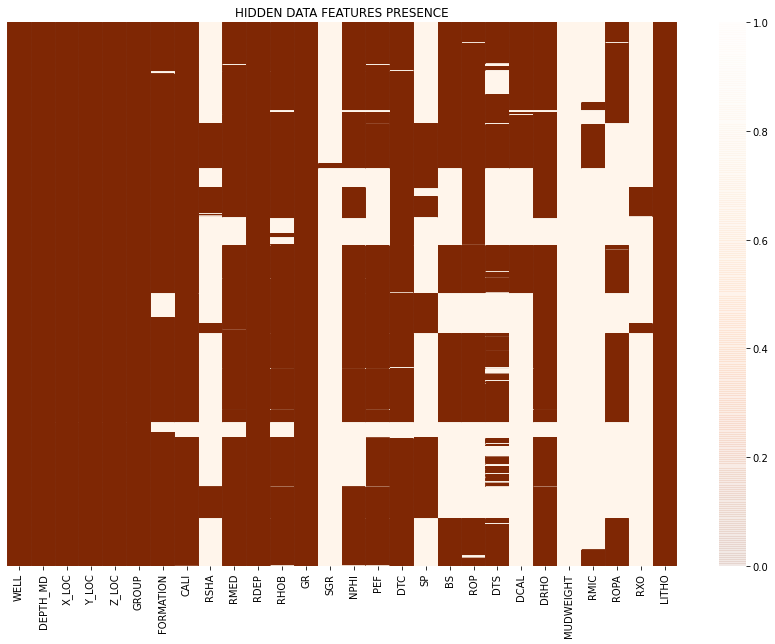

In [ ]:
#Missing values in labeled dataset
plt.subplots(figsize=(15,10))
plt.title('HIDDEN DATA FEATURES PRESENCE')
sns.heatmap(hidden_data.isnull(), yticklabels=False, cmap='Oranges_r', linecolor='black', alpha=0.1)

# ---------------------------START PLOTING FUNCTIONS---------------------

In [ ]:
# KEYS: 0:Sandstone, 1:Sandstone/Shale, 2:Shale, 3:Marl, 4:Dolomite, 5:Limestone, 6:Chalk, 7:Halite, 8:Anhydrite, 9:Tuff, 10:Coal, 11:Basement
#facies_colors2 = ['#F4D01F', '#F5C070','#4D9620','#6E2C00', '#1B4F72','#2E86C1', '#AED6F1', '#A569BD', '#196F3D', '#BC9980','gray','#CE2D00']
facies_colors = ['#F4D03F','#7ccc19','#196F3D','#160599','#2756c4','#3891f0','#80d4ff','#87039e','#ec90fc','#FF4500','#000000','#DC7633']
facies_labels = ['SS', 'S-S', 'SH', 'MR', 'DOL','LIM', 'CH','HAL', 'AN', 'TF', 'CO', 'BS']


#Facies_color_map
facies_color_map = {}
for ind, label in enumerate(facies_labels):
    facies_color_map[label] = facies_colors[ind]

#def label_facies(row, labels):
#    return labels[ row['LITHO'] -1]
    
#labeled_data.loc[:,'FaciesLabels'] = labeled_data.apply(lambda row: label_facies(row, facies_labels), axis=1)

In [ ]:
#Facies log Fuction
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable

def facies_log(logs, well_num, facies_colors):
    wells = logs['WELL'].unique()
    logs = logs[logs['WELL'] == wells[well_num]]
    logs = logs.sort_values(by='DEPTH_MD')        #Sorting log by depth
    cmap_facies = colors.ListedColormap(facies_colors[0:len(facies_colors)], 'indexed')
    
    top = logs.DEPTH_MD.min()
    bot = logs.DEPTH_MD.max()
    
    real_label = np.repeat(np.expand_dims(logs['LITHO'].values, 1), 100, 1)

    f, ax = plt.subplots(nrows=1, ncols=17, figsize=(15, 12))
    log_colors = ['black', 'red', 'blue', 'green', 'purple','black', 'red', 'blue', 'green', 'purple', 'black', 'red', 'blue', 'green', 'purple', 'black', 'black', 'red', 'blue', 'green', 'purple', 'black', 'black', 'red', 'blue', 'green', 'purple', 'black']

    for i in range(7,23):
      ax[i-7].plot(logs.iloc[:,i], logs.DEPTH_MD, color=log_colors[i])
      ax[i-7].set_ylim(top, bot)
      #ax[i-7].set_xlim(logs.iloc[:,i].min(), logs.iloc[:,i].max())

      ax[i-7].set_xlabel(str(logs.columns[i]))
      ax[i-7].invert_yaxis()
      ax[i-7].grid()

    im = ax[-1].imshow(real_label, interpolation='none', aspect='auto', cmap=cmap_facies, vmin=0, vmax=12)
    ax[-1].set_xlabel('LITHO')

    divider = make_axes_locatable(ax[-1])
    cax = divider.append_axes("right", size="20%", pad=0.05)
    cbar=plt.colorbar(im, cax=cax)
    cbar.set_label((12*' ').join(['SS', 'S-S', 'SH', 'MR', 'DOL','LIM', 'CH','HAL', 'AN', 'TF', 'CO', 'BS']))
    
    cbar.set_ticks(range(0,1)); cbar.set_ticklabels('')
        
    f.suptitle('WELL LOGS '+str(wells[well_num]), fontsize=16,y=0.9)

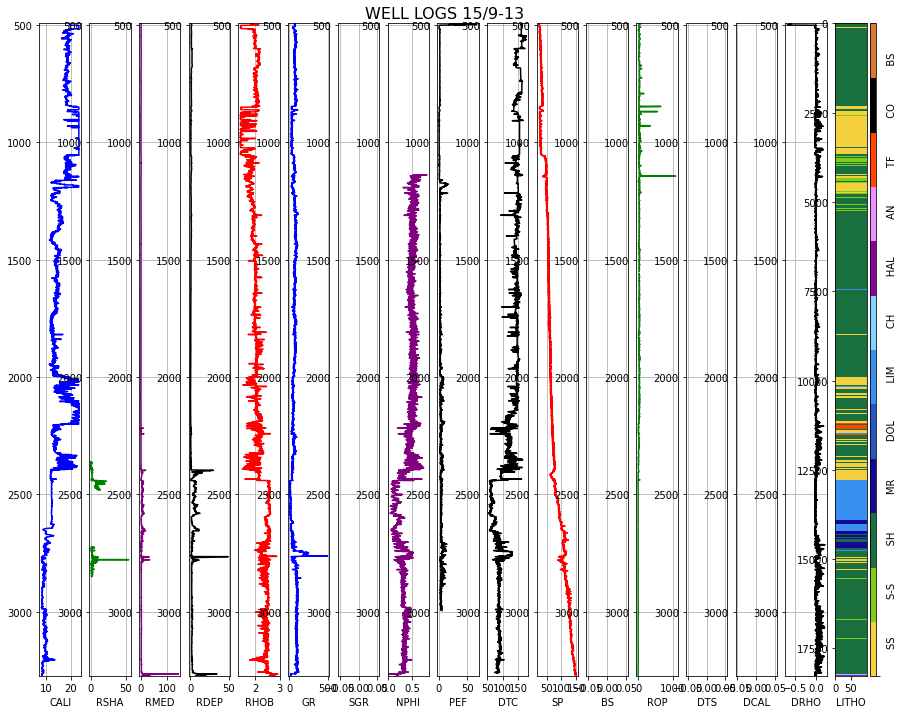

In [ ]:
facies_log(labeled_data, 0, facies_colors)

In [ ]:
#Facies log Fuction
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable

def pred_log(logs, well_num, facies_colors, n_pred):
    wells = logs['WELL'].unique()
    logs = logs[logs['WELL'] == wells[well_num]]
    logs = logs.sort_values(by='DEPTH_MD')        #Sorting log by depth
    cmap_facies = colors.ListedColormap(facies_colors[0:len(facies_colors)], 'indexed')
    
    top = logs.DEPTH_MD.min()
    bot = logs.DEPTH_MD.max()
       
    f, ax = plt.subplots(nrows=1, ncols=(12+n_pred), figsize=(15, 12))
    log_colors = ['black', 'red', 'blue', 'green', 'purple','black', 'red', 'blue', 'green', 'purple', 'black', 'red', 'blue', 'green', 'purple', 'black', 'black', 'red', 'blue', 'green', 'purple', 'black', 'black', 'red', 'blue', 'green', 'purple', 'black']

    for i in range(7,18):
      ax[i-7].plot(logs.iloc[:,i], logs.DEPTH_MD, color=log_colors[i])
      ax[i-7].set_ylim(top, bot)
      #ax[i-7].set_xlim(logs.iloc[:,i].min(), logs.iloc[:,i].max())

      ax[i-7].set_xlabel(str(logs.columns[i]))
      ax[i-7].invert_yaxis()
      ax[i-7].grid()

    for j in range((-1-n_pred), 0):
      label = np.repeat(np.expand_dims(logs.iloc[:,j].values, 1), 100, 0)
      im = ax[j].imshow(label, interpolation='none', aspect='auto', cmap=cmap_facies, vmin=0, vmax=12)
      ax[j].set_xlabel(str(logs.columns[j]))

    divider = make_axes_locatable(ax[-1])
    cax = divider.append_axes("right", size="20%", pad=0.05)
    cbar=plt.colorbar(im, cax=cax)
    cbar.set_label((12*' ').join(['SS', 'S-S', 'SH', 'MR', 'DOL','LIM', 'CH','HAL', 'AN', 'TF', 'CO', 'BS']))
    cbar.set_ticks(range(0,1)); cbar.set_ticklabels('')
        
    f.suptitle('WELL LOGS '+str(wells[well_num]), fontsize=14,y=0.94)

In [ ]:
#pred_log(labeled_data, 0, facies_colors)

# -----------------------------END PLOTING FUNCTIONS---------------------------

## **3. SELECTING INITIAL DATA**

### BAD HOLE INDICATOR DESIGN

In [ ]:
def BS_fix(bitsize):
    standard_bs_vals = [26, 17.5, 17, 14.75, 12.5, 12.25, 9.875, 8.5, 8.375, 6.5, 6]
    if bitsize >= 25 and bitsize <= 27:
        return 26
    elif bitsize >= 17.3 and bitsize <= 24:
        return 17.5
    elif bitsize >= 16.0 and bitsize < 17.3:
        return 17
    elif bitsize >= 14 and bitsize <= 15:
        return 14.75
    elif bitsize >= 12.3 and bitsize <= 13:
        return 12.5
    elif bitsize >= 11.8 and bitsize < 12.3:
        return 12.25
    elif bitsize >= 9.4 and bitsize <= 11.5:
        return 9.875
    elif bitsize >= 8.3 and bitsize < 9.4:
        return 8.5
    elif bitsize >= 8 and bitsize < 8.3:
        return 8.25
    elif bitsize >= 6.3 and bitsize <=7:
        return 6.75
    elif bitsize >= 5.8 and bitsize < 6.3:
        return 6
    else:
        return np.nan

In [ ]:
#TRAINING SET
#Creating a bad hole flag
labeled_data['BS_FIX'] = labeled_data.apply(lambda x: BS_fix(x.loc['BS']), axis=1)            #Fixing possible otliers in the BS LOG
labeled_data['CALI_R_MEAN'] = labeled_data['CALI'].rolling(5).mean()                          #Creating a most averaged caliper log in orded to correct for washouts
labeled_data['BS_FROM_CALI'] = labeled_data.apply(lambda x: BS_fix(x.loc['CALI']), axis=1)    #Creating aBS log based on the caliper maserements

#Combin Caliper log (BS_FROM_CALI AND BS_FIX INTO BS_COMB)
labeled_data['BS_COMB'] = labeled_data['BS_FIX']
labeled_data['BS_COMB'].fillna(labeled_data['BS_FROM_CALI'], inplace=True)
labeled_data['CALI_DIFF'] = labeled_data['CALI'] - labeled_data['BS_COMB']
labeled_data['BAD_HOLE'] = np.where(labeled_data['CALI_DIFF'] >= 1.5, 1,0)

In [ ]:
#TEST SET
#Creating a bad hole flag
#test_data['BS_FIX'] = test_data.apply(lambda x: BS_fix(x.loc['BS']), axis=1)            #Fixing possible otliers in the BS LOG
#test_data['CALI_R_MEAN'] = test_data['CALI'].rolling(5).mean()                          #Creating a most averaged caliper log in orded to correct for washouts
#test_data['BS_FROM_CALI'] = test_data.apply(lambda x: BS_fix(x.loc['CALI']), axis=1)    #Creating aBS log based on the caliper maserements

#Combin Caliper log (BS_FROM_CALI AND BS_FIX INTO BS_COMB)
#test_data['BS_COMB'] = test_data['BS_FIX']
#test_data['BS_COMB'].fillna(test_data['BS_FROM_CALI'], inplace=True)
#test_data['CALI_DIFF'] = test_data['CALI'] - test_data['BS_COMB']
#test_data['BAD_HOLE'] = np.where(test_data['CALI_DIFF'] >= 1.5, 1,0)

In [ ]:
#HIDDEN SET
#Creating a bad hole flag
#hidden_data['BS_FIX'] = hidden_data.apply(lambda x: BS_fix(x.loc['BS']), axis=1)            #Fixing possible otliers in the BS LOG
#hidden_data['CALI_R_MEAN'] = hidden_data['CALI'].rolling(5).mean()                          #Creating a most averaged caliper log in orded to correct for washouts
#hidden_data['BS_FROM_CALI'] = hidden_data.apply(lambda x: BS_fix(x.loc['CALI']), axis=1)    #Creating aBS log based on the caliper maserements

#Combin Caliper log (BS_FROM_CALI AND BS_FIX INTO BS_COMB)
#hidden_data['BS_COMB'] = hidden_data['BS_FIX']
#hidden_data['BS_COMB'].fillna(hidden_data['BS_FROM_CALI'], inplace=True)
#hidden_data['CALI_DIFF'] = hidden_data['CALI'] - hidden_data['BS_COMB']
#hidden_data['BAD_HOLE'] = np.where(hidden_data['CALI_DIFF'] >= 1.5, 1,0)

Text(0.5, 1.0, 'Training Set')

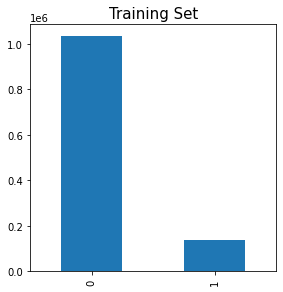

In [ ]:
#Plotting bad hole data - 3 sets
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
labeled_data.BAD_HOLE.value_counts().plot(kind='bar')
plt.title('Training Set', size=15)

#plt.subplot(2,3,2)
#test_data.BAD_HOLE.value_counts().plot(kind='bar')
#plt.title('Test Set', size=15)

#plt.subplot(2,3,3)
#hidden_data.BAD_HOLE.value_counts().plot(kind='bar')
#plt.title('Hidden Set', size=15)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



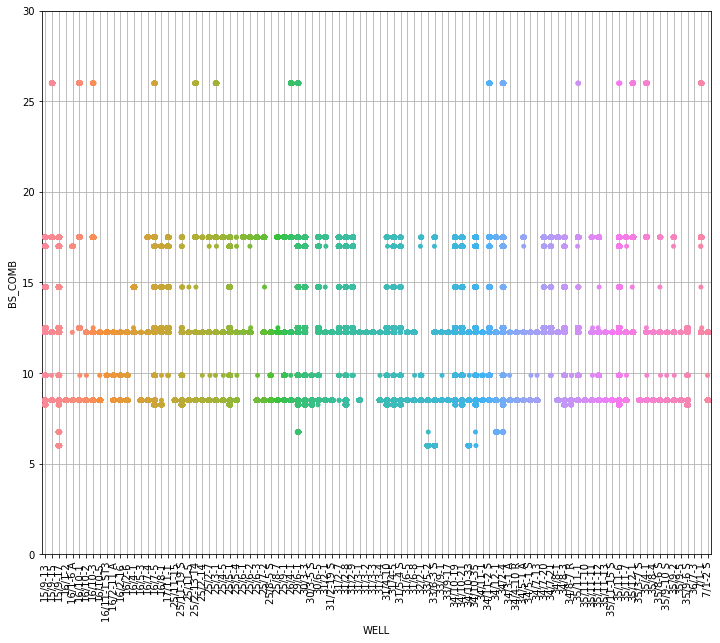

In [ ]:
#Inspecting Data
fig, x = plt.subplots(figsize=(12, 10))
sns.stripplot('WELL', 'BS_COMB', data=labeled_data, jitter=0.1 )
plt.ylim(0, 30)
plt.xticks(rotation=90)
plt.grid(True)

In [ ]:
#Dropping bad hole data

labeled_data2 = labeled_data[labeled_data.BAD_HOLE == 0]
#test_data2 = test_data[test_data.BAD_HOLE == 0]
#hidden_data2 = hidden_data[hidden_data.BAD_HOLE == 0]

In [ ]:
labeled_data.shape, labeled_data2.shape

((1033812, 34), (1033812, 34))

### Dropping Unnecessary Columns

In [ ]:
#Removing wells that were drilled before 1990

#wells_to_remove = list(locations_df[(locations_df.Dataset == 'Train') & (locations_df.Completion_Year < 1990)].WELL)
#wells_to_remove

#labeled_data = labeled_data.copy()
#labeled_data = labeled_data.drop(labeled_data[labeled_data.WELL.isin(wells_to_remove)].index).reset_index()

In [ ]:
#Storing datasets lenghts
train_len = labeled_data.shape[0]
test_len = test_data.shape[0]
hidden_len = hidden_data.shape[0]

#Storing dataset wells and depths
train_well = labeled_data.WELL.values; train_depth = labeled_data.DEPTH_MD.values
test_well = test_data.WELL.values; test_depth = test_data.DEPTH_MD.values
hidden_well = hidden_data.WELL.values; hidden_depth = hidden_data.DEPTH_MD.values

df_concat = pd.concat((labeled_data, test_data, hidden_data)).reset_index(drop=True)

In [ ]:
print('Shape of the whole data before droping', df_concat.shape)

Shape of the whole data before droping (1429694, 28)


In [ ]:
#drop_cols = ['SGR', 'ROPA', 'RXO', 'MUDWEIGHT', 'BS_FIX', 'CALI_R_MEAN', 'BS_FROM_CALI', 'BS_COMB', 'CALI_DIFF', 'BAD_HOLE']  #Columns to be dropped
drop_cols = ['SGR', 'ROPA', 'RXO', 'MUDWEIGHT']  #Columns to be dropped

df_drop = df_concat.drop(drop_cols, axis=1)
print('Shape of the whole data after droping', df_drop.shape)

Shape of the whole data after droping (1429694, 24)


### Encoding Categorical Features

In [ ]:
#dict(enumerate(df_drop.WELL.astype('category').cat.categories))

In [ ]:
df_drop['GROUP_encoded'] = df_drop['GROUP'].astype('category')
df_drop['GROUP_encoded'] = df_drop['GROUP_encoded'].cat.codes

df_drop['FORMATION_encoded'] = df_drop['FORMATION'].astype('category')
df_drop['FORMATION_encoded'] = df_drop['FORMATION_encoded'].cat.codes

df_drop['WELL_encoded'] = df_drop['WELL'].astype('category')
df_drop['WELL_encoded'] = df_drop['WELL_encoded'].cat.codes

print('Shape of the whole data after encoding', df_drop.shape)

Shape of the whole data after encoding (1429694, 27)


### Incorporating Clustering Into Daset

In [ ]:
#Clustering by usign K-MEANS
LonLat_df =  locations_df.drop(['WELL', 'WELL_HEAD', 'Drilling_Operator', 'Purpose', 'Completion_Year', 'Formation', 'Dataset'], axis=1)
location = LonLat_df[['lon', 'lat']].values

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=1)
labels = kmeans.fit_predict(location)

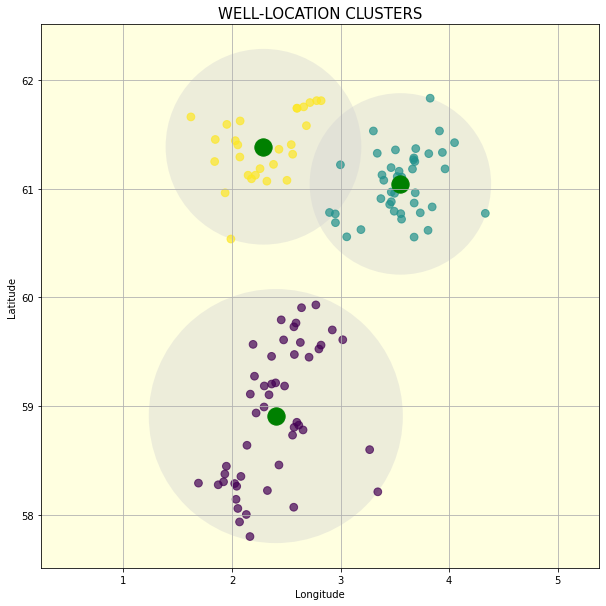

In [ ]:
#Plotting Clustered Wells
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

fig = plt.figure(figsize=((10,10)))

#Plotting the input data
ax = None or plt.gca()
ax.axis('equal')
ax.scatter(location[:, 0], location[:, 1], c=labels, s=60, cmap='viridis', zorder=1, alpha=0.7)

#Plotting KMeans Model
centers = kmeans.cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], c='g', s=300, zorder=1)
#ax.scatter(centers[:, 0], centers[:, 1], c='g', s=300, zorder=2)
radii = [cdist(location[labels == i], [center]).max() for i, center in enumerate(centers)]

for c, r in zip(centers, radii):
  ax.add_patch(plt.Circle(c, r, fc='lightgray', lw=2, alpha=0.4, zorder=0))

ax = plt.gca()
ax.set_facecolor('lightyellow')
ax.set_title('WELL-LOCATION CLUSTERS', size=15)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
#ax.set_xlim(0,5)
#ax.set_ylim(55,65)
plt.grid()

In [ ]:
#Incorporating Clusters into the Dataset
df_drop = df_drop.rename(columns={'WELL':'Cluster'})
clust_map = dict(zip(locations_df.WELL.values, labels))
df_drop['Cluster'] = df_drop['Cluster'].map(clust_map)

In [ ]:
#Dropping not needed features
df_drop2 = df_drop.drop(['GROUP', 'FORMATION'], axis=1)

## ***PREDICTING ADDITIONAL LOGS AND THEN LITHOLOGY*** 

In [ ]:
#Complete Training and Validation sets
traindata = df_drop2[:train_len].copy()
testdata = df_drop2[train_len:(train_len+test_len)].copy()
hiddendata = df_drop2[(train_len+test_len):].copy()

#Cheching datasets shapes before argumentation
print('Raw Training data shape is {}'.format(traindata.shape))
print('Testing data shape is {}'.format(testdata.shape))
print('Hidden data shape is {}'.format(hiddendata.shape))

Raw Training data shape is (1170511, 25)
Testing data shape is (136786, 25)
Hidden data shape is (122397, 25)


#### PREDICTING DTS 

In [ ]:
from sklearn.model_selection import train_test_split

# DTS training Data
traindata_dts = traindata[traindata.DTS.notna()]

#Labels and faatures
X_dts = traindata_dts.drop(['LITHO', 'DTS'], axis=1)
Y_dts = traindata_dts['DTS']

#Imputation
X_dts_inp = X_dts.apply(lambda x: x.fillna(x.median()), axis=0)

#Spliting into dts_train and dts_validation sets
X_dts_train, X_dts_val, Y_dts_train, Y_dts_val = train_test_split(X_dts_inp, Y_dts, test_size=0.3, random_state=42)

print('Splitted training data shape is {} and validation data shape is {}'.format(X_dts_train.shape, X_dts_val.shape))

Splitted training data shape is (122229, 23) and validation data shape is (52384, 23)


In [ ]:
#Predicting DTS
from sklearn.metrics import max_error
from xgboost import XGBRegressor

model1000 = XGBRegressor()
model1000.fit(#
              #
              #
              #
              #)

train_pred = model1000.predict(X_dts_train)
val_pred = model1000.predict(X_dts_val)

print('Train error:', max_error(Y_dts_train, train_pred))
print('Validation error:', max_error(Y_dts_val, val_pred))

[17:24:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:194.561
Will train until validation_0-rmse hasn't improved in 100 rounds.
[99]	validation_0-rmse:15.8819
Train error: 254.40209960593745
Validation error: 219.88970947710936


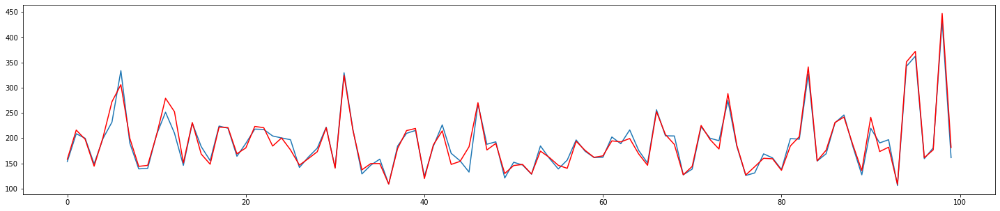

In [ ]:
#Visual check on the predictions (Validation Set)
plt.figure(figsize=(25, 5))
plt.plot(list(range(100)), Y_dts_val[25000:25100])
plt.plot(list(range(100)), val_pred[25000:25100], color='r')

In [ ]:
traindata.columns

Index(['Cluster', 'DEPTH_MD', 'X_LOC', 'Y_LOC', 'Z_LOC', 'CALI', 'RSHA',
       'RMED', 'RDEP', 'RHOB', 'GR', 'NPHI', 'PEF', 'DTC', 'SP', 'BS', 'ROP',
       'DTS', 'DCAL', 'DRHO', 'RMIC', 'LITHO', 'GROUP_encoded',
       'FORMATION_encoded', 'WELL_encoded'],
      dtype='object')

In [ ]:
# Filling nan values before predicting DTS
X_train_DTS = traindata.drop(['LITHO', 'DTS'], axis=1)
X_train_DTS2 = X_train_DTS.apply(lambda x: x.fillna(x.median()), axis=0)

X_test_DTS = testdata.drop(['LITHO', 'DTS'], axis=1)
X_test_DTS2 = X_test_DTS.apply(lambda x: x.fillna(x.median()), axis=0)

X_hidden_DTS = hiddendata.drop(['LITHO', 'DTS'], axis=1)
X_hidden_DTS2 = X_hidden_DTS.apply(lambda x: x.fillna(x.median()), axis=0)

#Predicting DTS (COMPLETE DATASETS)
traindata['DTS_pred'] = model1000.predict(X_train_DTS2)
#
#

#Inputing nan values in DTS with DTS_PREDICTED
#
#
#
#
#

#### PREDICTING NPHI

In [ ]:
# NPHI training Data
traindata_nphi = traindata[traindata.NPHI.notna()]

#Labels and fatures
X_nphi = traindata_nphi.drop(['LITHO', 'DTS', 'DTS_pred', 'NPHI'], axis=1)
Y_nphi = traindata_nphi['NPHI']

#Imputation
X_nphi_inp = X_nphi.apply(lambda x: x.fillna(x.median()), axis=0)

#Spliting into dts_train and dts_validation sets
X_nphi_train, X_nphi_val, Y_nphi_train, Y_nphi_val = train_test_split(X_nphi_inp, Y_nphi, test_size=0.3, random_state=42)

print('Splitted training data shape is {} and validation data shape is {}'.format(X_nphi_train.shape, X_nphi_val.shape))

Splitted training data shape is (535786, 23) and validation data shape is (229623, 23)


In [ ]:
# Predicting NPHI
from sklearn.metrics import max_error
from xgboost import XGBRegressor

model2000 = XGBRegressor()
#
#
#

train_pred = model2000.predict(X_nphi_train)
val_pred = model2000.predict(X_nphi_val)

print('Train error:', max_error(Y_nphi_train, train_pred))
print('Validation error:', max_error(Y_nphi_val, val_pred))

[17:24:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.194089
Will train until validation_0-rmse hasn't improved in 100 rounds.
[99]	validation_0-rmse:0.052543
Train error: 0.5899896621906738
Validation error: 0.5661860405991241


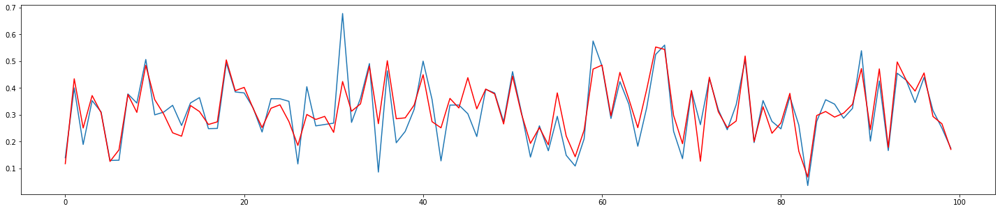

In [ ]:
#Visual check on the predictions (Validation Set)
plt.figure(figsize=(25, 5))
plt.plot(list(range(100)), Y_nphi_val[25000:25100])
plt.plot(list(range(100)), val_pred[25000:25100], color='r')

In [ ]:
# Filling nan values before predicting NPHI
X_train_NPHI = traindata.drop(['LITHO', 'DTS', 'DTS_pred', 'NPHI'], axis=1)
X_train_NPHI2 = X_train_NPHI.apply(lambda x: x.fillna(x.median()), axis=0)

X_test_NPHI = testdata.drop(['LITHO', 'DTS', 'DTS_pred', 'NPHI'], axis=1)
X_test_NPHI2 = X_test_NPHI.apply(lambda x: x.fillna(x.median()), axis=0)

X_hidden_NPHI = hiddendata.drop(['LITHO', 'DTS', 'DTS_pred', 'NPHI'], axis=1)
X_hidden_NPHI2 = X_hidden_NPHI.apply(lambda x: x.fillna(x.median()), axis=0)

#Predicting DTS (COMPLETE DATASETS)
traindata['NPHI_pred'] = model2000.predict(X_train_NPHI2)
testdata['NPHI_pred'] = model2000.predict(X_test_NPHI2)
hiddendata['NPHI_pred'] = model2000.predict(X_hidden_NPHI2)

#Inputing nan values in DTS with DTS_PREDICTED
traindata['NPHI_COMB'] = traindata['NPHI']
traindata['NPHI_COMB'].fillna(traindata['NPHI_pred'], inplace=True)

testdata['NPHI_COMB'] = testdata['NPHI']
testdata['NPHI_COMB'].fillna(testdata['NPHI_pred'], inplace=True)

hiddendata['NPHI_COMB'] = hiddendata['NPHI']
hiddendata['NPHI_COMB'].fillna(hiddendata['NPHI_pred'], inplace=True)

#### PREDICTING RHOB (No improvements)

In [ ]:
# RHOB training Data
traindata_rhob = traindata[traindata.RHOB.notna()]

#Labels and fatures
X_rhob = traindata_rhob.drop(['LITHO', 'DTS', 'DTS_pred', 'NPHI', 'NPHI_pred', 'RHOB'], axis=1)
Y_rhob = traindata_rhob['RHOB']

#Imputation
X_rhob_inp = X_rhob.apply(lambda x: x.fillna(x.median()), axis=0)

#Spliting into dts_train and dts_validation sets
X_rhob_train, X_rhob_val, Y_rhob_train, Y_rhob_val = train_test_split(X_rhob_inp, Y_rhob, test_size=0.3, random_state=42)

print('Splitted training data shape is {} and validation data shape is {}'.format(X_rhob_train.shape, X_rhob_val.shape))

Splitted training data shape is (706469, 23) and validation data shape is (302773, 23)


In [ ]:
#Predicting RHOB
from sklearn.metrics import max_error
from xgboost import XGBRegressor

model4000 = XGBRegressor()
model4000.fit(X_rhob_train, Y_rhob_train.values.ravel(), early_stopping_rounds=100, eval_set=[(X_rhob_val, Y_rhob_val)], verbose=100)

train_pred = model4000.predict(X_rhob_train)
val_pred = model4000.predict(X_rhob_val)

print('Train error:', max_error(Y_rhob_train, train_pred))
print('Validation error:', max_error(Y_rhob_val, val_pred))

[13:21:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:1.62403
Will train until validation_0-rmse hasn't improved in 100 rounds.
[99]	validation_0-rmse:0.091064
Train error: 1.380820691539795
Validation error: 1.2363325357057617


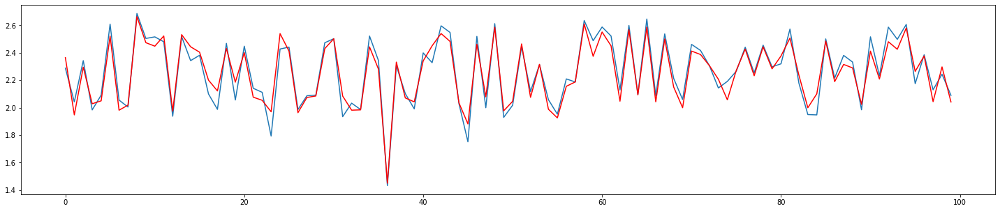

In [ ]:
#Visual check on the predictions (Validation Set)
plt.figure(figsize=(25, 5))
plt.plot(list(range(100)), Y_rhob_val[25000:25100])
plt.plot(list(range(100)), val_pred[25000:25100], color='r')

In [ ]:
# Filling nan values before predicting NPHI
X_train_RHOB = traindata.drop(['LITHO', 'DTS', 'DTS_pred', 'NPHI', 'NPHI_pred', 'RHOB'], axis=1)
X_train_RHOB2 = X_train_RHOB.apply(lambda x: x.fillna(x.median()), axis=0)

X_test_RHOB = testdata.drop(['LITHO', 'DTS', 'DTS_pred', 'NPHI', 'NPHI_pred', 'RHOB'], axis=1)
X_test_RHOB2 = X_test_RHOB.apply(lambda x: x.fillna(x.median()), axis=0)

X_hidden_RHOB = hiddendata.drop(['LITHO', 'DTS', 'DTS_pred', 'NPHI', 'NPHI_pred', 'RHOB'], axis=1)
X_hidden_RHOB2 = X_hidden_RHOB.apply(lambda x: x.fillna(x.median()), axis=0)

#Predicting DTS (COMPLETE DATASETS)
traindata['RHOB_pred'] = model4000.predict(X_train_RHOB2)
testdata['RHOB_pred'] = model4000.predict(X_test_RHOB2)
hiddendata['RHOB_pred'] = model4000.predict(X_hidden_RHOB2)

#Inputing nan values in DTS with DTS_PREDICTED
traindata['RHOB_COMB'] = traindata['RHOB']
traindata['RHOB_COMB'].fillna(traindata['RHOB_pred'], inplace=True)

testdata['RHOB_COMB'] = testdata['RHOB']
testdata['RHOB_COMB'].fillna(testdata['RHOB_pred'], inplace=True)

hiddendata['RHOB_COMB'] = hiddendata['RHOB']
hiddendata['RHOB_COMB'].fillna(hiddendata['RHOB_pred'], inplace=True)

#### PREDICTING DTC (Worsened results)

In [ ]:
# DTC training Data
traindata_dtc = traindata[traindata.DTC.notna()]

#Labels and fatures
X_dtc = traindata_dtc.drop(['LITHO', 'DTS', 'DTS_pred', 'NPHI', 'NPHI_pred', 'RHOB', 'RHOB_pred', 'DTC'], axis=1)
Y_dtc = traindata_dtc['DTC']

#Imputation
X_dtc_inp = X_dtc.apply(lambda x: x.fillna(x.median()), axis=0)

#Spliting into dts_train and dts_validation sets
X_dtc_train, X_dtc_val, Y_dtc_train, Y_dtc_val = train_test_split(X_dtc_inp, Y_dtc, test_size=0.3, random_state=42)

print('Splitted training data shape is {} and validation data shape is {}'.format(X_dtc_train.shape, X_dtc_val.shape))


Splitted training data shape is (762753, 23) and validation data shape is (326895, 23)


In [ ]:
#Predicting DTC
from sklearn.metrics import max_error
from xgboost import XGBRegressor

model3000 = XGBRegressor()
model3000.fit(X_dtc_train, Y_dtc_train.values.ravel(), early_stopping_rounds=100, eval_set=[(X_dtc_val, Y_dtc_val)], verbose=100)

train_pred = model3000.predict(X_dtc_train)
val_pred = model3000.predict(X_dtc_val)

print('Train error:', max_error(Y_dtc_train, train_pred))
print('Validation error:', max_error(Y_dtc_val, val_pred))

[13:23:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:105.123
Will train until validation_0-rmse hasn't improved in 100 rounds.
[99]	validation_0-rmse:5.24272
Train error: 162.3106994669531
Validation error: 115.24967956183593


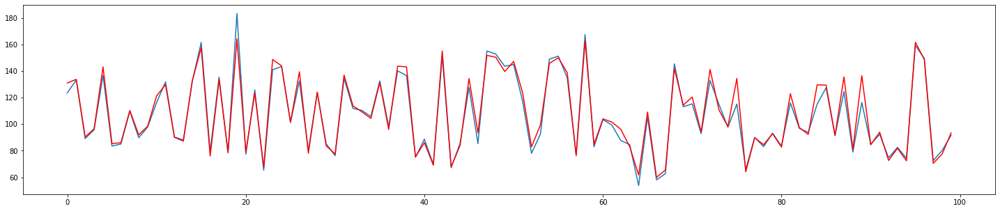

In [ ]:
#Visual check on the predictions (Validation Set)
plt.figure(figsize=(25, 5))
plt.plot(list(range(100)), Y_dtc_val[25000:25100])
plt.plot(list(range(100)), val_pred[25000:25100], color='r')

In [ ]:
# Filling nan values before predicting NPHI
X_train_DTC = traindata.drop(['LITHO', 'DTS', 'DTS_pred', 'NPHI', 'NPHI_pred', 'RHOB', 'RHOB_pred', 'DTC'], axis=1)
X_train_DTC2 = X_train_DTC.apply(lambda x: x.fillna(x.median()), axis=0)

X_test_DTC = testdata.drop(['LITHO', 'DTS', 'DTS_pred', 'NPHI', 'NPHI_pred', 'RHOB', 'RHOB_pred', 'DTC'], axis=1)
X_test_DTC2 = X_test_DTC.apply(lambda x: x.fillna(x.median()), axis=0)

X_hidden_DTC = hiddendata.drop(['LITHO', 'DTS', 'DTS_pred', 'NPHI', 'NPHI_pred', 'RHOB', 'RHOB_pred', 'DTC'], axis=1)
X_hidden_DTC2 = X_hidden_DTC.apply(lambda x: x.fillna(x.median()), axis=0)

#Predicting DTS (COMPLETE DATASETS)
traindata['DTC_pred'] = model3000.predict(X_train_DTC2)
testdata['DTC_pred'] = model3000.predict(X_test_DTC2)
hiddendata['DTC_pred'] = model3000.predict(X_hidden_DTC2)

#Inputing nan values in DTS with DTS_PREDICTED
traindata['DTC_COMB'] = traindata['DTC']
traindata['DTC_COMB'].fillna(traindata['DTC_pred'], inplace=True)

testdata['DTC_COMB'] = testdata['DTC']
testdata['DTC_COMB'].fillna(testdata['DTC_pred'], inplace=True)

hiddendata['DTC_COMB'] = hiddendata['DTC']
hiddendata['DTC_COMB'].fillna(hiddendata['DTC_pred'], inplace=True)

#### CALCULATING ADDITIONAL WELL LOG-BASED PROPERTIES

In [ ]:
#Train Set
#
#
#
#
#
#
#
#
#
#

#### PREDICTING LITHOLOGY

In [ ]:
traindata.columns

Index(['Cluster', 'DEPTH_MD', 'X_LOC', 'Y_LOC', 'Z_LOC', 'CALI', 'RSHA',
       'RMED', 'RDEP', 'RHOB', 'GR', 'NPHI', 'PEF', 'DTC', 'SP', 'BS', 'ROP',
       'DTS', 'DCAL', 'DRHO', 'RMIC', 'LITHO', 'GROUP_encoded',
       'FORMATION_encoded', 'WELL_encoded', 'DTS_pred', 'DTS_COMB',
       'NPHI_pred', 'NPHI_COMB', 'RHOB_pred', 'RHOB_COMB', 'DTC_pred',
       'DTC_COMB', 'AI', 'AI_P', 'DT_R', 'GM', 'K', 'MD_TVD'],
      dtype='object')

In [ ]:
#Features Complet Set
features_names = ['DEPTH_MD', 'X_LOC', 'Y_LOC', 'Z_LOC', 'CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB_COMB', 'GR', 
                  'NPHI_COMB', 'PEF', 'DTC_COMB', 'SP', 'BS', 'ROP', 'DCAL', 'DRHO', 'RMIC', 'GROUP_encoded', 
                  'FORMATION_encoded', 'WELL_encoded', 'Cluster', 'DTS_COMB', 'AI', 'AI_P', 'DT_R', 
                  'GM', 'K', 'MD_TVD'
                  ]

In [ ]:
#K-Best Feature Selection 
features_names = ['RDEP','GR', 'NPHI_COMB', 'GM', 'AI_P', 'AI', 'DTC', 'DTS_COMB', 'RSHA', 'DT_R', 'RHOB', 
                  'K', 'DCAL', 'Y_LOC', 'Cluster', 'GROUP_encoded', 'WELL_encoded', 'FORMATION_encoded', 
                  'DEPTH_MD', 'Z_LOC', 'CALI', 'BS', 'X_LOC', 'RMED', 'PEF', 'SP', #'MD_TVD', 'ROP','RMIC','DRHO'
                  ]

In [ ]:
#Recursive Feature Selection 
features_names = ['GROUP_encoded', 'Cluster', 'GR','FORMATION_encoded','NPHI','WELL_encoded',
                  'Y_LOC','K','BS','GM','Z_LOC','RMED','DTS_COMB','X_LOC','RHOB','DTC','CALI',
                  'DT_R','DEPTH_MD','DCAL','MD_TVD','RMIC','SP','DRHO','PEF','RSHA','ROP','AI']

In [ ]:
## PREDICTING LITHO
#x_train = traindata.drop(['LITHO', 'Cluster'], axis=1)
x_train = traindata[features_names]
y_train = traindata['LITHO']

#x_test = testdata.drop(['LITHO', 'Cluster'], axis=1)
x_test = testdata[features_names]
y_test = testdata['LITHO']

#x_hidden = hiddendata.drop(['LITHO', 'Cluster'], axis=1)
x_hidden = hiddendata[features_names]
y_hidden = hiddendata['LITHO']

#Cheching datasets shapes before argumentation
print('Training data shape is {} and {}'.format(x_train.shape, y_train.shape))
print('Testing data shape is {} and {}'.format(x_test.shape, y_test.shape))
print('Hidden data shape is {} and {}'.format(x_hidden.shape, y_hidden.shape))

Training data shape is (1170511, 26) and (1170511,)
Testing data shape is (136786, 26) and (136786,)
Hidden data shape is (122397, 26) and (122397,)


In [ ]:
from sklearn.preprocessing import StandardScaler, Normalizer, MinMaxScaler
std = StandardScaler()
x_train_std = x_train.copy()
x_test_std = x_test.copy()
x_hidden_std = x_hidden.copy()

x_train_std.iloc[:,:27] = std.fit_transform(x_train_std.iloc[:,:27])
x_test_std.iloc[:,:27] = std.transform(x_test_std.iloc[:,:27])
x_hidden_std.iloc[:,:27] = std.transform(x_hidden_std.iloc[:,:27])

In [ ]:
x_train = x_train_std
x_test = x_test_std
x_hidden = x_hidden_std

In [ ]:
#Inputing Data
x_train = x_train.apply(lambda x: x.fillna(x.median()), axis=0)
x_test = x_test.apply(lambda x: x.fillna(x.median()), axis=0)
x_hidden = x_hidden.apply(lambda x: x.fillna(x.median()), axis=0)

In [ ]:
#Predicting Lithology

from xgboost import XGBClassifier

model_500 = XGBClassifier(#
                          #
                          #
                          #
                          #)

model_500.fit(x_train, y_train.values, early_stopping_rounds=100, eval_set=[(x_test, y_test)], verbose=100)

train_pred_xgb = model_500.predict(x_train)
open_pred_xgb = model_500.predict(x_test)
hidden_pred_xgb = model_500.predict(x_hidden)

#Printing Reports
print('-----------------------TRAIN SET REPORT---------------------')
print('Open set penalty matrix score:', score(y_train.values, train_pred_xgb))
print('Open set report:', metrics_report2(y_train.values, train_pred_xgb))
print('-----------------------OPEN SET REPORT---------------------')
print('Open set penalty matrix score:', score(y_test.values, open_pred_xgb))
print('Open set report:', metrics_report2(y_test.values, open_pred_xgb))
print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_xgb))
print('Hidden set report:', metrics_report2(y_hidden.values, hidden_pred_xgb))

[0]	validation_0-mlogloss:2.2424
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.690967
-----------------------TRAIN SET REPORT---------------------
Open set penalty matrix score: -0.27943874512926403
Open set report:               METRIC
Accuracy       89.41
F1 score       89.03
Recall         89.41
Precision      89.11
Matrix Score   -0.28
-----------------------OPEN SET REPORT---------------------
Open set penalty matrix score: -0.548224964543155


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               METRIC
Accuracy       78.97
F1 score       76.43
Recall         78.97
Precision      76.41
Matrix Score   -0.55
-----------------------HIDDEN SET REPORT---------------------
Hidden set penalty matrix score: -0.44173774684020034
Hidden set report:               METRIC
Accuracy       82.04
F1 score       80.82
Recall         82.04
Precision      80.80
Matrix Score   -0.44


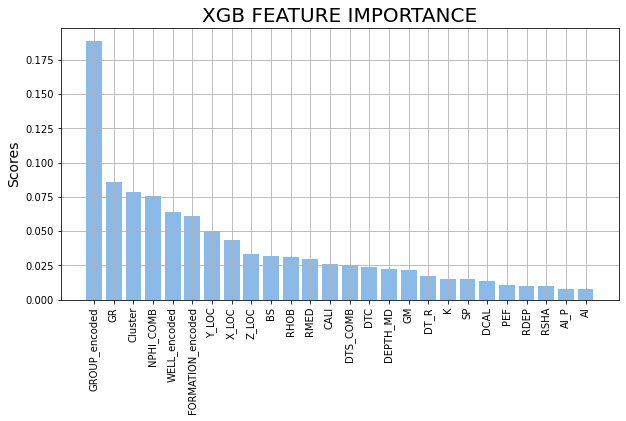

In [ ]:
imp = model_500.feature_importances_
t = pd.DataFrame({'FEATURES':x_train.columns, 'IMPORTANCE':imp}).sort_values('IMPORTANCE', ascending=False)

#Visualizing Accuracies
f, ax = plt.subplots(figsize=(10,5))
x_pos = np.arange(len(x_train.columns))

#Create Bars
ax.bar(x_pos, np.array(t.IMPORTANCE), color=(0.5, 0.7, 0.9, 0.9))
ax.set_ylabel('Scores', size=14)
ax.set_title('XGB FEATURE IMPORTANCE', size=20)

plt.xticks(x_pos, t.FEATURES, rotation=90)
plt.grid(True)
plt.show()

In [ ]:
model_rf_tuned = RandomForestClassifier(#
                                        #
                                        #
                                        #
                                        #)

# Fit the regressor to the training data
model_rf_tuned.fit(x_train, y_train.values.ravel())

# Prediction
train_rf = model_rf_tuned.predict(x_train)
open_rf = model_rf_tuned.predict(x_test)
hidden_rf = model_rf_tuned.predict(x_hidden)

#Printing Reports
print('-----------------------TRAIN SET REPORT---------------------')
print('Training  set penalty matrix score:', score(y_train.values, train_rf))
print('Training set report:', metrics_report2(y_train.values, train_rf))
print('-----------------------OPEN SET REPORT---------------------')
print('Open set penalty matrix score:', score(y_test.values, open_rf))
print('Open set report:', metrics_report2(y_test.values, open_rf))
print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_rf))
print('Hidden set report:', metrics_report2(y_hidden.values, hidden_rf))

In [ ]:
#Sampling Standarized Tarining Data to Optimize Time - DEPLOYING BASE MODEL
#Merging train data
new_train = pd.concat((x_train, pd.DataFrame(y_train, columns=["LITHO"])), axis=1)

#Randomly sampling data
sampled_train = new_train.sample(n=50000, random_state=0)
#sampled_train['LITHO'].value_counts()

#Spliting training data
x_train = sampled_train.drop(["LITHO"], axis=1)
y_train = sampled_train["LITHO"]

#Hyper-parameter tunning
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

model_rf = RandomForestClassifier(random_state=1)

param_grid = {'n_estimators': [100], #[int(x) for x in np.linspace(start = 200, stop = 1000, num = 10)],
                 'max_depth': [int(x) for x in np.linspace(5, 110, num = 15)],
                 'max_features': ['auto', 'sqrt'],
                 #'min_samples_split': [2, 5, 10, 15, 20],
                 'min_samples_leaf' : [1, 2, 4],
                 'criterion': ['gini','entropy'],
                 'bootstrap' : [True, False],
                 #'ccp_alpha': np.arange(1, 11)/1000
                }

model_cv = RandomizedSearchCV(estimator=model_rf, param_distributions=param_grid, n_iter=25, scoring='accuracy', verbose=10, n_jobs=1, cv=5)
model_cv.fit(x_train, y_train)

print("Best score is: {}".format(model_cv.best_score_))
print("Tuned Model Parameter: {}".format(model_cv.best_params_))

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] n_estimators=100, min_samples_leaf=4, max_features=sqrt, max_depth=42, criterion=gini, bootstrap=False 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  n_estimators=100, min_samples_leaf=4, max_features=sqrt, max_depth=42, criterion=gini, bootstrap=False, score=0.895, total=  30.8s
[CV] n_estimators=100, min_samples_leaf=4, max_features=sqrt, max_depth=42, criterion=gini, bootstrap=False 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   30.8s remaining:    0.0s


[CV]  n_estimators=100, min_samples_leaf=4, max_features=sqrt, max_depth=42, criterion=gini, bootstrap=False, score=0.895, total=  30.5s
[CV] n_estimators=100, min_samples_leaf=4, max_features=sqrt, max_depth=42, criterion=gini, bootstrap=False 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  1.0min remaining:    0.0s


[CV]  n_estimators=100, min_samples_leaf=4, max_features=sqrt, max_depth=42, criterion=gini, bootstrap=False, score=0.890, total=  30.6s
[CV] n_estimators=100, min_samples_leaf=4, max_features=sqrt, max_depth=42, criterion=gini, bootstrap=False 


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:  1.5min remaining:    0.0s


[CV]  n_estimators=100, min_samples_leaf=4, max_features=sqrt, max_depth=42, criterion=gini, bootstrap=False, score=0.893, total=  30.7s
[CV] n_estimators=100, min_samples_leaf=4, max_features=sqrt, max_depth=42, criterion=gini, bootstrap=False 


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:  2.0min remaining:    0.0s


[CV]  n_estimators=100, min_samples_leaf=4, max_features=sqrt, max_depth=42, criterion=gini, bootstrap=False, score=0.888, total=  31.0s
[CV] n_estimators=100, min_samples_leaf=1, max_features=auto, max_depth=35, criterion=gini, bootstrap=True 


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.6min remaining:    0.0s


[CV]  n_estimators=100, min_samples_leaf=1, max_features=auto, max_depth=35, criterion=gini, bootstrap=True, score=0.898, total=  20.5s
[CV] n_estimators=100, min_samples_leaf=1, max_features=auto, max_depth=35, criterion=gini, bootstrap=True 


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  2.9min remaining:    0.0s


[CV]  n_estimators=100, min_samples_leaf=1, max_features=auto, max_depth=35, criterion=gini, bootstrap=True, score=0.896, total=  20.5s
[CV] n_estimators=100, min_samples_leaf=1, max_features=auto, max_depth=35, criterion=gini, bootstrap=True 


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:  3.2min remaining:    0.0s


[CV]  n_estimators=100, min_samples_leaf=1, max_features=auto, max_depth=35, criterion=gini, bootstrap=True, score=0.891, total=  20.4s
[CV] n_estimators=100, min_samples_leaf=1, max_features=auto, max_depth=35, criterion=gini, bootstrap=True 


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  3.6min remaining:    0.0s


[CV]  n_estimators=100, min_samples_leaf=1, max_features=auto, max_depth=35, criterion=gini, bootstrap=True, score=0.896, total=  20.8s
[CV] n_estimators=100, min_samples_leaf=1, max_features=auto, max_depth=35, criterion=gini, bootstrap=True 


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  3.9min remaining:    0.0s


[CV]  n_estimators=100, min_samples_leaf=1, max_features=auto, max_depth=35, criterion=gini, bootstrap=True, score=0.892, total=  20.4s
[CV] n_estimators=100, min_samples_leaf=1, max_features=sqrt, max_depth=95, criterion=entropy, bootstrap=False 
[CV]  n_estimators=100, min_samples_leaf=1, max_features=sqrt, max_depth=95, criterion=entropy, bootstrap=False, score=0.903, total= 1.3min
[CV] n_estimators=100, min_samples_leaf=1, max_features=sqrt, max_depth=95, criterion=entropy, bootstrap=False 
[CV]  n_estimators=100, min_samples_leaf=1, max_features=sqrt, max_depth=95, criterion=entropy, bootstrap=False, score=0.902, total= 1.3min
[CV] n_estimators=100, min_samples_leaf=1, max_features=sqrt, max_depth=95, criterion=entropy, bootstrap=False 
[CV]  n_estimators=100, min_samples_leaf=1, max_features=sqrt, max_depth=95, criterion=entropy, bootstrap=False, score=0.897, total= 1.3min
[CV] n_estimators=100, min_samples_leaf=1, max_features=sqrt, max_depth=95, criterion=entropy, bootstrap=Fal

In [ ]:
#Sampling Standarized Tarining Data to Optimize Time - DEPLOYING BASE MODEL
#Merging train data
new_train = pd.concat((x_train, pd.DataFrame(y_train, columns=["LITHO"])), axis=1)

#Randomly sampling data
sampled_train = new_train.sample(n=50000, random_state=0)
#sampled_train['LITHO'].value_counts()

#Spliting training data
x_train = sampled_train.drop(["LITHO"], axis=1)
y_train = sampled_train["LITHO"]

#Hyper-parameter tunning
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

model_rf = RandomForestClassifier(random_state=1)

param_grid = {'n_estimators': [100], #[int(x) for x in np.linspace(start = 200, stop = 1000, num = 10)],
                 'max_depth': [int(x) for x in np.linspace(5, 110, num = 15)],
                 'max_features': ['auto', 'sqrt'],
                 #'min_samples_split': [2, 5, 10, 15, 20],
                 'min_samples_leaf' : [1, 2, 4],
                 'criterion': ['gini','entropy'],
                 'bootstrap' : [True, False],
                 #'ccp_alpha': np.arange(1, 11)/1000
                }

model_cv = RandomizedSearchCV(estimator=model_rf, param_distributions=param_grid, n_iter=25, scoring='accuracy', verbose=10, n_jobs=1, cv=5)
model_cv.fit(x_train, y_train)

print("Best score is: {}".format(model_cv.best_score_))
print("Tuned Model Parameter: {}".format(model_cv.best_params_))

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] n_estimators=733, min_samples_leaf=1, max_features=sqrt, max_depth=50, criterion=entropy, bootstrap=False 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  n_estimators=733, min_samples_leaf=1, max_features=sqrt, max_depth=50, criterion=entropy, bootstrap=False, score=0.904, total=10.8min
[CV] n_estimators=733, min_samples_leaf=1, max_features=sqrt, max_depth=50, criterion=entropy, bootstrap=False 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 10.8min remaining:    0.0s


[CV]  n_estimators=733, min_samples_leaf=1, max_features=sqrt, max_depth=50, criterion=entropy, bootstrap=False, score=0.904, total=10.9min
[CV] n_estimators=733, min_samples_leaf=1, max_features=sqrt, max_depth=50, criterion=entropy, bootstrap=False 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed: 21.7min remaining:    0.0s


[CV]  n_estimators=733, min_samples_leaf=1, max_features=sqrt, max_depth=50, criterion=entropy, bootstrap=False, score=0.898, total=10.7min
[CV] n_estimators=733, min_samples_leaf=1, max_features=sqrt, max_depth=50, criterion=entropy, bootstrap=False 


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed: 32.4min remaining:    0.0s


[CV]  n_estimators=733, min_samples_leaf=1, max_features=sqrt, max_depth=50, criterion=entropy, bootstrap=False, score=0.903, total=10.5min
[CV] n_estimators=733, min_samples_leaf=1, max_features=sqrt, max_depth=50, criterion=entropy, bootstrap=False 


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed: 42.9min remaining:    0.0s


[CV]  n_estimators=733, min_samples_leaf=1, max_features=sqrt, max_depth=50, criterion=entropy, bootstrap=False, score=0.898, total=10.6min
[CV] n_estimators=377, min_samples_leaf=1, max_features=auto, max_depth=42, criterion=entropy, bootstrap=False 


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed: 53.5min remaining:    0.0s


[CV]  n_estimators=377, min_samples_leaf=1, max_features=auto, max_depth=42, criterion=entropy, bootstrap=False, score=0.905, total= 5.5min
[CV] n_estimators=377, min_samples_leaf=1, max_features=auto, max_depth=42, criterion=entropy, bootstrap=False 


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed: 59.1min remaining:    0.0s


[CV]  n_estimators=377, min_samples_leaf=1, max_features=auto, max_depth=42, criterion=entropy, bootstrap=False, score=0.905, total= 5.5min
[CV] n_estimators=377, min_samples_leaf=1, max_features=auto, max_depth=42, criterion=entropy, bootstrap=False 


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed: 64.7min remaining:    0.0s


[CV]  n_estimators=377, min_samples_leaf=1, max_features=auto, max_depth=42, criterion=entropy, bootstrap=False, score=0.898, total= 5.5min
[CV] n_estimators=377, min_samples_leaf=1, max_features=auto, max_depth=42, criterion=entropy, bootstrap=False 


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed: 70.2min remaining:    0.0s


[CV]  n_estimators=377, min_samples_leaf=1, max_features=auto, max_depth=42, criterion=entropy, bootstrap=False, score=0.903, total= 5.5min
[CV] n_estimators=377, min_samples_leaf=1, max_features=auto, max_depth=42, criterion=entropy, bootstrap=False 


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed: 75.7min remaining:    0.0s


[CV]  n_estimators=377, min_samples_leaf=1, max_features=auto, max_depth=42, criterion=entropy, bootstrap=False, score=0.897, total= 5.5min
[CV] n_estimators=1000, min_samples_leaf=4, max_features=auto, max_depth=27, criterion=gini, bootstrap=True 
[CV]  n_estimators=1000, min_samples_leaf=4, max_features=auto, max_depth=27, criterion=gini, bootstrap=True, score=0.885, total= 3.4min
[CV] n_estimators=1000, min_samples_leaf=4, max_features=auto, max_depth=27, criterion=gini, bootstrap=True 
[CV]  n_estimators=1000, min_samples_leaf=4, max_features=auto, max_depth=27, criterion=gini, bootstrap=True, score=0.888, total= 3.4min
[CV] n_estimators=1000, min_samples_leaf=4, max_features=auto, max_depth=27, criterion=gini, bootstrap=True 
[CV]  n_estimators=1000, min_samples_leaf=4, max_features=auto, max_depth=27, criterion=gini, bootstrap=True, score=0.882, total= 3.4min
[CV] n_estimators=1000, min_samples_leaf=4, max_features=auto, max_depth=27, criterion=gini, bootstrap=True 
[CV]  n_estim

#### PCA's

In [ ]:
#PCA's IMPLEMENTATION
from sklearn.decomposition import PCA

pca = PCA()
pca_data = pca.fit_transform(x_train)
pca_test = pca.transform(x_test)
pca_hidden = pca.transform(x_hidden)
#pca_data = pca.transform(x_train)

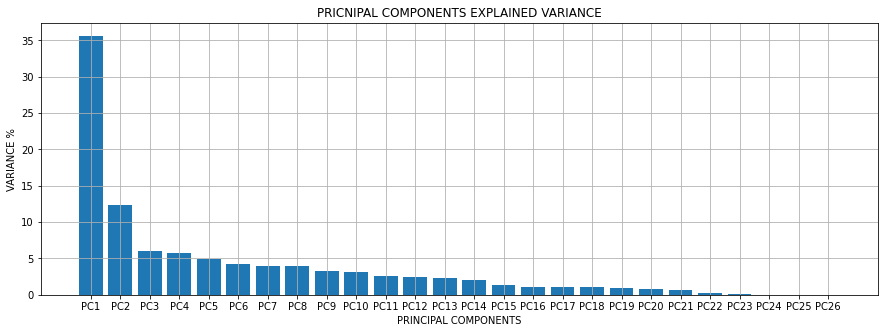

In [ ]:
per_var = np.round(pca.explained_variance_ratio_*100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]
plt.figure(figsize=(15, 5))
plt.bar(x=range(1, len(per_var)+1), height=per_var, tick_label=labels)
plt.title('PRICNIPAL COMPONENTS EXPLAINED VARIANCE')
plt.xlabel('PRINCIPAL COMPONENTS')
plt.ylabel('VARIANCE %')
plt.grid()
plt.show()

In [ ]:
pca_df_train = pd.DataFrame(pca_data, columns=labels)
pca_df_test = pd.DataFrame(pca_test, columns=labels)
pca_df_hidden = pd.DataFrame(pca_hidden, columns=labels)

In [ ]:
pca_df_hidden.columns, pca_df_test.columns

(Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
        'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19',
        'PC20', 'PC21', 'PC22', 'PC23', 'PC24', 'PC25', 'PC26'],
       dtype='object'),
 Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
        'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19',
        'PC20', 'PC21', 'PC22', 'PC23', 'PC24', 'PC25', 'PC26'],
       dtype='object'))

In [ ]:
x_train = pca_df_train[['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
        'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19',
        'PC20', 'PC21', 'PC22', 'PC23', 'PC24', 'PC25', 'PC26']]
x_test = pca_df_test[['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
        'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19',
        'PC20', 'PC21', 'PC22', 'PC23', 'PC24', 'PC25', 'PC26']]
x_hidden = pca_df_hidden[['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
        'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19',
        'PC20', 'PC21', 'PC22', 'PC23', 'PC24', 'PC25', 'PC26']]

In [ ]:
#Predicting Lithology

from xgboost import XGBClassifier

model_500 = XGBClassifier(n_estimators=100, max_depth=10, booster='gbtree',
                            objective='multi:softprob', learning_rate=0.1, random_state=0,
                            subsample=0.9, colsample_bytree=0.9, tree_method='gpu_hist',
                            eval_metric='mlogloss', verbose=2020, reg_lambda=1500)

model_500.fit(x_train, y_train.values, early_stopping_rounds=100, eval_set=[(x_test, y_test)], verbose=100)

train_pred_xgb = model_500.predict(x_train)
open_pred_xgb = model_500.predict(x_test)
hidden_pred_xgb = model_500.predict(x_hidden)

#Printing Reports 
print('-----------------------TRAIN SET REPORT---------------------')
print('Open set penalty matrix score:', score(y_train.values, train_pred_xgb))
print('Open set report:', metrics_report2(y_train.values, train_pred_xgb))
print('-----------------------OPEN SET REPORT---------------------')
print('Open set penalty matrix score:', score(y_test.values, open_pred_xgb))
print('Open set report:', metrics_report2(y_test.values, open_pred_xgb))
print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_xgb))
print('Hidden set report:', metrics_report2(y_hidden.values, hidden_pred_xgb))

[0]	validation_0-mlogloss:2.20586
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.765824
-----------------------TRAIN SET REPORT---------------------
Open set penalty matrix score: -0.30787984905737753


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               METRIC
Accuracy       88.39
F1 score       87.92
Recall         88.39
Precision      88.04
Matrix Score   -0.31
-----------------------OPEN SET REPORT---------------------
Open set penalty matrix score: -0.6201484435541649


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               METRIC
Accuracy       76.42
F1 score       74.03
Recall         76.42
Precision      73.53
Matrix Score   -0.62
-----------------------HIDDEN SET REPORT---------------------
Hidden set penalty matrix score: -0.6176427935325213
Hidden set report:               METRIC
Accuracy       76.38
F1 score       74.46
Recall         76.38
Precision      74.04
Matrix Score   -0.62


#### Standard Feature Selection - Model500 Tresholds Based (complet set)

In [ ]:
from sklearn.feature_selection import SelectFromModel

tresholds = -np.sort(-model_500.feature_importances_)

for tresh in tresholds:
  selection = SelectFromModel(model_500, threshold=tresh, prefit=True)
  select_X_train = selection.transform(x_train)
  select_X_test = selection.transform(x_test)

  selection_model = XGBClassifier(n_estimators=100, max_depth=10, booster='gbtree',
                            objective='multi:softprob', learning_rate=0.1, random_state=0,
                            subsample=0.9, colsample_bytree=0.9, tree_method='gpu_hist',
                            eval_metric='mlogloss', verbose=2020, reg_lambda=1500)
  
  selection_model.fit(select_X_train, y_train, early_stopping_rounds=100, eval_set=[(select_X_test, y_test)], verbose=200)

  select_X_model = selection.transform(x_test)
  predictions = selection_model.predict(select_X_model)
  accuracy = accuracy_score(y_test, predictions)
  print("Thresh=%.3f, n=%d, Accuracy: %.2f%%" % (tresh, select_X_train.shape[1], accuracy*100.0))

[0]	validation_0-mlogloss:2.26391
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:1.09821
Thresh=0.168, n=1, Accuracy: 62.69%
[0]	validation_0-mlogloss:2.25343
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.875118
Thresh=0.081, n=2, Accuracy: 72.65%
[0]	validation_0-mlogloss:2.20358
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.834218
Thresh=0.075, n=3, Accuracy: 71.64%
[0]	validation_0-mlogloss:2.22729
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.821941
Thresh=0.074, n=4, Accuracy: 76.30%
[0]	validation_0-mlogloss:2.2191
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.858825
Thresh=0.066, n=5, Accuracy: 73.63%
[0]	validation_0-mlogloss:2.24075
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-

#### K-Best Feature Selection

In [ ]:
#Ranking Features based on the K-Best Method
from sklearn.feature_selection import SelectKBest, chi2, f_classif
selected_features = SelectKBest(f_classif, k=5 ).fit(x_train, y_train)

selected_features_df = pd.DataFrame({'feature': list(x_train.columns),
                                     'scores': selected_features.scores_})
df_new = selected_features_df.sort_values(by='scores', ascending=False)
#df_new

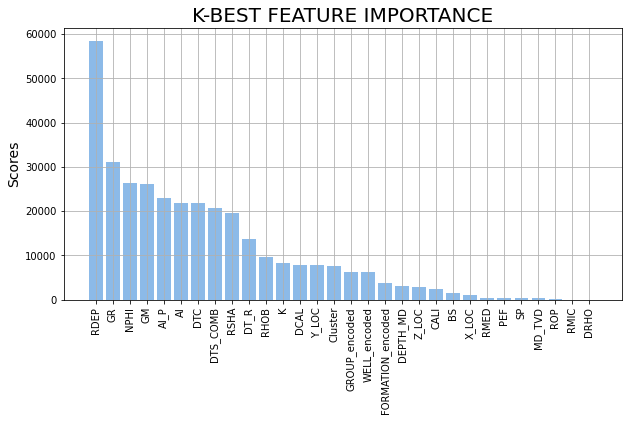

In [ ]:
#Ploting K-Best Feature Importances
#Visualizing Accuracies
f, ax = plt.subplots(figsize=(10,5))
x_pos = np.arange(len(x_train.columns))

#Create Bars
ax.bar(x_pos, df_new.scores, color=(0.5, 0.7, 0.9, 0.9))
ax.set_ylabel('Scores', size=14)
ax.set_title('K-BEST FEATURE IMPORTANCE', size=20)

plt.xticks(x_pos, df_new.feature, rotation=90)
plt.grid(True)
plt.show()

#### Recursive Feature Selection

In [ ]:
#Lest try recursive feature elimination
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#Training Sample
new_traindata = pd.concat((x_train, y_train), axis=1)

sampled_train = new_traindata.sample(1000000, random_state=0)

x_train_sample = sampled_train[features_names]
y_train_sample = sampled_train['LITHO']

In [ ]:
#Remove RDEP, Z_LOC

x_train_new = x_train_sample.drop(['RDEP'], axis=1)

model_FE = XGBClassifier(n_estimators=100, max_depth=10, booster='gbtree',
                            objective='multi:softprob', learning_rate=0.1, random_state=0,
                            subsample=0.9, colsample_bytree=0.9, tree_method='gpu_hist',
                            eval_metric='mlogloss', verbose=2020, reg_lambda=1500)

rfecv = RFECV(estimator=model_FE, step=1, cv=StratifiedKFold(10), scoring='accuracy', verbose=100)
rfecv.fit(x_train_new, y_train_sample)

Fitting estimator with 29 features.
Fitting estimator with 28 features.
Fitting estimator with 27 features.
Fitting estimator with 26 features.
Fitting estimator with 25 features.
Fitting estimator with 24 features.
Fitting estimator with 23 features.
Fitting estimator with 22 features.
Fitting estimator with 21 features.
Fitting estimator with 20 features.
Fitting estimator with 19 features.
Fitting estimator with 18 features.
Fitting estimator with 17 features.
Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.
Fitting estimator with 3 features.
Fitting estimator with 2 features.


RFECV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
      estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=0.9, eval_metric='mlogloss',
                              gamma=0, learning_rate=0.1, max_delta_step=0,
                              max_depth=10, min_child_weight=1, missing=None,
                              n_estimators=100, n_jobs=1, nthread=None,
                              objective='multi:softprob', random_state=0,
                              reg_alpha=0, reg_lambda=1500, scale_pos_weight=1,
                              seed=None, silent=None, subsample=0.9,
                              tree_method='gpu_hist', verbose=2020,
                              verbosity=1),
      min_features_to_select=1, n_jobs=None, scoring='accuracy', step=1,
      verbose=100)

In [ ]:
print('Optimal number of features: {}'.format(rfecv.n_features_))

Optimal number of features: 28


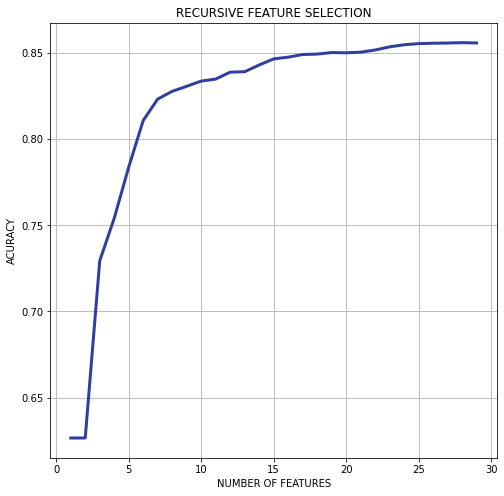

In [ ]:
#Plotting Data
plt.figure(figsize=(8, 8))
plt.plot(range(1, len(rfecv.grid_scores_)+1), rfecv.grid_scores_, color='#303F9F', linewidth=3)
plt.title('RECURSIVE FEATURE SELECTION')
plt.xlabel('NUMBER OF FEATURES')
plt.ylabel('ACURACY')
plt.grid()

In [ ]:
print(np.where(rfecv.support_ == False)[0])
x_train_new.drop(x_train_new.columns[np.where(rfecv.support_ == False)[0]], axis=1, inplace=True)

[24]


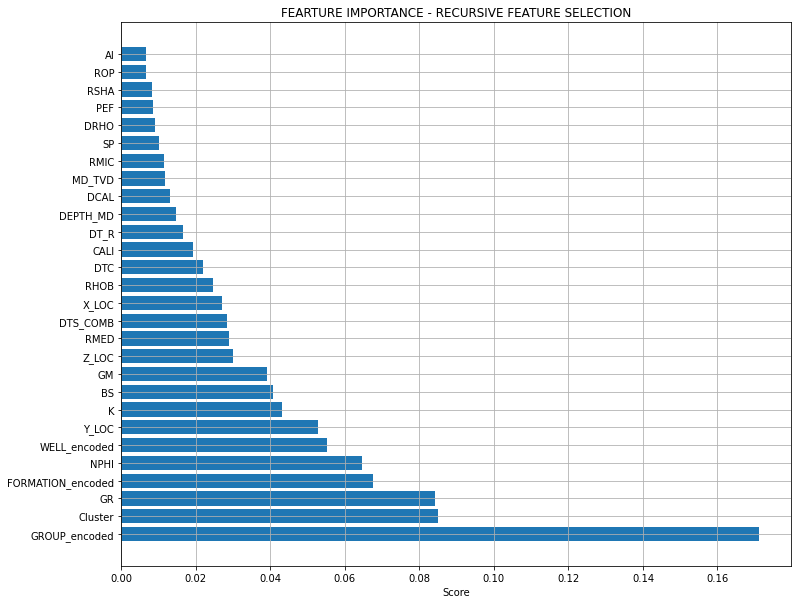

In [ ]:
#Ploting Feature Importance after recursive feature selection
dset = pd.DataFrame()
dset['attr'] = x_train_new.columns
dset['importance'] = rfecv.estimator_.feature_importances_
dset = dset.sort_values(by='importance', ascending=False)

plt.figure(figsize=(12, 10))
plt.barh(y=dset['attr'], width=dset['importance'])
plt.title('FEARTURE IMPORTANCE - RECURSIVE FEATURE SELECTION')
plt.xlabel('Score')
plt.grid()

#### Feature Selection RF

## **4. BALANCING DATASET AND HANDLING MISSING DATA**

### 0. Spliting data into sets 

In [ ]:
traindata = df_drop2[:train_len].copy()
testdata = df_drop2[train_len:(train_len+test_len)].copy()
hiddendata = df_drop2[(train_len+test_len):].copy()

#Cheching datasets shapes before argumentation
print('Training data shape is {}'.format(traindata.shape))
print('Testing data shape is {}'.format(testdata.shape))
print('Hidden data shape is {}'.format(hiddendata.shape))

Training data shape is (1170511, 24)
Testing data shape is (136786, 24)
Hidden data shape is (122397, 24)


In [ ]:
#Selecting train and test data 
x_train = traindata.drop(['LITHO'], axis=1)
y_train = traindata['LITHO']

x_test = testdata.drop(['LITHO'], axis=1)
y_test = testdata['LITHO']

x_hidden = hiddendata.drop(['LITHO'], axis=1)
y_hidden = hiddendata['LITHO']

#Cheching datasets shapes before argumentation
print('Training data shape is {} and {}'.format(x_train.shape, y_train.shape))
print('Testing data shape is {} and {}'.format(x_test.shape, y_test.shape))
print('Hidden data shape is {} and {}'.format(x_hidden.shape, y_hidden.shape))

Training data shape is (1170511, 23) and (1170511,)
Testing data shape is (136786, 23) and (136786,)
Hidden data shape is (122397, 23) and (122397,)


### **1. Inputation Techniques**

#### A. Zeros Imputation

In [ ]:
# 1.Imoputing missing values with zeros
#dataset.fillna(0, inplace=True)                                  #Imputing values in the other logs
#display(dataset.head())

#### B. Median, Media, Mode Imputation

In [ ]:
# 2. Inputing missing values by introducing median - TRAIN DATASET 
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy='median')
imp.fit(x_train.iloc[:,:])
x_train.iloc[:,:] = imp.fit_transform(x_train.iloc[:,:])
#display(x_train)

In [ ]:
# 2. Inputing missing values by introducing median - TRAIN DATASET 
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy='median')
imp.fit(x_test.iloc[:,:])
x_test.iloc[:,:] = imp.fit_transform(x_test.iloc[:,:])
#display(x_test)

In [ ]:
# 3. Inputing missing values by introducing median - TRAIN DATASET
x_hidden = x_hidden.apply(lambda x: x.fillna(x.median()), axis=0)

In [ ]:
# 3. Inputing missing values by introducing median - TRAIN DATASET 
#from sklearn.impute import SimpleImputer
#imp = SimpleImputer(missing_values=np.nan, strategy='median')
#imp.fit(x_hidden.iloc[:,:])
#x_hidden.iloc[:,:] = imp.fit_transform(x_hidden.iloc[:,:])
#display(x_hidden.head())

#### C. K-Nearest Neighbor Imputation

In [ ]:
# 3. K-Nearest Neighbor Imputation
#from sklearn.impute import KNNImputer
#imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
#imputer.fit(dataset.iloc[:, 2:])
#dataset.iloc[:, 2:] = imputer.transform(dataset[:, 2:])
#display(dataset.head())

### Imputed Data Overview

In [ ]:
counter = 0.0
for value in dataset['RSHA']:
    if value == 0.0:
        counter += 1.0
print(counter)

0.0


In [ ]:
#data.isna().any()
dataset.isna().sum().sort_values(ascending=False)

LITHO        0
RXO          0
DEPTH_MD     0
CALI         0
RSHA         0
RMED         0
RDEP         0
RHOB         0
GR           0
NPHI         0
PEF          0
DTC          0
SP           0
BS           0
ROP          0
DTS          0
DCAL         0
DRHO         0
MUDWEIGHT    0
RMIC         0
ROPA         0
WELL         0
dtype: int64

In [ ]:
#dataset = dataset[(dataset.RSHA > 0) & (dataset.RMED  <= 250) & (dataset.RDEP  <= 250)]
#dataset.shape

### Missing Data After Inputation

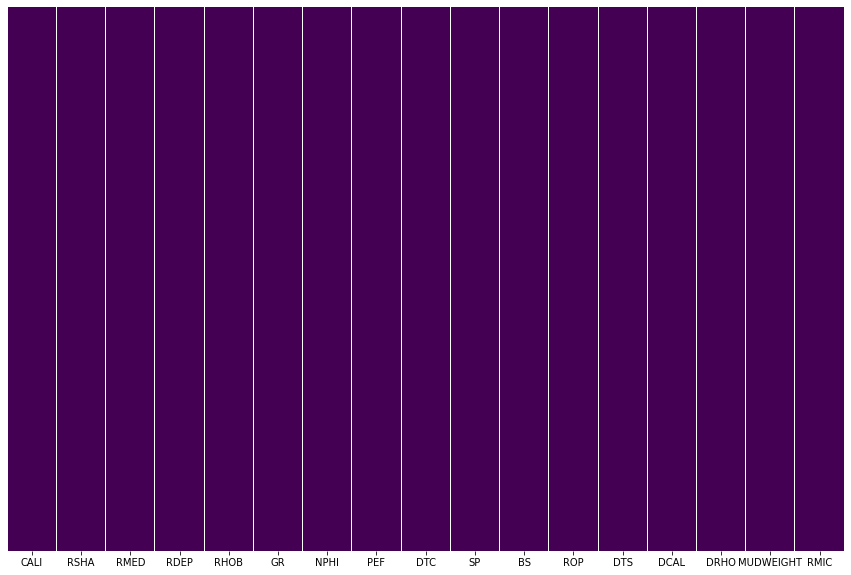

In [ ]:
#Missing data after inputation
plt.subplots(figsize=(15,10))
sns.heatmap(x_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')

### **2. Balancing Data Techniques**

### 2. Random Undersampling and Oversampling Combined

In [ ]:
import imblearn
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

In [ ]:
y_train.value_counts().sort_values(ascending=False)

2     720803
0     168937
1     150455
5      56320
3      33329
9      15245
6      10513
7       8213
10      3820
4       1688
8       1085
11       103
Name: LITHO, dtype: int64

In [ ]:
under_ratios = {0:75000, 1:75000, 2:350000, 5:30000}
over_ratios = {6:25000, 9:25000}

#Undersampling Majority classes
under = RandomUnderSampler(sampling_strategy=under_ratios)
X, Y = under.fit_resample(x_train, y_train.values.ravel())

#Oversampling Minority classes
over = RandomOverSampler(sampling_strategy=over_ratios)
X, Y = over.fit_resample(X, Y)

x_train_under = pd.DataFrame(X, columns=x_train.columns)
y_train_under = pd.DataFrame(Y, columns=['LITHO'])

#Checking the label counts -- IMBALANED DATASET
y_train_under['LITHO'].value_counts().sort_values(ascending=False)

2     350000
0      75000
1      75000
3      33329
5      30000
6      25000
9      25000
7       8213
10      3820
4       1688
8       1085
11       103
Name: LITHO, dtype: int64

### 3. SMOTEEN Method


In [ ]:
from imblearn.combine import SMOTEENN
SMOTEENN?

In [ ]:
from imblearn.combine import SMOTEENN

smoteenn_ratios = {8:2000, 11:2000, 4:2000, 10:5000, 9:20000, 6:15000, 7:15000}

smoteeenn = SMOTEEN(sampling_strategy=smoteenn_ratios, random_state=1)
X_sm, Y_sm = over.fit_resample(x_train, y_train.values.ravel())

x_train_smt = pd.DataFrame(X_sm, columns=x_train.columns)
y_train_smt = pd.DataFrame(Y_sm, columns=y_train.columns)

In [ ]:
#from imblearn.combine import SMOTEENN

#smoteeenn = SMOTEEN

In [ ]:
SMOTEENN?

## **3.1 DATA ARGUMENTATION**

Our guess is that facies do not abrutly change from a given depth layer to the next one. Therefore, we consider features at neighboring layers to be somehow correlated. To possibly exploit this fact, let us perform feature augmentation by:

- Aggregating features at neighboring depths.
- Computing feature spatial gradient.

In [ ]:
# Feature windows concatenation function
def augment_features_window(X, N_neig):
    
    # Parameters
    N_row = X.shape[0]
    N_feat = X.shape[1]

    # Zero padding
    X = np.vstack((np.zeros((N_neig, N_feat)), X, (np.zeros((N_neig, N_feat)))))

    # Loop over windows
    X_aug = np.zeros((N_row, N_feat*(2*N_neig+1)))
    for r in np.arange(N_row)+N_neig:
        this_row = []
        for c in np.arange(-N_neig,N_neig+1):
            this_row = np.hstack((this_row, X[r+c]))
        X_aug[r-N_neig] = this_row

    return X_aug

# Feature gradient computation function
def augment_features_gradient(X, depth):
    
    # Compute features gradient
    d_diff = np.diff(depth).reshape((-1, 1))
    d_diff[d_diff==0] = 0.001
    X_diff = np.diff(X, axis=0)
    X_grad = X_diff / d_diff
        
    # Compensate for last missing value
    X_grad = np.concatenate((X_grad, np.zeros((1, X_grad.shape[1]))))
    
    return X_grad

# Feature augmentation function
def augment_features(X, well, depth, N_neig=1):
    
    # Augment features
    X_aug = np.zeros((X.shape[0], X.shape[1]*(N_neig*2+2)))
    for w in np.unique(well):
        w_idx = np.where(well == w)[0]
        X_aug_win = augment_features_window(X[w_idx, :], N_neig)
        X_aug_grad = augment_features_gradient(X[w_idx, :], depth[w_idx])
        X_aug[w_idx, :] = np.concatenate((X_aug_win, X_aug_grad), axis=1)
    
    # Find padded rows
    padded_rows = np.unique(np.where(X_aug[:, 0:7] == np.zeros((1, 7)))[0])
    
    return X_aug, padded_rows

In [ ]:
# Applying feature argumentation

x_train_arg, padded_rows = augment_features(x_train.values, train_well, train_depth)
x_test_arg, padded_rows = augment_features(x_test.values, test_well, test_depth)
x_hidden_arg, padded_rows = augment_features(x_hidden.values, hidden_well, hidden_depth)

In [ ]:
#  3. Checking data shape befire and after argumentation ---> 1 NEIGHBORS

print('The shape of the TRAINING DATA before argumentation is {} and its shape after argumentation is {}'.format(x_train.shape, x_train_arg.shape))
print('The shape of the TEST DATA before argumentation is {} and its shape after argumentation is {}'.format(x_test.shape, x_test_arg.shape))
print('The shape of the HIDDEN DATA before argumentation is {} and its shape after argumentation is {}'.format(x_hidden.shape, x_hidden_arg.shape))

The shape of the TRAINING DATA before argumentation is (1170511, 22) and its shape after argumentation is (1170511, 88)
The shape of the TEST DATA before argumentation is (136786, 22) and its shape after argumentation is (136786, 88)
The shape of the HIDDEN DATA before argumentation is (122397, 22) and its shape after argumentation is (122397, 88)


## **4. DATA ANALYSIS AND STATISTICS OVERVIEW**

### Sampling Raw Data for Visualization

In [ ]:
#Sampling data for statistical visualization
visual_sample = labeled_data.sample(n=150000, replace=False)      #Sampling raw_data for visualization

### Pairplotting Sampled Raw-Data 

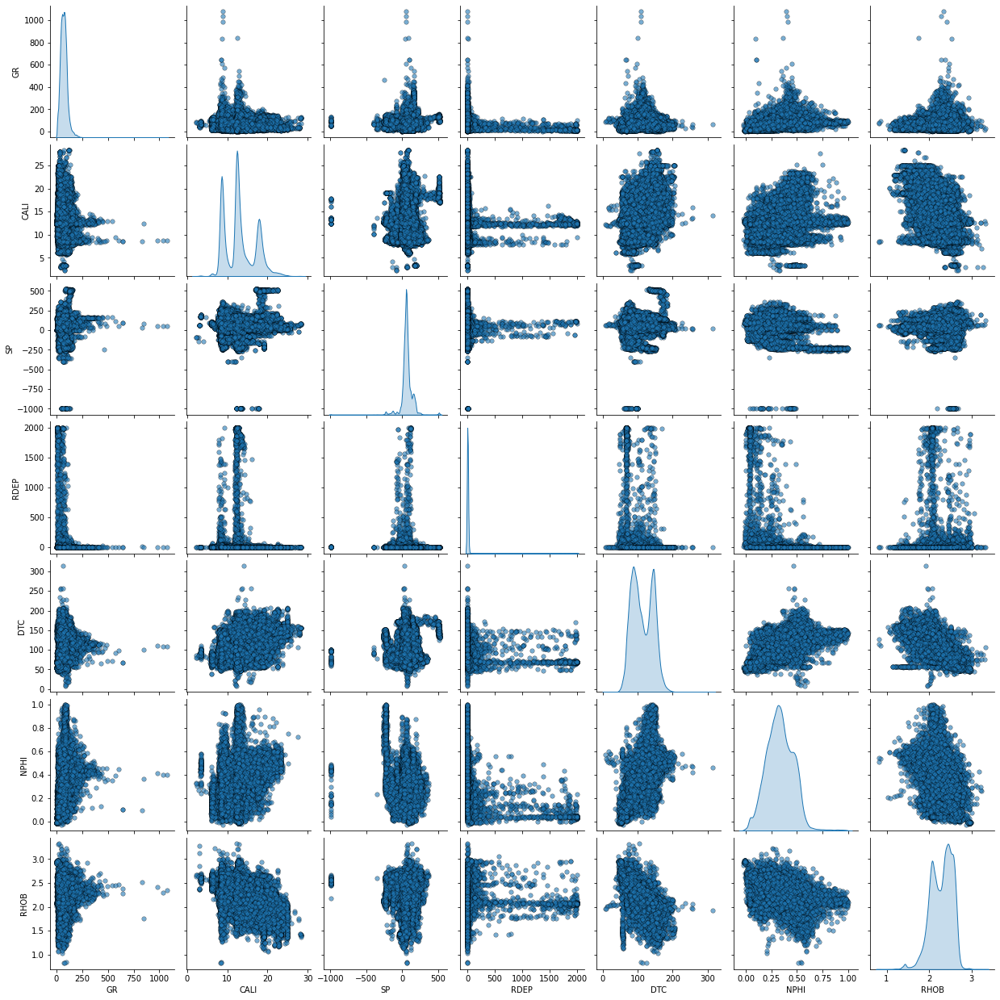

In [ ]:
#Creating a pair plot to analize data distibutions - ALL FEATURES

features_pair_plot = ['GR', 'CALI', 'SP', 'RDEP', 'DTC', 'NPHI', 'RHOB']
sns.pairplot(visual_sample, vars=features_pair_plot, diag_kind='kde', plot_kws = {'alpha': 0.6, 's': 30, 'edgecolor': 'k'})

### Spearman's Correlation Raw-Data

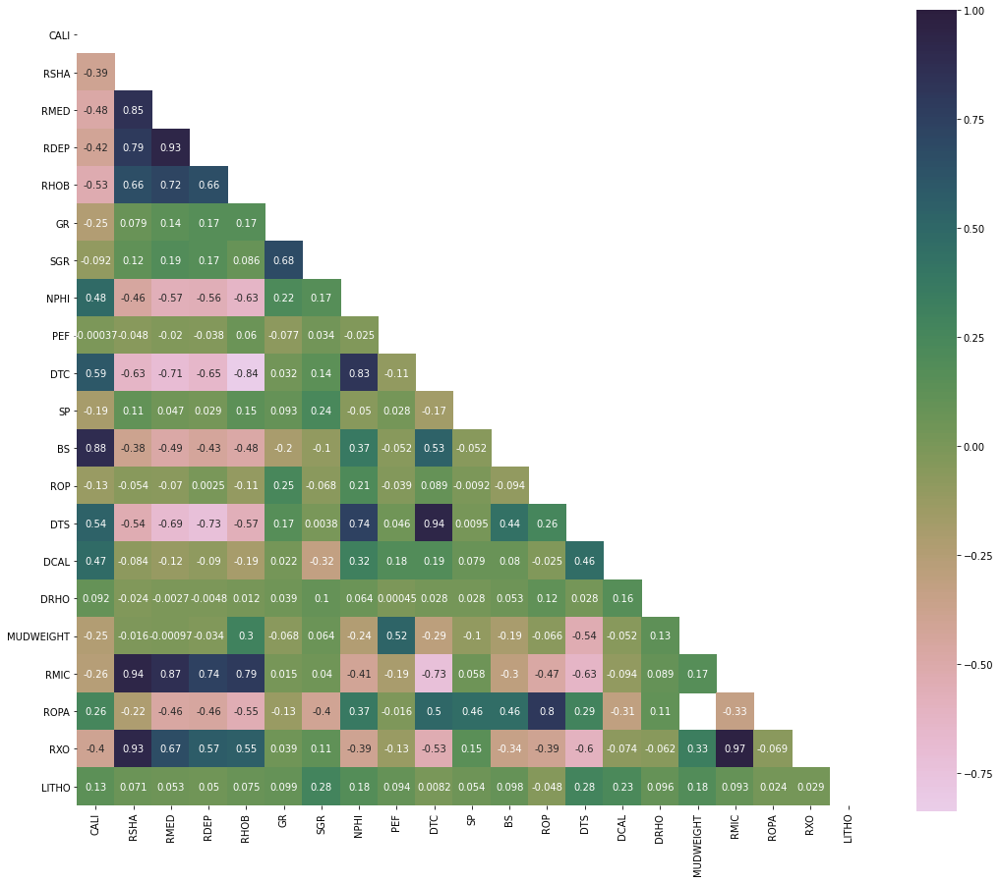

In [ ]:
#Data Spearman's Correlation
data_corr = data_sample.drop(['WELL', 'DEPTH_MD'], axis=1)

# Generate a mask for the upper triangle
mask = np.zeros_like(data_corr.corr(method = 'spearman') , dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Generate a custom diverging colormap
cmap = sns.cubehelix_palette(n_colors=12, start=-2.25, rot=-1.3, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
plt.figure(figsize=(18,15))
sns.heatmap(data_corr.corr(method = 'spearman') ,annot=True,  mask=mask, cmap=cmap, vmax=1, square=True)

plt.show()

### Other Statistical Visualization Plots (Still in Process)

In [ ]:
#Having a brief understanding on the data distributions
#visual_sample.groupby('LITHO').agg(['mean', 'median'])
#data_sample.groupby('LITHO').agg([np.mean, np.median])

In [ ]:
# Selecting one well for training and study
#well = data[data['WELL'] == wells[0]]
#dataset = well.drop(columns=['WELL', 'FORMATION'])

# As a simple approach we replace nan with zero and hope for the best
#dataset.fillna(0, inplace=True)
#display(dataset)

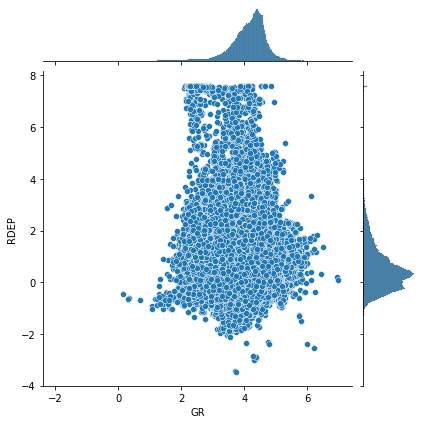

In [ ]:
#Hexbin plot to recreate data density

sns.jointplot(x=np.log(visual_sample['GR']), y=np.log(visual_sample['RDEP']), kind='scatter')

In [ ]:
#Breaking apart data by Face Grid Plot
#Here the idea is to identify if the data that possibly represents outliers is truly outliers

#plot = sns.FacetGrid(data_sample, col='LITHO', margin_titles=True)
#plot.map(plt.hist, 'RHOB', color='green')

#plot = sns.FacetGrid(data_sample, col='LITHO', margin_titles=True)
#plot.map(plt.hist, 'CALI', color='blue')

In [ ]:
#Plotting a violing diagram to visualize sampled data
#fig = plt.figure(figsize=(15,8))
#ax = fig.gca()
#sns.set_style('whitegrid')
#sns.violinplot(x='LITHO', y='GR', data=data_sample, ax=ax)
#ax.set_title('Lithology vs. Gamma Ray')
#ax.set_xlabel('Lithoogy')
#ax.set_ylabel('Gamma Ray')

## **5. OUTLIER REMOVAL AND NORMALIZATION**

### Outlier Removal

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.covariance import EllipticEnvelope
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

#Creating a copy of the normalized data
train_data_drop = pd.concat((x_train, pd.DataFrame(y_train, columns=["LITHO"])), axis=1)

#MethoD: Local Oultlier Factor
lof = LocalOutlierFactor(contamination=0.3)
yhat = lof.fit_predict(train_data_drop)
mask = yhat != -1
train_data_lof = train_data_drop[mask]
#display(train_data_lof)

In [ ]:
#Spliting into features and labels
x_train = train_data_lof.drop(['LITHO'], axis=1)
y_train = train_data_lof['LITHO']

### Normalization Methods

In [ ]:
### Normalization Methods

from sklearn.linear_model import LogisticRegression
import warnings 
warnings.filterwarnings('ignore', category=FutureWarning)
from sklearn.preprocessing import StandardScaler, Normalizer, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer

##Min-Max scaler 
scaler = MinMaxScaler()
x_train_scaled = x_train.copy()
x_test_scaled = x_test.copy()
x_hidden_scaled = x_hidden.copy()

x_train_scaled.iloc[:,:19] = scaler.fit_transform(x_train_scaled.iloc[:,:19])
x_test_scaled.iloc[:,:19] = scaler.transform(x_test_scaled.iloc[:,:19])
x_hidden_scaled.iloc[:,:19] = scaler.transform(x_hidden_scaled.iloc[:,:19])

##Standardization (Z-score Normalization -> better handling oitliers)
std = StandardScaler()
x_train_std = x_train.copy()
x_test_std = x_test.copy()
x_hidden_std = x_hidden.copy()

x_train_std.iloc[:,:19] = std.fit_transform(x_train_std.iloc[:,:19])
x_test_std.iloc[:,:19] = std.transform(x_test_std.iloc[:,:19])
x_hidden_std.iloc[:,:19] = std.transform(x_hidden_std.iloc[:,:19])

##Normalization
normalizer = Normalizer()
x_train_norm = x_train.copy()
x_test_norm = x_test.copy()
x_hidden_norm = x_hidden.copy()

x_train_norm.iloc[:,:19] = normalizer.fit_transform(x_train_norm.iloc[:,:19])
x_test_norm.iloc[:,:19] = normalizer.transform(x_test_norm.iloc[:,:19])
x_hidden_norm.iloc[:,:19] = normalizer.transform(x_hidden_norm.iloc[:,:19])

### Boxplotting Normalized Data

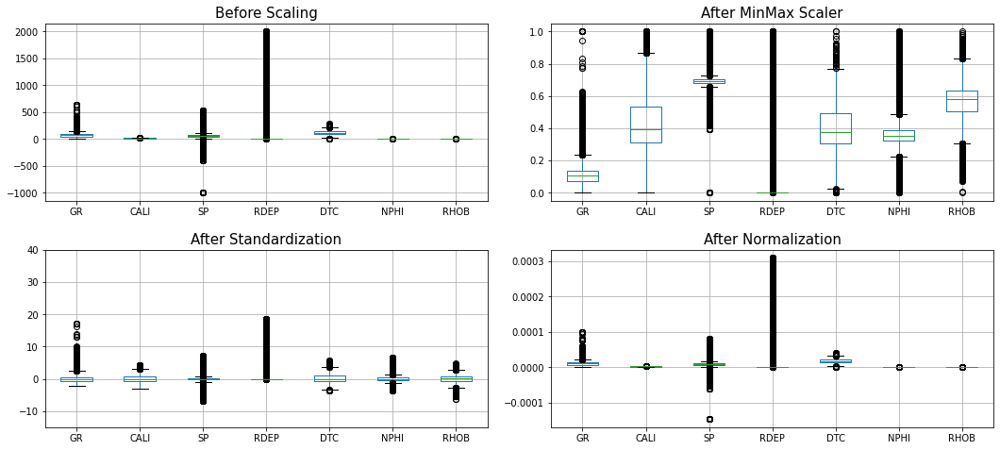

In [ ]:
#Box plotting data after Scaling ---- NO LOG

#box_features = ['RDEP','RMED', 'RSHA','GR', 'DTC', 'NPHI', 'RHOB', 'BS', 'CALI']
box_features = ['GR', 'CALI', 'SP', 'RDEP', 'DTC', 'NPHI', 'RHOB']
plt.figure(figsize=(15,10))

# 0. Before Normalization
plt.subplot(3,2,1)
x_train[box_features].boxplot()
plt.title('Before Scaling', size=15)

# 1. After MinMax Scaler
plt.subplot(3,2,2)
x_train_scaled[box_features].boxplot()
plt.title('After MinMax Scaler', size=15)

# 2. After Standardization
plt.subplot(3,2,3)
x_train_std[box_features].boxplot()
plt.ylim([-15, 40])
plt.title('After Standardization', size=15)

# 3. After Normalization
plt.subplot(3,2,4)
x_train_norm[box_features].boxplot()
plt.title('After Normalization', size=15)

plt.tight_layout(1.7)
plt.show()

### Comparing Normalization Methods Peformance

In [ ]:
#Fitting a logistic regression model  #### KEEP THIS ONE

model_lr = LogisticRegression(C=1e-3, solver="saga", max_iter=4000, verbose=1)
#model_lr = LogisticRegression()

#Score with no Scale/Normalization
model_lr.fit(x_train, y_train.values.ravel())
print('The acuracy score withouth Normalization/scaling', model_lr.score(x_test, y_test))

# 1. Score after Scaling
model_lr.fit(x_train_scaled, y_train.values.ravel())
print('1. The accuracy score after Scaling', model_lr.score(x_test_scaled, y_test))

# 2. Score after Standardization
model_lr.fit(x_train_std, y_train.values.ravel())
print('2. The acuracy score after Standardization', model_lr.score(x_test_std, y_test))

# 3. Score after Normalization
model_lr.fit(x_train_norm, y_train.values.ravel())
print('3. The accuracy score after Normalization', model_lr.score(x_test_norm, y_test))

# 4. Normalization - Yeo-Johnson method
#model_lr.fit(x_train_yj, y_train.values.ravel())
#print('4. The accuracy score after Yeo-Johnson Standardization', model_lr.score(x_test_yj, y_test))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


max_iter reached after 11332 seconds
The acuracy score withouth Normalization/scaling 0.6139151667568319


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 188.9min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 625 epochs took 1811 seconds
1. The accuracy score after Scaling 0.6400801251590075


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 30.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 1239 epochs took 3589 seconds
2. The acuracy score after Standardization 0.7024549295980583


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 59.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 1254 epochs took 3582 seconds
3. The accuracy score after Normalization 0.6139151667568319


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 59.7min finished


### Pairplotting Best Normalization Method

As shown before the YEO-JOHNSON NORMALIZATION METHOD does better than the others. Hence, we will use this method for feature selection.

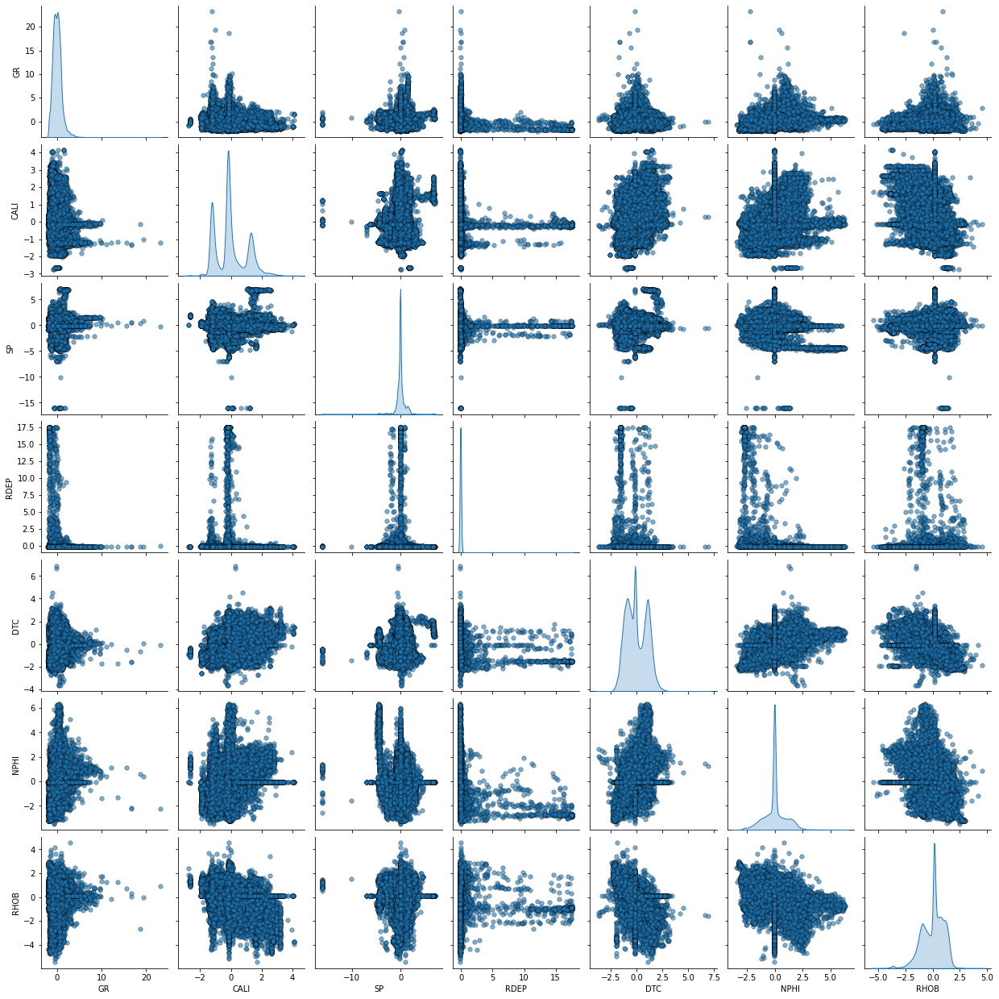

In [ ]:
## Pair plot after YEO-JOHNSON NORMALIZATION

data_sample = x_train_std.sample(n=100000, replace=False)
features_pair_plot = ['GR', 'CALI', 'SP', 'RDEP', 'DTC', 'NPHI', 'RHOB']
sns.pairplot(data_sample, vars=features_pair_plot, diag_kind='kde', plot_kws = {'alpha': 0.6, 's': 30, 'edgecolor': 'k'})

## **7. BASE MODEL TEST**

### FUNCTION - Accuracy and Metric Report

In [ ]:
### Metrics report Function
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, mean_squared_error
from sklearn import metrics

#Function for cheching the accuracy of the model for selecting best features
def metrics_report(model, x_test, y_test):
    y_pred = model.predict(x_test)
    report = metrics.classification_report(y_test, y_pred)
    print('Model metrics: ', report)

def metrics_report2(y_true, y_pred):
  ac = accuracy_score(y_true, y_pred)
  f_score = f1_score(y_true, y_pred, average='weighted')           ## Metric for imbalanced dataset
  recall = recall_score(y_true, y_pred, average='weighted')        ## Sensitivity 
  precision = precision_score(y_true, y_pred, average='weighted')  ## True predicted value
  m_score = score(y_true, y_pred)

  df = pd.DataFrame(np.around([ac*100, f_score*100, recall*100, precision*100, m_score], 2), ['Accuracy', 'F1 score', 'Recall', 'Precision', 'Matrix Score'], columns=['METRIC'])
  return df

In [ ]:
#Confusion Matrix Function
def my_confusion_matrix(y_true, y_pred):
    labels = np.sort(y_true.unique())
    from sklearn.metrics import confusion_matrix
    from sklearn.metrics._plot.confusion_matrix import ConfusionMatrixDisplay

    fig, ax = plt.subplots(figsize=(15,10))
    
    cm = confusion_matrix(y_true, y_pred, sample_weight=None, labels=labels, normalize=None)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=labels)
    return disp.plot(include_values=True, ax=ax, 
                     xticks_rotation='horizontal', values_format=None)                        #cmap='CMRmap_r'

def default_confusion_matrix(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(15,10))
    #sns.heatmap(cm, annot=True, linewidths = 0.01)
    sns.heatmap(cm, annot=True)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')

In [ ]:
# Evaluate prediction
matrix_path = '/content/drive/MyDrive/Thesis_data/penalty_matrix.npy'

A = np.load(matrix_path)

def score(y_true, y_pred):
    S = 0.0
    y_true = y_true.astype(int)
    y_pred = y_pred.astype(int)
    for i in range(0, y_true.shape[0]):
        S -= A[y_true[i], y_pred[i]]
    return S/y_true.shape[0]

In [ ]:
### Confusion Matrix Function
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix

#Function for cheching the accuracy of the model for selecting best features
def accuracy_confusion_matrix(model, x_test, y_test):
    y_pred = model.predict(x_test)
    ac = accuracy_score(y_test, y_pred)
    f_score = f1_score(y_test, y_pred, average='weighted')           ## Metric for imbalanced dataset
    recall = recall_score(y_test, y_pred, average='weighted')        ## Sensitivity 
    precision = precision_score(y_test, y_pred, average='weighted')  ## True predicted value
    msqe_comp =  np.sqrt(mean_squared_error(y_test, y_pred))

    print('The accuracy of the base model is: ', ac)
    print('The weighted f1 score is:', f_score)
    print('The weighted recall score is:', recall)
    print('The weighted precision score is:', precision)
    print('The RMSE is:', msqe_comp)
    
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(15,10))
    sns.heatmap(cm, annot=True, cmap=plt.cm.Blues)
    plt.xlabel('Predicted Label'), plt.ylabel('True Label')
    
    return y_pred

### 0. Testing Balanced Data

In [ ]:
#from sklearn.utils.class_weight import compute_class_weight
#class_weights = compute_class_weight('balanced', np.unique(y_train_under.squeeze()), y_train_under.squeeze())
#class_weights

In [ ]:
#Sampled Model 

import xgboost
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold

model_xgb = XGBClassifier(n_estimators=100, max_depth=10, booster='gbtree',
                            objective='multi:softprob', learning_rate=0.1, random_state=0,
                            subsample=0.9, colsample_bytree=0.9, tree_method='gpu_hist',
                            eval_metric='mlogloss', verbose=2020, reg_lambda=1500) 
                            #scale_pos_weight=class_weights)

model_xgb.fit(x_train, y_train.values.ravel(), early_stopping_rounds=100, eval_set=[(x_test, y_test)], verbose=100)

open_pred_xgb = model_xgb.predict(x_test)
hidden_pred_xgb = model_xgb.predict(x_hidden)

[0]	validation_0-mlogloss:2.22584
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.6847


In [ ]:
#Printing Reports 

print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_xgb)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_xgb))
print('Open set report:', metrics.classification_report(y_test, open_pred_xgb))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_xgb)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_xgb))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_xgb))

-----------------------OPEN SET REPORT---------------------
Open set RMSE: 1.0624051449426641
Open set penalty matrix score: -0.5185919977190648
Open set report:               precision    recall  f1-score   support

           0       0.79      0.84      0.81     24048
           1       0.65      0.28      0.39     17558
           2       0.84      0.95      0.89     83975
           3       0.73      0.14      0.23      3306
           4       0.00      0.00      0.00       416
           5       0.48      0.56      0.52      4798
           6       0.00      0.00      0.00       625
           8       0.97      0.28      0.43       125
           9       0.75      0.62      0.68      1245
          10       0.83      0.45      0.58       690

    accuracy                           0.80    136786
   macro avg       0.60      0.41      0.45    136786
weighted avg       0.78      0.80      0.77    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Hidden set penalty matrix score: -0.4885567048211966
Hidden set report:               precision    recall  f1-score   support

           0       0.72      0.83      0.77     14045
           1       0.75      0.32      0.45     12283
           2       0.86      0.96      0.91     71827
           3       0.27      0.22      0.25      4396
           4       0.00      0.00      0.00       287
           5       0.57      0.66      0.61      8374
           6       0.78      0.03      0.06      2905
           7       0.99      0.99      0.99      6498
           8       0.74      0.18      0.28       597
           9       0.73      0.35      0.47       941
          10       0.83      0.55      0.66       244

    accuracy                           0.80    122397
   macro avg       0.66      0.46      0.50    122397
weighted avg       0.79      0.80      0.78    122397



The accuracy of the base model is:  0.8008284516777372
The weighted f1 score is: 0.7760797542725734
The weighted recall score is: 0.8008284516777372
The weighted precision score is: 0.7919105615461455
The RMSE is: 1.0801253407517626


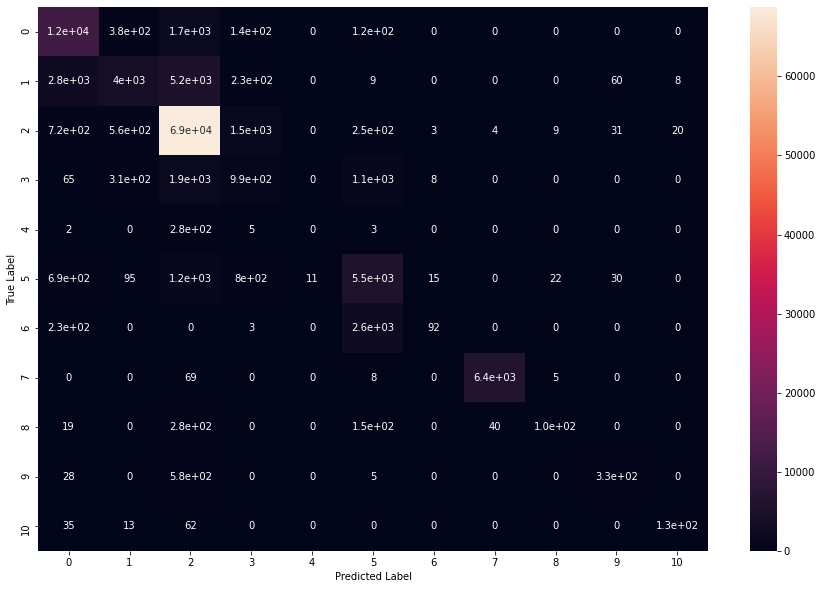

In [ ]:
#Base model with Balanced Dataset

#lithology_keys = {0: 'Sandstone', 1: 'Sandstone/Shale', 
#2: 'Shale', 3: 'Marl', 4: 'Dolomite', 5: 'Limestone', 
#6: 'Chalk', 7: 'Halite', 8: 'Anhydrite', 9: 'Tuff', 
#10: 'Coal', 11: 'Basement'}

y_pred = accuracy_confusion_matrix(model_xgb, x_hidden, y_hidden)

### 1. Testing Randomly Sampled Data

In [ ]:
#Base model with Balanced Dataset

base = LogisticRegression(C=1e-3, max_iter=3000)
base.fit(x_train_yj, y_train.values.ravel())
y_pred = accuracy_confusion_matrix(base, x_test_yj, y_test)

NameError: ignored

### 2. Testing Under-Oversampled Data

The accuracy of the base model is:  0.6106580019022992
The weighted f1 score is: 0.6386973637629406
The weighted recall score is: 0.6106580019022992
The weighted precision score is: 0.7072741320244463


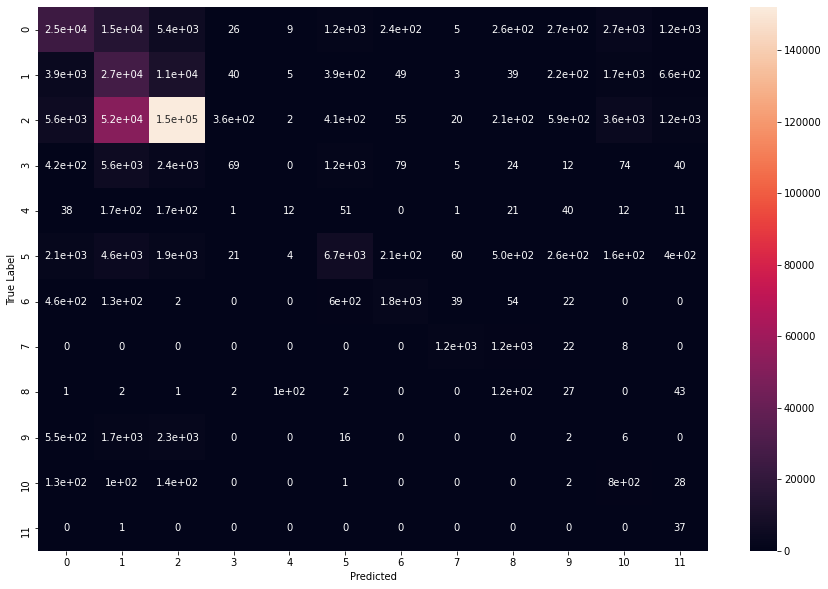

In [ ]:
#Base model with Balanced Dataset

base = LogisticRegression(C=100, max_iter=3000)
base.fit(x_train_yj, y_train.values.ravel())
y_pred = accuracy_confusion_matrix(base, x_test_yj, y_test)

In [ ]:
#Base model with Imbalanced dataset with no processing applied  ---> YESTERDAY
clf_base = LogisticRegression(max_iter=3500)

param_grid = {'C':10.0 ** np.arange(-3, 3)}

grid = RandomizedSearchCV(estimator=clf_base, param_distributions=param_grid, cv=4, n_jobs=8, scoring='f1_weighted', n_iter=5)
grid_result = grid.fit(x_train, y_train.values.ravel())
print(grid_result)
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

NameError: ignored

## **8. FEATURE SELECTION**

### FUNCTION FOR COMPARING ACCURACY DURING FEATURE SELECTION

In [ ]:
#CONFUSION MATRIX EXAMPLE BY USING YEO-JOHNSON STANDARDIZATION METHOD

#Checking predicted data
model_yj = LogisticRegression(C=1e-3, solver='sag', max_iter=2000)
model_yj.fit(x_train_yj, y_train.values.ravel())
y_pred = accuracy_confusion_matrix(model_yj, x_test_yj, y_test)

#Confusion Matrix -----> As we can see, our model does not do so well.

NameError: ignored

### a) UNIVARIATE FEATURE SELECTION (BY VARIANCE)

In [ ]:
#Feature discrimination based on variance prior normalization
x_train.var().sort_values(ascending=False)

Y_LOC                1.646871e+10
X_LOC                1.173207e+09
ROP                  1.106854e+06
DEPTH_MD             9.872102e+05
Z_LOC                9.271608e+05
RDEP                 1.150090e+04
RSHA                 4.519181e+03
SP                   4.308880e+03
RMED                 2.152720e+03
GR                   1.114013e+03
WELL_encoded         1.032111e+03
DTC                  8.275244e+02
FORMATION_encoded    5.811277e+02
RMIC                 4.567507e+02
PEF                  4.668605e+01
CALI                 1.332275e+01
GROUP_encoded        9.430077e+00
BS                   6.424057e+00
DCAL                 7.344675e-01
RHOB                 5.450053e-02
DRHO                 3.373009e-02
NPHI                 1.058976e-02
dtype: float64

### b) UNIVARIATE FEATURE SELECTION (LOGISTIC REGRESSION SCORES METHOD)

In [ ]:
import sklearn.feature_selection

select = sklearn.feature_selection.SelectKBest(k=15)
selected_features = select.fit(x_train, y_train)

df = pd.DataFrame({'Feature':list(x_train.columns), 'Scores':selected_features.scores_})
df = df.sort_values(by='Scores', ascending=False)
display(df.head(20))

,Feature,Scores
7,RDEP,31572.434035
9,GR,24859.534426
10,NPHI,18759.150057
12,DTC,16370.596468
5,RSHA,14815.454967
8,RHOB,6820.910165
2,Y_LOC,6766.721215
21,WELL_encoded,5386.707034
19,GROUP_encoded,4909.808029
20,FORMATION_encoded,2827.199121


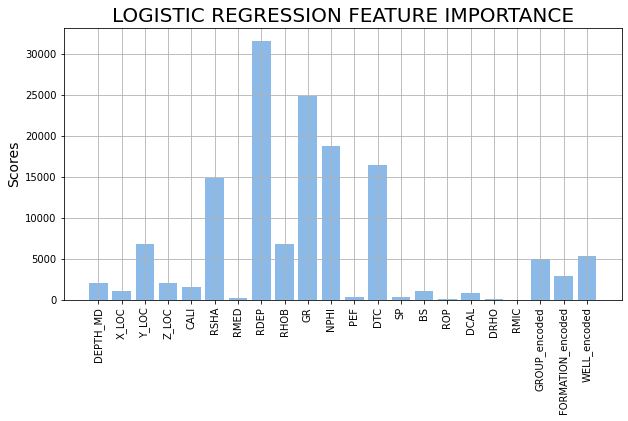

In [ ]:
#Visualizing Accuracies
f, ax = plt.subplots(figsize=(10,5))
x_pos = np.arange(len(x_train.columns))

#Create Bars
ax.bar(x_pos, np.array(selected_features.scores_), color=(0.5, 0.7, 0.9, 0.9))
ax.set_ylabel('Scores', size=14)
ax.set_title('LOGISTIC REGRESSION FEATURE IMPORTANCE', size=20)

plt.xticks(x_pos, x_train.columns, rotation=90)
plt.grid(True)
plt.show()

### c) UNIVARIATE FEATURE SELECTION (SPEARMAN CORRELATION)

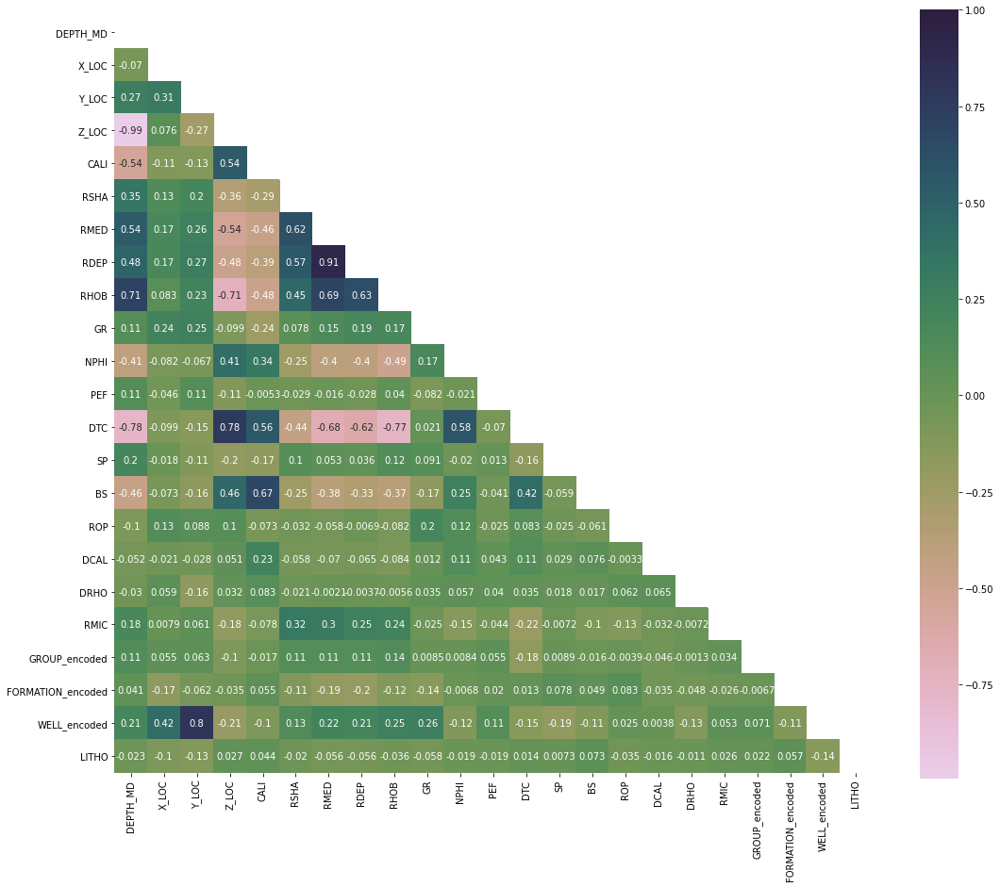

In [ ]:
#Data Spearman's Correlation after Yeo-Johnson Normalization

#x_train = x_train.astype(float)
train_sc = pd.concat([x_train_std, y_train.reset_index()], axis=1)     #Comcatenating training data prior to Outlier Removal
train_sc = train_sc.drop(['index'], axis=1)

# Generate a mask for the upper triangle
mask = np.zeros_like(train_sc.corr(method = 'spearman') , dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Generate a custom diverging colormap
cmap = sns.cubehelix_palette(n_colors=12, start=-2.25, rot=-1.3, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
plt.figure(figsize=(18,15))
sns.heatmap(train_sc.corr(method = 'spearman') ,annot=True,  mask=mask, cmap=cmap, vmax=1, square=True)

plt.show()

In [ ]:
#Inserting a threshold to select features - Spearman Correlation
def correlation(data, threshold):
    col_corr = set()  #Set all the names of the correlates columns
    corr_matrix = data.corr(method='spearman')
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                colname = corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [ ]:
corr_features = correlation(train_sc, 0.8)
corr_features

{'RDEP', 'WELL_encoded', 'Z_LOC'}

### FEATURE SELECTION BASED ON RANDOM FOREST

In [ ]:
# PREDICTION ON THE VALIDATION SET

model_rf = RandomForestClassifier(n_estimators=250)

# Fit the regressor to the training data
model_rf.fit(x_train_std, y_train.values.ravel())

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=250,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
model_rf.feature_importances_, x_train.columns

(array([0.06508093, 0.05959113, 0.07044727, 0.06562072, 0.05054471,
        0.02121049, 0.0431502 , 0.04159102, 0.04169334, 0.15592645,
        0.06378806, 0.02251312, 0.06924296, 0.03408277, 0.00833935,
        0.01623274, 0.01334666, 0.02331229, 0.00733506, 0.04372987,
        0.03687661, 0.04634424]),
 Index(['DEPTH_MD', 'X_LOC', 'Y_LOC', 'Z_LOC', 'CALI', 'RSHA', 'RMED', 'RDEP',
        'RHOB', 'GR', 'NPHI', 'PEF', 'DTC', 'SP', 'BS', 'ROP', 'DCAL', 'DRHO',
        'RMIC', 'GROUP_encoded', 'FORMATION_encoded', 'WELL_encoded'],
       dtype='object'))

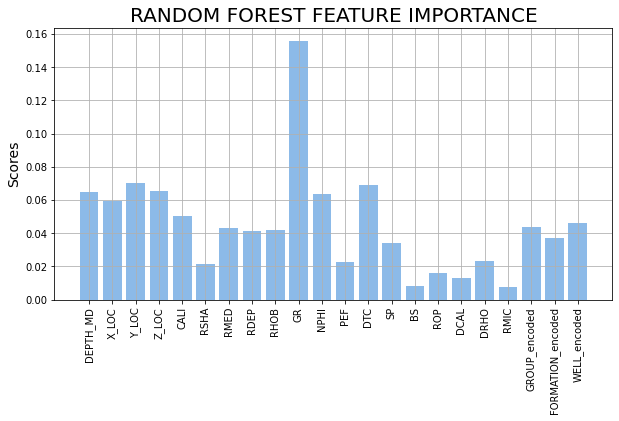

In [ ]:
#Visualizing Accuracies
f, ax = plt.subplots(figsize=(10,5))
x_pos = np.arange(len(x_train.columns))

#Create Bars
ax.bar(x_pos, np.array(model_rf.feature_importances_), color=(0.5, 0.7, 0.9, 0.9))
ax.set_ylabel('Scores', size=14)
ax.set_title('RANDOM FOREST FEATURE IMPORTANCE', size=20)

plt.xticks(x_pos, x_train.columns, rotation=90)
plt.grid(True)
plt.show()

### FEATURE SELECTION BASED ON XGB

In [ ]:
# Create the classifier - DONE WITH

model_xgb = XGBClassifier(n_estimators=100, max_depth=10, booster='gbtree',
                            objective='multi:softprob', learning_rate=0.1, random_state=0,
                            subsample=0.9, colsample_bytree=0.9, tree_method='gpu_hist',
                            eval_metric='mlogloss', verbose=2020, reg_lambda=1500)

model_xgb.fit(x_train_std, y_train.values.ravel(), early_stopping_rounds=100, eval_set=[(x_test_std, y_test)], verbose=100)

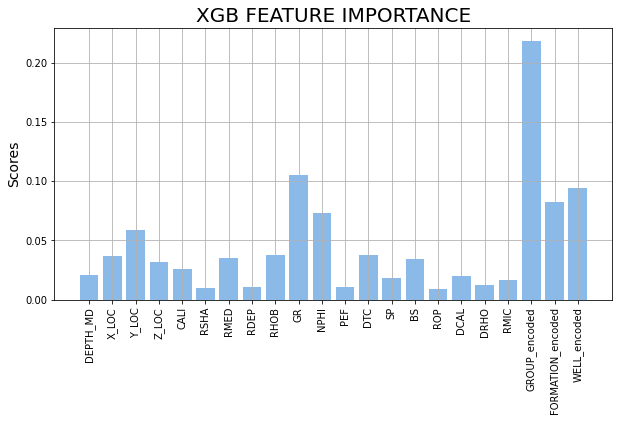

In [ ]:
#Visualizing Accuracies
f, ax = plt.subplots(figsize=(10,5))
x_pos = np.arange(len(x_train.columns))

#Create Bars
ax.bar(x_pos, np.array(model_xgb.feature_importances_), color=(0.5, 0.7, 0.9, 0.9))
ax.set_ylabel('Scores', size=14)
ax.set_title('XGB FEATURE IMPORTANCE', size=20)

plt.xticks(x_pos, x_train.columns, rotation=90)
plt.grid(True)
plt.show()

In [ ]:
t = pd.DataFrame({'FEATURES':x_train.columns, 'IMPORTANCE':imp}).sort_values('IMPORTANCE', ascending=False)
t

,FEATURES,IMPORTANCE
19,GROUP_encoded,0.218325
9,GR,0.104965
21,WELL_encoded,0.094213
20,FORMATION_encoded,0.082599
10,NPHI,0.073401
2,Y_LOC,0.058699
12,DTC,0.037914
8,RHOB,0.037542
1,X_LOC,0.036651
6,RMED,0.035562


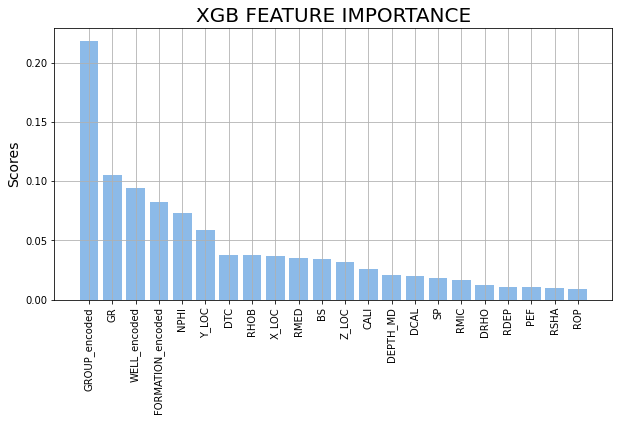

In [ ]:
#Visualizing Accuracies
f, ax = plt.subplots(figsize=(10,5))
x_pos = np.arange(len(x_train.columns))

#Create Bars
ax.bar(x_pos, np.array(t.IMPORTANCE), color=(0.5, 0.7, 0.9, 0.9))
ax.set_ylabel('Scores', size=14)
ax.set_title('XGB FEATURE IMPORTANCE', size=20)

plt.xticks(x_pos, t.FEATURES, rotation=90)
plt.grid(True)
plt.show()

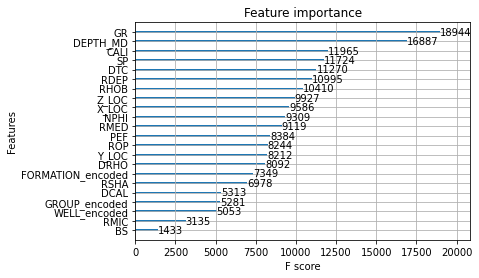

In [ ]:
from xgboost  import plot_importance

plot_importance(model_xgb)

In [ ]:
from sklearn.feature_selection import SelectFromModel

tresholds = np.sort(model_xgb.feature_importances_)

for tresh in tresholds:
  selection = SelectFromModel(model_xgb, threshold=tresh, prefit=True)
  select_X_train = selection.transform(x_train_std)

  selection_model = XGBClassifier(n_estimators=100, max_depth=10, booster='gbtree',
                            objective='multi:softprob', learning_rate=0.1, random_state=0,
                            subsample=0.9, colsample_bytree=0.9, tree_method='gpu_hist',
                            eval_metric='mlogloss', verbose=2020, reg_lambda=1500)
  
  selection_model.fit(select_X_train, y_train)

  select_X_model = selection.transform(x_test_std)
  predictions = selection_model.predict(select_X_model)
  accuracy = accuracy_score(y_test, predictions)
  print("Thresh=%.3f, n=%d, Accuracy: %.2f%%" % (tresh, select_X_train.shape[1], accuracy*100.0))

Thresh=0.009, n=22, Accuracy: 80.08%
Thresh=0.010, n=21, Accuracy: 79.91%
Thresh=0.011, n=20, Accuracy: 79.76%
Thresh=0.011, n=19, Accuracy: 79.57%
Thresh=0.012, n=18, Accuracy: 79.52%
Thresh=0.017, n=17, Accuracy: 79.47%
Thresh=0.018, n=16, Accuracy: 79.36%
Thresh=0.020, n=15, Accuracy: 79.02%
Thresh=0.021, n=14, Accuracy: 79.13%
Thresh=0.026, n=13, Accuracy: 78.95%
Thresh=0.031, n=12, Accuracy: 78.71%
Thresh=0.034, n=11, Accuracy: 78.36%
Thresh=0.036, n=10, Accuracy: 77.77%
Thresh=0.037, n=9, Accuracy: 77.32%
Thresh=0.038, n=8, Accuracy: 75.40%
Thresh=0.038, n=7, Accuracy: 73.67%
Thresh=0.059, n=6, Accuracy: 74.35%
Thresh=0.073, n=5, Accuracy: 74.73%
Thresh=0.083, n=4, Accuracy: 77.08%
Thresh=0.094, n=3, Accuracy: 73.15%
Thresh=0.105, n=2, Accuracy: 72.80%
Thresh=0.218, n=1, Accuracy: 62.69%


### ----------------------------------- STILL IN PROCESS -------------------------------------------

## **9. OUTLIER REMOVAL**

### Outliers Removal Method

In [ ]:
#Creating a copy of the normalized data
train_data_drop = train_norm.copy()

In [ ]:
%%time

from sklearn.ensemble import IsolationForest
from sklearn.covariance import EllipticEnvelope
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

#Method 1: Standard Deviation Method (traditional)
train_data_std = train_data_drop[np.abs(train_data_drop-train_data_drop.mean()) <= (3*train_data_drop.std())]
train_data_std = train_data_std.dropna()           #Delete rows that have nan values if there are some
#display(train_data_std)

#Method 2: Isolation Forest
iso = IsolationForest(contamination=0.1)
yhat = iso.fit_predict(train_data_drop)
mask = yhat != -1
train_data_iso = train_data_drop[mask]
#display(train_data_iso)

#Method 3: Minimum Coviriance Determinant
#ee = EllipticEnvelope(contamination=0.1)          #Giving me errors --> suppor_fraction
#yhat = ee.fit_predict(train_data_drop)
#mask = yhat != -1
#x_train_ee = train_data_drop[mask]
#display(x_train_ee)

#Method 4: Local Oultlier Factor
lof = LocalOutlierFactor(contamination=0.3)
yhat = lof.fit_predict(train_data_drop)
mask = yhat != -1
train_data_lof = train_data_drop[mask]
display(train_data_lof)

#Method 5: One-class SVM
svm = OneClassSVM(nu=0.1)
yhat = svm.fit_predict(train_data_drop)
mask = yhat != -1
train_data_svm = train_data_drop[mask]
#display(train_data_svm)

#Checking outlier revoved data lenght
print('Number of points before outliers removed                       :', len(train_norm))
print('Number of points after outliers removed with Standard Deviation:', len(train_data_std))
print('Number of points after outliers removed with Isolation Forest  :', len(train_data_iso))
#print('Number of points after outliers removed with Min. Covariance   :', len(data_train_ee))
print('Number of points after outliers removed with Outlier Factor    :', len(train_data_lof))
print('Number of points after outliers removed with One-class SVM     :', len(train_data_svm))

,CALI,RSHA,RMED,RDEP,RHOB,GR,SGR,NPHI,PEF,DTC,SP,BS,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,LITHO
0,1.381917,0.262073,0.220612,0.478027,-0.714377,0.031268,0.002076,0.002455,-1.880321,1.183016,-0.504697,1.911120,-3.116488,0.018208,-0.094450,-0.075215,-1.270084,0.016320,-0.081678,0.116010,1.0
1,-1.330846,1.033712,0.891342,0.908267,1.067273,1.003443,0.002076,0.148849,-0.028300,-1.007416,-2.201650,-1.570531,0.107968,-2.626960,-0.094450,0.156078,-0.254215,-0.546054,-0.081678,0.116970,2.0
2,2.323504,-0.046131,-0.444597,0.271764,0.036622,-1.287228,0.002076,0.002455,-0.028300,-0.057170,-0.335119,0.161236,3.080134,0.018208,-0.094450,-0.053809,-0.254215,0.016320,-0.081678,0.116010,0.0
4,1.279079,-0.046131,0.114683,0.175919,0.585597,-0.566194,0.002076,0.002455,-0.036897,-0.409589,-0.529760,0.161236,0.107968,0.018208,-0.094450,0.274845,-0.254215,0.016320,-0.081678,0.116010,2.0
5,0.069744,-0.046131,-1.477876,-1.824752,-0.976188,-0.777753,0.002076,0.002455,-0.011617,0.302648,-0.038053,0.161236,0.107968,0.018208,-0.094450,0.078060,-0.254215,0.016320,-0.081678,0.116010,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104993,0.118049,-0.815152,-1.425313,-1.568373,-0.642729,-0.836164,-2.387409,1.407568,-0.587471,0.865709,-0.335974,0.161236,0.398715,0.018208,-0.094450,-0.060671,-0.827706,0.016320,-0.081678,0.113755,2.0
104994,-0.193904,0.389441,1.523564,1.841766,-0.754298,-1.194588,0.002076,-1.305530,-0.301794,-0.483549,0.091898,0.161236,-1.492880,0.018208,-0.094450,-0.252456,-0.987518,0.016320,-0.081678,0.118477,0.0
104995,-0.682048,1.794577,1.510654,1.434055,1.306920,-2.617993,0.002076,-2.442402,1.588352,-2.029196,0.749639,-1.570531,-0.762672,0.018208,1.555554,-0.190713,-0.254215,0.016320,-0.081678,0.144715,6.0
104998,1.872110,-2.158109,-0.959825,-0.479910,-2.024743,-1.288474,0.002076,2.192293,-0.028300,0.899973,-0.090661,0.161236,0.107968,0.018208,-0.094450,-0.421817,-0.254215,0.016320,-0.081678,0.112371,2.0


,CALI,RSHA,RMED,RDEP,RHOB,GR,SGR,NPHI,PEF,DTC,SP,BS,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,LITHO
0,1.381917,0.262073,0.220612,0.478027,-0.714377,0.031268,0.002076,0.002455,-1.880321,1.183016,-0.504697,1.911120,-3.116488,0.018208,-0.094450,-0.075215,-1.270084,0.016320,-0.081678,0.116010,1.0
1,-1.330846,1.033712,0.891342,0.908267,1.067273,1.003443,0.002076,0.148849,-0.028300,-1.007416,-2.201650,-1.570531,0.107968,-2.626960,-0.094450,0.156078,-0.254215,-0.546054,-0.081678,0.116970,2.0
2,2.323504,-0.046131,-0.444597,0.271764,0.036622,-1.287228,0.002076,0.002455,-0.028300,-0.057170,-0.335119,0.161236,3.080134,0.018208,-0.094450,-0.053809,-0.254215,0.016320,-0.081678,0.116010,0.0
4,1.279079,-0.046131,0.114683,0.175919,0.585597,-0.566194,0.002076,0.002455,-0.036897,-0.409589,-0.529760,0.161236,0.107968,0.018208,-0.094450,0.274845,-0.254215,0.016320,-0.081678,0.116010,2.0
5,0.069744,-0.046131,-1.477876,-1.824752,-0.976188,-0.777753,0.002076,0.002455,-0.011617,0.302648,-0.038053,0.161236,0.107968,0.018208,-0.094450,0.078060,-0.254215,0.016320,-0.081678,0.116010,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104995,-0.682048,1.794577,1.510654,1.434055,1.306920,-2.617993,0.002076,-2.442402,1.588352,-2.029196,0.749639,-1.570531,-0.762672,0.018208,1.555554,-0.190713,-0.254215,0.016320,-0.081678,0.144715,6.0
104996,0.904118,-0.046131,-0.021360,-0.422076,-0.674429,-1.525995,0.002076,0.002455,-0.028300,-0.057170,-0.124626,0.161236,1.924885,0.018208,-0.094450,0.124520,2.993928,0.016320,-0.081678,0.116010,3.0
104997,-1.356698,-0.046131,1.794714,1.745345,1.309240,0.852727,0.002076,-1.130748,-0.418639,-1.026033,-0.124626,0.161236,0.107968,0.018208,-0.094450,-0.074520,-0.254215,3.252221,-2.107487,0.116010,1.0
104998,1.872110,-2.158109,-0.959825,-0.479910,-2.024743,-1.288474,0.002076,2.192293,-0.028300,0.899973,-0.090661,0.161236,0.107968,0.018208,-0.094450,-0.421817,-0.254215,0.016320,-0.081678,0.112371,2.0


Number of points before outliers removed                       : 105000
Number of points after outliers removed with Standard Deviation: 78298
Number of points after outliers removed with Isolation Forest  : 94500
Number of points after outliers removed with Outlier Factor    : 73500
Number of points after outliers removed with One-class SVM     : 94499
CPU times: user 9min 53s, sys: 852 ms, total: 9min 54s
Wall time: 9min 53s


### Boxplotting Outlier Removed Data

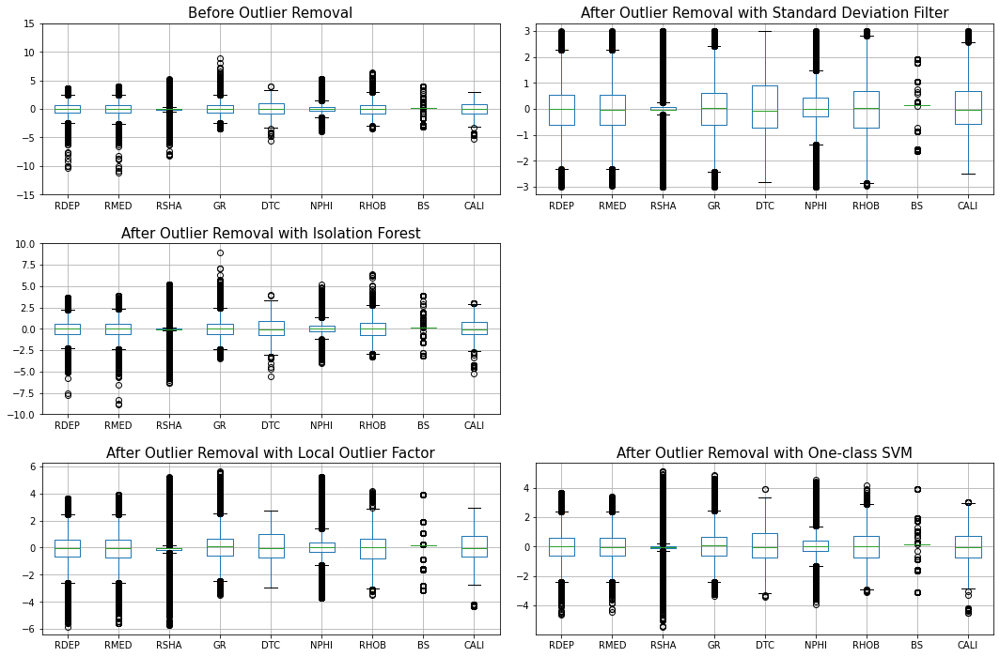

In [ ]:
#Box plotting data
box_features = ['RDEP','RMED', 'RSHA','GR', 'DTC', 'NPHI', 'RHOB', 'BS', 'CALI']
plt.figure(figsize=(15,10))

#Before outliers removal
plt.subplot(3,2,1)
train_norm[box_features].boxplot()
plt.ylim([-15, 15])
plt.title('Before Outlier Removal', size=15)

#Methods of outlier removal
plt.subplot(3,2,2)
train_data_std[box_features].boxplot()
plt.title('After Outlier Removal with Standard Deviation Filter', size=15)

plt.subplot(3,2,3)
train_data_iso[box_features].boxplot()
plt.ylim([-10, 10])
plt.title('After Outlier Removal with Isolation Forest', size=15)

#plt.subplot(3,2,4)
#data_train_ee.boxplot()
#plt.title('After Outlier Removal with Min. Covariance', size=15)

plt.subplot(3,2,5)
train_data_lof[box_features].boxplot()
plt.title('After Outlier Removal with Local Outlier Factor', size=15)

plt.subplot(3,2,6)
train_data_svm[box_features].boxplot()
plt.title('After Outlier Removal with One-class SVM', size=15)

plt.tight_layout(1.7)
plt.show()

We choose the best method: One-class SVM. Make pair-plot of data after outliers removed.

### Comparing Outliers Removal Methods Performance

In [ ]:
#ALREADY RUN

#Fitting a logistic regression model

model_lr = LogisticRegression(C=1e-3, solver='sag', max_iter=2000)

#Score with no Scale/Normalization
model_lr.fit(x_train, y_train.values.ravel())
print('The acuracy score withouth Normalization/scaling', model_lr.score(x_test, y_test))

# 1. Score after Scaling
model_lr.fit(x_train_scaled, y_train.values.ravel())
print('1. The accuracy score after Scaling', model_lr.score(x_test_scaled, y_test))

# 2. Score after Standardization
model_lr.fit(x_train_std, y_train.values.ravel())
print('2. The acuracy score after Standardization', model_lr.score(x_test_std, y_test))

# 3. Score after Normalization
model_lr.fit(x_train_norm, y_train.values.ravel())
print('3. The accuracy score after Normalization', model_lr.score(x_test_norm, y_test))

# 4. Normalization - Yeo-Johnson method
model_lr.fit(x_train_yj, y_train.values.ravel())
print('4. The accuracy score after Yeo-Johnson Standardization', model_lr.score(x_test_yj, y_test))

### Pair Ploting Best Outlier Removal Method

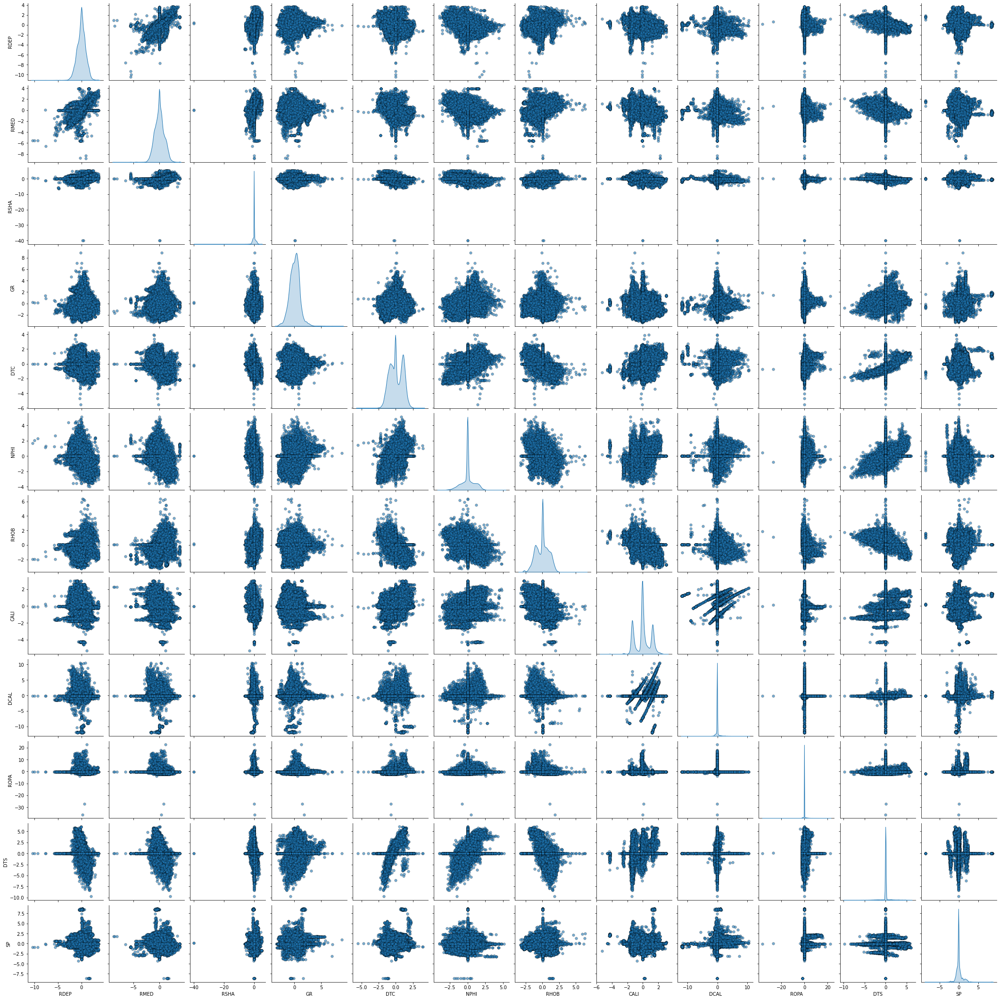

In [ ]:
#Pair plot after outlier removal
pairplot_features = ['RDEP','RMED', 'RSHA', 'GR', 'DTC', 'NPHI', 'RHOB', 'CALI', 'DCAL', 'ROPA', 'DTS', 'SP']
sns.pairplot(train_data_iso, diag_kind='kde', vars = pairplot_features, plot_kws = {'alpha': 0.6, 's': 30, 'edgecolor': 'k'})

## **10. MACHINE LEARNING PREDICTIONS**

In [ ]:
#pip install PyLMNN

In [ ]:
#Supervised Algorithms
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import mean_squared_error, accuracy_score, recall_score, precision_score, f1_score
from sklearn.neighbors import KNeighborsRegressor
from pprint import pprint
from sklearn.model_selection import StratifiedKFold
from sklearn.naive_bayes import GaussianNB
import xgboost
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier

## **10.1 STANDARD METHODS**


### **HYPERPARAMETER TUNNING FUNTIONS**

In [ ]:
def random_search(model, param_grid):
  #from sklearn.model_selection import PredefinedSplit

  #ps = PredefinedSplit(test_fold=test_set)
  model_cv = model_selection.RandomizedSearchCV(estimator=model, param_distributions=param_grid,
                                                n_iter=10, scoring='accuracy', verbose=10, n_jobs=1, cv=5)
  model_cv.fit(x_train, y_train)

  print("Best score is: {}".format(model_cv.best_score_))
  print("Tuned Model Parameter: {}".format(model_cv.best_params_))


def grid_search(model, param_grid):
  #from sklearn.model_selection import PredefinedSplit

  #ps = PredefinedSplit(test_fold=test_set)
  model_cv = model_selection.GridSearchCV(estimator=model, param_grid=param_grid,
                                          n_iter=10, scoring='accuracy', verbose=10, n_jobs=1, cv=5)
  model_cv.fit(x_train, y_train)

  print("Best score is: {}".format(model_cv.best_score_))
  print("Tuned Model Parameter: {}".format(model_cv.best_params_))

In [ ]:
def random_search(model, param_grid):
  model_cv = model_selection.RandomizedSearchCV(estimator=model, param_distributions=param_grid,
                                                n_iter=5, scoring='f1_weighted', verbose=10, n_jobs=1, cv=10)
  model_cv.fit(x_train, y_train)

  print("Best score is: {}".format(model_cv.best_score_))
  print("Tuned Model Parameter: {}".format(model_cv.best_params_))


def grid_search(model, param_grid):
  model_cv = model_selection.GridSearchCV(estimator=model, param_grid=param_grid,
                                          scoring='f1_weighted', verbose=10, n_jobs=1, cv=10)
  model_cv.fit(x_train, y_train)

  print("Best score is: {}".format(model_cv.best_score_))
  print("Tuned Model Parameter: {}".format(model_cv.best_params_))

### **OVERVIEW - BASE MODELS**


#### Randomly Sampling Data

In [ ]:
#Sampling Standarized Tarining Data to Optimize Time - DEPLOYING BASE MODEL
#Merging train data
new_train = pd.concat((x_train_std, pd.DataFrame(y_train, columns=["LITHO"])), axis=1)

#Randomly sampling data
sampled_train = new_train.sample(n=100000, random_state=0)
#sampled_train['LITHO'].value_counts()

#Spliting training data
x_train_base = sampled_train.drop(["LITHO"], axis=1)
y_train_base = sampled_train["LITHO"]

#### Base Models Comparition

In [ ]:
#Comparing base models accuracies by using k-fold cross validation - 10 folds

from sklearn.model_selection import cross_val_score

estimators = [LogisticRegression(C=1e-3, solver='saga', max_iter=4000), DecisionTreeClassifier(), RandomForestClassifier(), XGBClassifier(), SVC(), GradientBoostingClassifier()]
f1_train_scores = []
i=1
for estimator in estimators:
  f1_score_i = cross_val_score(estimator, x_train_base, y_train_base, cv=10, scoring='f1_weighted').mean()
  f1_train_scores.append(f1_score_i)

  print('---------------MODEL {} ACCURACY {}---------------'.format(i, f1_score_i))
  i += 1
#print(f1_train_scores)

---------------MODEL 1 ACCURACY 0.6395057331764828---------------
---------------MODEL 2 ACCURACY 0.8626636951340411---------------
---------------MODEL 3 ACCURACY 0.9132620794899307---------------
---------------MODEL 4 ACCURACY 0.8090214026522851---------------
---------------MODEL 5 ACCURACY 0.6331297884178222---------------
---------------MODEL 6 ACCURACY 0.8368101703990055---------------


In [ ]:
model_names = ['Logistic Regression', 'Decision Trees Classifier', 'Random Forest Classifier', 'XGB Classifier', 'Support Vector Machines', 'Gradient Boosting Classifier', 'K-Nearest Neighbor Classifier']
f1_train_scores = [0.6395057331764828, 0.8626636951340411, 0.9132620794899307, 0.8090214026522851, 0.6331297884178222, 0.8368101703990055, 0.9269218192506934]
base_models = pd.DataFrame(np.around(f1_train_scores,3), model_names, columns=['F1_SCORES']).sort_values('F1_SCORES', ascending=False)
base_models

,F1_SCORES
K-Nearest Neighbor Classifier,0.927
Random Forest Classifier,0.913
Decision Trees Classifier,0.863
Gradient Boosting Classifier,0.837
XGB Classifier,0.809
Logistic Regression,0.640
Support Vector Machines,0.633


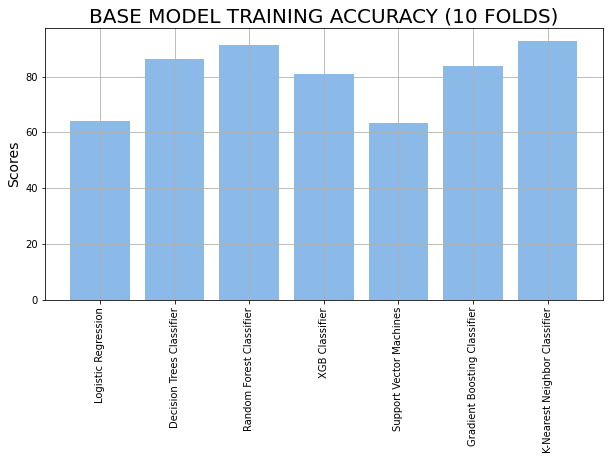

In [ ]:
#Visualizing Accuracies
f, ax = plt.subplots(figsize=(10,5))
x_pos = np.arange(len(model_names))

#Create Bars
ax.bar(x_pos, np.array(f1_train_scores)*100, color=(0.5, 0.7, 0.9, 0.9))
ax.set_ylabel('Scores', size=14)
ax.set_title('BASE MODEL TRAINING ACCURACY (10 FOLDS)', size=20)

plt.xticks(x_pos, model_names, rotation=90)
plt.grid(True)
plt.show()


### **A. SUPPORT VECTOR MACHINES** 
(EXPENSIVE IN TERMS OF RUNNING TIME)


#### **A1. MODEL WITH NO ARGUMENTED DATA**

In [ ]:
# Create the regressor
model_svm = SVC(verbose=1)

# Fit the regressor to the training data
model_svm.fit(x_test_std, y_test)

# Prediction
open_pred_svm = model_svm.predict(x_test_std)
hidden_pred_svm = model_svm.predict(x_hidden_std)

In [ ]:
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_svm)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_svm))
print('Open set report:', metrics.classification_report(y_test, open_pred_svm))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_svm)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_svm))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_svm))

-----------------------OPEN SET REPORT---------------------
Open set RMSE: 1.1866543282392699
Open set penalty matrix score: -0.540197827263024


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.69      0.78      0.74     24048
           1       0.66      0.45      0.54     17558
           2       0.85      0.94      0.89     83975
           3       0.54      0.07      0.12      3306
           4       0.00      0.00      0.00       416
           5       0.73      0.35      0.48      4798
           6       0.97      0.63      0.77       625
           8       0.97      0.29      0.44       125
           9       0.65      0.52      0.58      1245
          10       0.98      0.06      0.11       690

    accuracy                           0.80    136786
   macro avg       0.70      0.41      0.47    136786
weighted avg       0.78      0.80      0.78    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 2.881506433072749
Hidden set penalty matrix score: -1.1574262441072902
Hidden set report:               precision    recall  f1-score   support



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
cv_results = {"C": clf.cv_results_["param_C"], "gamma": clf.cv_results_["param_gamma"], "Score": clf.cv_results_['mean_test_score']}
cv_results = pd.DataFrame(cv_results)
cv_results = cv_results[cv_results.columns].astype(float)
cv_results = cv_results.pivot("C", "gamma", "Score")
plt.figure(figsize=(10, 8))
sns.heatmap(cv_results, annot=True, square=True, cmap="YlGnBu", fmt='.3g')
plt.title('F1 Score');

#### **A2. MODEL WITH ARGUMENTED DATA**

In [ ]:
# Create the regressor
model_svm = SVC(verbose=1)

# Fit the regressor to the training data
model_svm.fit(x_test_arg, y_test)

# Prediction
open_pred_svm = model_svm.predict(x_test_arg)
hidden_pred_svm = model_svm.predict(x_hidden_arg)

print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_svm)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_svm))
print('Open set report:', metrics.classification_report(y_test, open_pred_svm))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_svm)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_svm))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_svm))

[LibSVM]-----------------------OPEN SET REPORT---------------------
Open set RMSE: 1.434729578727389
Open set penalty matrix score: -1.1641487432924422


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.00      0.00      0.00     24048
           1       0.00      0.00      0.00     17558
           2       0.61      1.00      0.76     83975
           3       0.00      0.00      0.00      3306
           4       0.00      0.00      0.00       416
           5       0.00      0.00      0.00      4798
           6       0.00      0.00      0.00       625
           8       0.00      0.00      0.00       125
           9       0.00      0.00      0.00      1245
          10       0.00      0.00      0.00       690

    accuracy                           0.61    136786
   macro avg       0.06      0.10      0.08    136786
weighted avg       0.38      0.61      0.47    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 1.8992835375896502
Hidden set penalty matrix score: -1.3079538305677427
Hidden set report:               precision    recall  f1-score   support


### **B. LOGISTIC REGRESSION**

(EXPENSIVE IN TERMS OF RUNNING TIME)



#### B1. Base Model with non-argumented data

In [ ]:
# Create the regressor

model_lr = ########
model_lr.fit(x_train_std, y_train)

# Prediction
train_pred_lr = model_lr.predict(x_train_std)
open_pred_lr = model_lr.predict(x_test_std)
hidden_pred_lr = model_lr.predict(x_hidden_std)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 1239 epochs took 3392 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 56.5min finished


In [ ]:
#Printing Reports 
print('-----------------------TRAIN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_train, train_pred_lr)))
print('Open set penalty matrix score:', score(y_train.values, train_pred_lr))
print('Open set report:', metrics.classification_report(y_train, train_pred_lr))
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_lr)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_lr))
print('Open set report:', metrics.classification_report(y_test, open_pred_lr))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_lr)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_lr))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_lr))

-----------------------OPEN SET REPORT---------------------
Open set RMSE: 1.3543833995562096
Open set penalty matrix score: -0.8335895120845701


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.60      0.60      0.60     24048
           1       0.26      0.09      0.13     17558
           2       0.76      0.92      0.83     83975
           3       0.00      0.00      0.00      3306
           4       0.00      0.00      0.00       416
           5       0.52      0.51      0.51      4798
           6       0.00      0.00      0.00       625
           8       1.00      0.17      0.29       125
           9       0.45      0.01      0.02      1245
          10       0.89      0.23      0.37       690

    accuracy                           0.70    136786
   macro avg       0.45      0.25      0.28    136786
weighted avg       0.63      0.70      0.66    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 1.477714492687411
Hidden set penalty matrix score: -0.6940641927498223
Hidden set report:               precision    recall  f1-score   support



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
train_lr_res = labeled_data.copy()
test_lr_res = test_data.copy()
hidden_lr_res = hidden_data.copy()

In [ ]:
train_lr_res['LR_BM'] = train_pred_lr
test_lr_res['LR_BM'] = open_pred_lr
hidden_lr_res['LR_BM'] = hidden_pred_lr

In [ ]:
#Saving results 3 methods
train_lr_res.to_csv('/content/drive/MyDrive/Results_folder/Logistic_Regression/train_lr_res.csv', index=False)
test_lr_res.to_csv('/content/drive/MyDrive/Results_folder/Logistic_Regression/test_lr_res.csv', index=False)
hidden_lr_res.to_csv('/content/drive/MyDrive/Results_folder/Logistic_Regression/hidden_lr_res.csv', index=False)

#### B2. Base Model with argumented data (May be aproblem since arg data is not norm)

In [ ]:
# Create the regressor

model_lr1 = LogisticRegression(#######)
model_lr1.fit(x_train_arg, y_train)

# Prediction
train_pred_lr1 = model_lr1.predict(x_train_arg)
open_pred_lr1 = model_lr1.predict(x_test_arg)
hidden_pred_lr1 = model_lr1.predict(x_hidden_arg)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


In [ ]:
#Printing Reports 
print('-----------------------TRAIN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_train, train_pred_lr1)))
print('Open set penalty matrix score:', score(y_train.values, train_pred_lr1))
print('Open set report:', metrics.classification_report(y_train, train_pred_lr1))
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_lr1)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_lr1))
print('Open set report:', metrics.classification_report(y_test, open_pred_lr1))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_lr1)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_lr1))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_lr1))

#### B4. Plotting Results

In [ ]:
#Importing files
train_lr_res = pd.read_csv('/content/drive/MyDrive/Results_folder/Logistic_Regression/train_lr_res.csv')
test_lr_res = pd.read_csv('/content/drive/MyDrive/Results_folder/Logistic_Regression/test_lr_res.csv')
hidden_lr_res = pd.read_csv('/content/drive/MyDrive/Results_folder/Logistic_Regression/hidden_lr_res.csv')

In [ ]:
#default_confusion_matrix(hidden_lr_res.LITHO, hidden_lr_res.LR_BM)

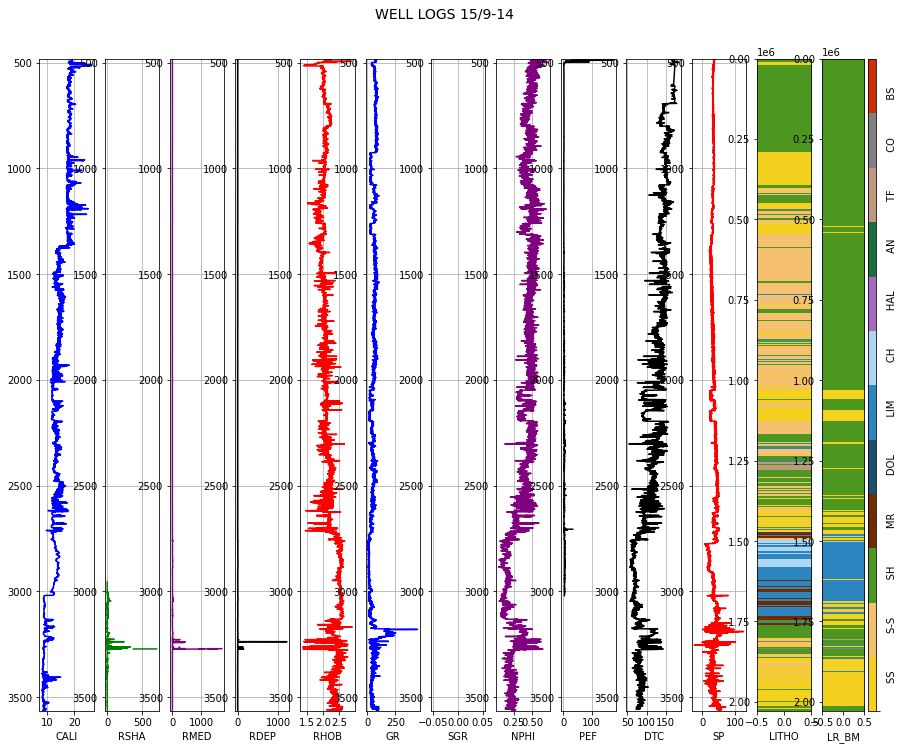

In [ ]:
#Plotting predictions - HIDDEN DATASET
for i in range(1):
  pred_log(test_lr_res, i, facies_colors, 1)

### **C. GRADIENT BOOSTING**
(EXPENSIVE IN TERMS OF RUNNING TIME)

#### C1. Non-argumented Data Model

In [ ]:
# Create the regressor 
%%time
model_gb = GradientBoostingClassifier(learning_rate=0.01, verbose=1, validation_fraction=0.3, n_iter_no_change=10)

# Fit the regressor to the training data 
model_gb.fit(x_train_std, y_train)

# Prediction 
train_pred_gb = model_gb.predict(x_train_std) 
open_pred_gb = model_gb.predict(x_test_std) 
hidden_pred_gb = model_gb.predict(x_hidden_std) 


      Iter       Train Loss   Remaining Time 
         1     1001043.5998          120.51m
         2      986148.1085          119.87m
         3      973660.6825          118.67m
         4      962375.4445          118.12m
         5      952242.0878          117.22m
         6      942919.8225          116.36m
         7      934191.2065          115.80m
         8      926031.4704          114.69m
         9      918082.8284          113.45m
        10      910723.6057          112.23m
        20      848257.4981           99.69m
        30      802337.3055           87.20m
        40      765827.4321           75.17m
        50      735853.4463           62.33m
        60      710649.9819           49.72m
        70      689204.5182           37.19m
        80      670472.9885           24.75m
        90      653659.9494           12.37m
       100      638389.8924            0.00s
CPU times: user 2h 4min 28s, sys: 4.18 s, total: 2h 4min 33s
Wall time: 2h 4min 11s


In [ ]:
#Printing Reports 
print('-----------------------TRAINING SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_train, train_pred_gb)))
print('Open set penalty matrix score:', score(y_train.values, train_pred_gb))
print('Open set report:', metrics.classification_report(y_train, train_pred_gb))
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_gb)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_gb))
print('Open set report:', metrics.classification_report(y_test, open_pred_gb))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_gb)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_gb))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_gb))

-----------------------TRAINING SET REPORT---------------------
Open set RMSE: 1.2056208282871657
Open set penalty matrix score: -0.7228590760787382
Open set report:               precision    recall  f1-score   support

           0       0.81      0.47      0.60    168937
           1       0.72      0.14      0.24    150455
           2       0.73      0.99      0.84    720803
           3       0.80      0.14      0.24     33329
           4       0.90      0.10      0.17      1688
           5       0.82      0.46      0.59     56320
           6       0.81      0.57      0.67     10513
           7       0.99      0.99      0.99      8213
           8       0.92      0.84      0.88      1085
           9       0.79      0.34      0.47     15245
          10       0.89      0.31      0.46      3820
          11       0.89      0.90      0.90       103

    accuracy                           0.74   1170511
   macro avg       0.84      0.52      0.59   1170511
weighted avg       0.7

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.84      0.58      0.69     24048
           1       0.36      0.02      0.04     17558
           2       0.72      0.99      0.84     83975
           3       0.00      0.00      0.00      3306
           4       0.00      0.00      0.00       416
           5       0.54      0.40      0.46      4798
           6       0.08      0.02      0.03       625
           8       0.93      0.41      0.57       125
           9       0.77      0.08      0.15      1245
          10       0.80      0.33      0.47       690

    accuracy                           0.73    136786
   macro avg       0.50      0.28      0.32    136786
weighted avg       0.67      0.73      0.66    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 1.3105534200309823
Hidden set penalty matrix score: -0.9371788115721791
Hidden set report:               precision    recall  f1-score   support


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [ ]:
#Storing results
train_gb_res = labeled_data.copy()
test_gb_res = test_data.copy()
hidden_gb_res = hidden_data.copy()

In [ ]:
#Appending predictions to a copy of the original datasets
train_gb_res['GB_BM'] = train_pred_gb
test_gb_res['GB_BM'] = open_pred_gb
hidden_gb_res['GB_BM'] = hidden_pred_gb

In [ ]:
#Saving results 3 methods
train_gb_res.to_csv('/content/drive/MyDrive/Results_folder/train_gb_RES.csv', index=False)
test_gb_res.to_csv('/content/drive/MyDrive/Results_folder/test_gb_RES.csv', index=False)
hidden_gb_res.to_csv('/content/drive/MyDrive/Results_folder/hidden_gb_RES.csv', index=False)


#### C4. Plotting Results

In [ ]:
#Importing files
train_gb_res = pd.read_csv('/content/drive/MyDrive/Results_folder/GB/train_gb_RES.csv')
test_gb_res = pd.read_csv('/content/drive/MyDrive/Results_folder/GB/test_gb_RES.csv')
hidden_gb_res = pd.read_csv('/content/drive/MyDrive/Results_folder/GB/hidden_gb_RES.csv')

In [ ]:
metrics_report2(hidden_gb_res.LITHO, hidden_gb_res.GB_)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



,METRIC
Accuracy,67.80
F1 score,61.75
Recall,67.80
Precision,67.62
Matrix Score,-0.94


In [ ]:
#default_confusion_matrix(hidden_gb_res.LITHO, hidden_gb_res.GB_BM)

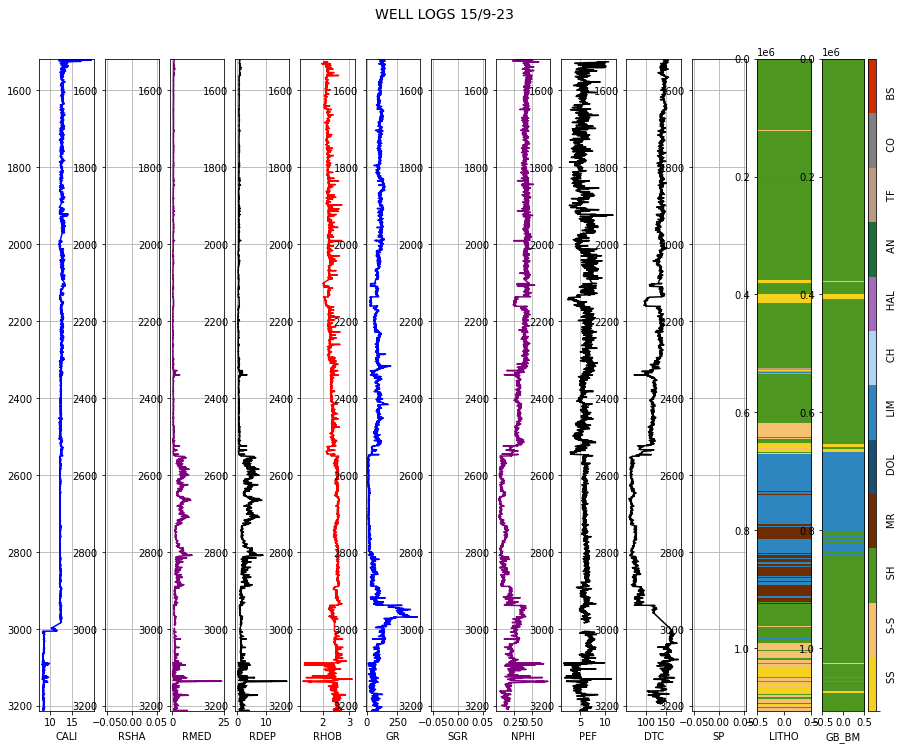

In [ ]:
#Plotting predictions - HIDDEN DATASET
for i in range(1):
  pred_log(hidden_gb_res, i, facies_colors, 1)

*The logistic regression seems to be a decent classifier for the majority classes but when it comes to the minoriy ones it does not do well. For instance with depth of 2 it separates accurately the majority classes ( accuracies = 67 and 64%). One approach to solve this might be to balance the dataset and see how it performs.*

### **D. DECISION TREES**

#### C1. Base Model with non-argumented data

In [ ]:
# Create the regressor
model_dt = DecisionTreeClassifier()

# Fit the regressor to the training data
model_dt.fit(x_train, y_train)

train_pred_dt = model_dt.predict(x_train)
open_pred_dt = model_dt.predict(x_test)
hidden_pred_dt = model_dt.predict(x_hidden)

In [ ]:
#Printing Reports 

print('-----------------------TRAIN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_train, train_pred_dt)))
print('Open set penalty matrix score:', score(y_train.values, train_pred_dt))
print('Open set report:', metrics.classification_report(y_train, train_pred_dt))
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_dt)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_dt))
print('Open set report:', metrics.classification_report(y_test, open_pred_dt))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_dt)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_dt))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_dt))

-----------------------TRAIN SET REPORT---------------------
Open set RMSE: 0.0
Open set penalty matrix score: 0.0
Open set report:               precision    recall  f1-score   support

           0       1.00      1.00      1.00    168937
           1       1.00      1.00      1.00    150455
           2       1.00      1.00      1.00    720803
           3       1.00      1.00      1.00     33329
           4       1.00      1.00      1.00      1688
           5       1.00      1.00      1.00     56320
           6       1.00      1.00      1.00     10513
           7       1.00      1.00      1.00      8213
           8       1.00      1.00      1.00      1085
           9       1.00      1.00      1.00     15245
          10       1.00      1.00      1.00      3820
          11       1.00      1.00      1.00       103

    accuracy                           1.00   1170511
   macro avg       1.00      1.00      1.00   1170511
weighted avg       1.00      1.00      1.00   1170511

-

In [ ]:
train_dt_res = labeled_data.copy()
test_dt_res = test_data.copy()
hidden_dt_res = hidden_data.copy()

In [ ]:
train_dt_res['DT_BM'] = train_pred_dt
test_dt_res['DT_BM'] = open_pred_dt
hidden_dt_res['DT_BM'] = hidden_pred_dt

*The logistic regression seems to be a decent classifier for the majority classes but when it comes to the minoriy ones it does not do well. For instance with depth of 2 it separates accurately the majority classes ( accuracies = 67 and 64%). One approach to solve this might be to balance the dataset and see how it performs.*

#### C2. Base Model with non-argumented data (PRUNED)

In [ ]:
#Decision tree pruning - COST COMPLEXITY PRUNING
#from sklearn import tree

#plt.figure(figsize=(15, 10))
#tree.plot_tree(model_dt, filled=True)

In [ ]:
path = model_dt.cost_complexity_pruning_path(x_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [ ]:
#Indexes to take impurities and ccp_alphas
#ind = [3471*x for x in range(11)]     #Taking just a bunch of imp/ccp to fit
ind = [0, 10000, 25000, 34500, 34550, 34600, 34650, 34700, 34715]
ccp_alphas_s = ccp_alphas[ind]
impurities_s = impurities[ind]

In [ ]:
#Fitting models
clfs =[]

for ccp_alpha in ccp_alphas_s:
  clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf.fit(x_train, y_train)
  clfs.append(clf)

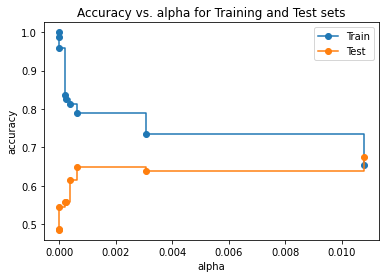

In [ ]:
#Accuracy vs alpha for training and test sets

train_scores = [clf.score(x_train, y_train) for clf in clfs]
test_scores = [clf.score(x_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('Accuracy vs. alpha for Training and Test sets')

ax.plot(ccp_alphas_s, train_scores, marker='o', label='Train', drawstyle='steps-post')
ax.plot(ccp_alphas_s, test_scores, marker='o', label='Test', drawstyle='steps-post')

ax.legend()
plt.show()

In [ ]:
# Create the regressor
model_dt1 = DecisionTreeClassifier(ccp_alpha=0.002)

# Fit the regressor to the training data
model_dt1.fit(x_train, y_train)

train_pred_dtp = model_dt1.predict(x_train)
open_pred_dtp = model_dt1.predict(x_test)
hidden_pred_dtp = model_dt1.predict(x_hidden)

#Printing Reports 

print('-----------------------TRAIN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_train, train_pred_dtp)))
print('Open set penalty matrix score:', score(y_train.values, train_pred_dtp))
print('Open set report:', metrics.classification_report(y_train, train_pred_dtp))
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_dtp)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_dtp))
print('Open set report:', metrics.classification_report(y_test, open_pred_dtp))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_dtp)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_dtp))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_dtp))

-----------------------TRAIN SET REPORT---------------------
Open set RMSE: 1.3291881704716975
Open set penalty matrix score: -0.6539887279999932


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.70      0.57      0.63    168937
           1       0.56      0.38      0.45    150455
           2       0.80      0.95      0.87    720803
           3       0.48      0.19      0.27     33329
           4       0.00      0.00      0.00      1688
           5       0.72      0.43      0.54     56320
           6       0.65      0.64      0.64     10513
           7       0.78      1.00      0.88      8213
           8       0.00      0.00      0.00      1085
           9       0.00      0.00      0.00     15245
          10       0.00      0.00      0.00      3820
          11       0.00      0.00      0.00       103

    accuracy                           0.76   1170511
   macro avg       0.39      0.35      0.36   1170511
weighted avg       0.72      0.76      0.73   1170511

-----------------------OPEN SET REPORT---------------------
Open set RMSE: 1.3670682022897807
Open set penalty matri

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.76      0.58      0.66     24048
           1       0.25      0.25      0.25     17558
           2       0.75      0.88      0.81     83975
           3       0.70      0.06      0.11      3306
           4       0.00      0.00      0.00       416
           5       0.53      0.33      0.41      4798
           6       0.00      0.00      0.00       625
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00       125
           9       0.00      0.00      0.00      1245
          10       0.00      0.00      0.00       690

    accuracy                           0.68    136786
   macro avg       0.27      0.19      0.20    136786
weighted avg       0.66      0.68      0.66    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 1.2537353194676573
Hidden set penalty matrix score: -0.8275366226296396
Hidden set report: 

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
train_dt_res['DT_PRU'] = train_pred_dtp
test_dt_res['DT_PRU'] = open_pred_dtp
hidden_dt_res['DT_PRU'] = hidden_pred_dtp

In [ ]:
#Saving results 2 methods
train_dt_res.to_csv('/content/drive/MyDrive/Results_folder/Decision_Trees/train_dt_res.csv', index=False)
test_dt_res.to_csv('/content/drive/MyDrive/Results_folder/Decision_Trees/test_dt_res.csv', index=False)
hidden_dt_res.to_csv('/content/drive/MyDrive/Results_folder/Decision_Trees/hidden_dt_res.csv', index=False)

#### C3. Base Model with argumented data (PRUNED)

In [ ]:
# Pruning the tree 
model_dt_arg = DecisionTreeClassifier(random_state=0)

path1 = model_dt_arg.cost_complexity_pruning_path(x_train, y_train)
ccp_alphas, impurities = path1.ccp_alphas, path1.impurities

#Indexes to take impurities and ccp_alphas
#ind = [3471*x for x in range(11)]     #Taking just a bunch of imp/ccp to fit
ind = [0, 10000, 15000, 27000, 34500, 34600,  34700, 34723, 34725, 34727]
ccp_alphas_s1 = ccp_alphas[ind]
impurities_s1 = impurities[ind]

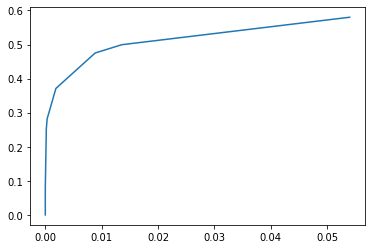

In [ ]:
plt.plot(ccp_alphas_s1, impurities_s1)

In [ ]:
#Fitting models
clfs1 =[]

for ccp_alpha in ccp_alphas_s1:
  clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf.fit(x_train_arg, y_train)
  clfs1.append(clf)

In [ ]:
ccp_alphas_s1

array([0.00000000e+00, 1.36692436e-06, 1.61966872e-06, 4.27163863e-06,
       1.80995763e-04, 3.26118076e-04, 1.88119793e-03, 8.84163314e-03,
       1.35749336e-02, 5.39924046e-02])

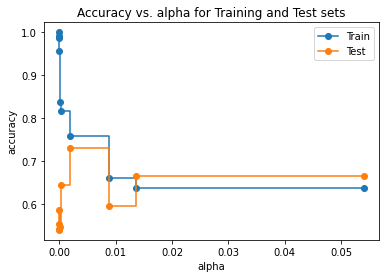

In [ ]:
#Accuracy vs alpha for training and test sets

train_scores1 = [clf.score(x_train_arg, y_train) for clf in clfs1]
test_scores1 = [clf.score(x_test_arg, y_test) for clf in clfs1]

fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('Accuracy vs. alpha for Training and Test sets')

ax.plot(ccp_alphas_s1, train_scores1, marker='o', label='Train', drawstyle='steps-post')
ax.plot(ccp_alphas_s1, test_scores1, marker='o', label='Test', drawstyle='steps-post')

ax.legend()
plt.show()

In [ ]:
# Create the regressor by using pruned parameters
model_dt_arg = DecisionTreeClassifier(random_state=0, ccp_alpha=0.002)

# Fit the regressor to the training data
model_dt_arg.fit(x_train_arg, y_train)

train_pred_dt1 = model_dt_arg.predict(x_train_arg)
open_pred_dt1 = model_dt_arg.predict(x_test_arg)
hidden_pred_dt1 = model_dt_arg.predict(x_hidden_arg)

In [ ]:
#Printing Reports 

print('-----------------------TRAIN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_train, train_pred_dt1)))
print('Open set penalty matrix score:', score(y_train.values, train_pred_dt1))
print('Open set report:', metrics.classification_report(y_train, train_pred_dt1))
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_dt1)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_dt1))
print('Open set report:', metrics.classification_report(y_test, open_pred_dt1))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_dt1)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_dt1))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_dt1))

-----------------------TRAIN SET REPORT---------------------
Open set RMSE: 1.32760189584577
Open set penalty matrix score: -0.6529347011689767


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.70      0.57      0.63    168937
           1       0.55      0.39      0.46    150455
           2       0.80      0.95      0.87    720803
           3       0.50      0.18      0.27     33329
           4       0.00      0.00      0.00      1688
           5       0.72      0.44      0.55     56320
           6       0.65      0.64      0.64     10513
           7       0.78      1.00      0.88      8213
           8       0.00      0.00      0.00      1085
           9       0.00      0.00      0.00     15245
          10       0.00      0.00      0.00      3820
          11       0.00      0.00      0.00       103

    accuracy                           0.76   1170511
   macro avg       0.39      0.35      0.36   1170511
weighted avg       0.72      0.76      0.73   1170511

-----------------------OPEN SET REPORT---------------------
Open set RMSE: 1.3444718589156197
Open set penalty matri

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.76      0.57      0.65     24048
           1       0.39      0.26      0.31     17558
           2       0.77      0.95      0.85     83975
           3       0.73      0.06      0.11      3306
           4       0.00      0.00      0.00       416
           5       0.53      0.34      0.41      4798
           6       0.00      0.00      0.00       625
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00       125
           9       0.00      0.00      0.00      1245
          10       0.00      0.00      0.00       690

    accuracy                           0.73    136786
   macro avg       0.29      0.20      0.21    136786
weighted avg       0.69      0.73      0.69    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 1.236590120594183
Hidden set penalty matrix score: -0.7319021299541656
Hidden set report:  

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
train_dt_res['DT_PRU_A'] = train_pred_dt1
test_dt_res['DT_PRU_A'] = open_pred_dt1
hidden_dt_res['DT_PRU_A'] = hidden_pred_dt1

In [ ]:
#Saving results 3 methods
train_dt_res.to_csv('/content/drive/MyDrive/Results_folder/Decision_Trees/train_dt_res.csv', index=False)
test_dt_res.to_csv('/content/drive/MyDrive/Results_folder/Decision_Trees/test_dt_res.csv', index=False)
hidden_dt_res.to_csv('/content/drive/MyDrive/Results_folder/Decision_Trees/hidden_dt_res.csv', index=False)

#### C4. Plotting Results

In [ ]:
#Importing files
train_dt_res = pd.read_csv('/content/drive/MyDrive/Results_folder/Decision_Trees/train_dt_res.csv')
test_dt_res = pd.read_csv('/content/drive/MyDrive/Results_folder/Decision_Trees/test_dt_res.csv')
hidden_dt_res = pd.read_csv('/content/drive/MyDrive/Results_folder/Decision_Trees/hidden_dt_res.csv')

In [ ]:
#metrics_report2(hidden_dt_res.LITHO, hidden_dt_res.DT_PRU_A)
#default_confusion_matrix(test_dt_res.LITHO, test_dt_res.DT_PRU_A)

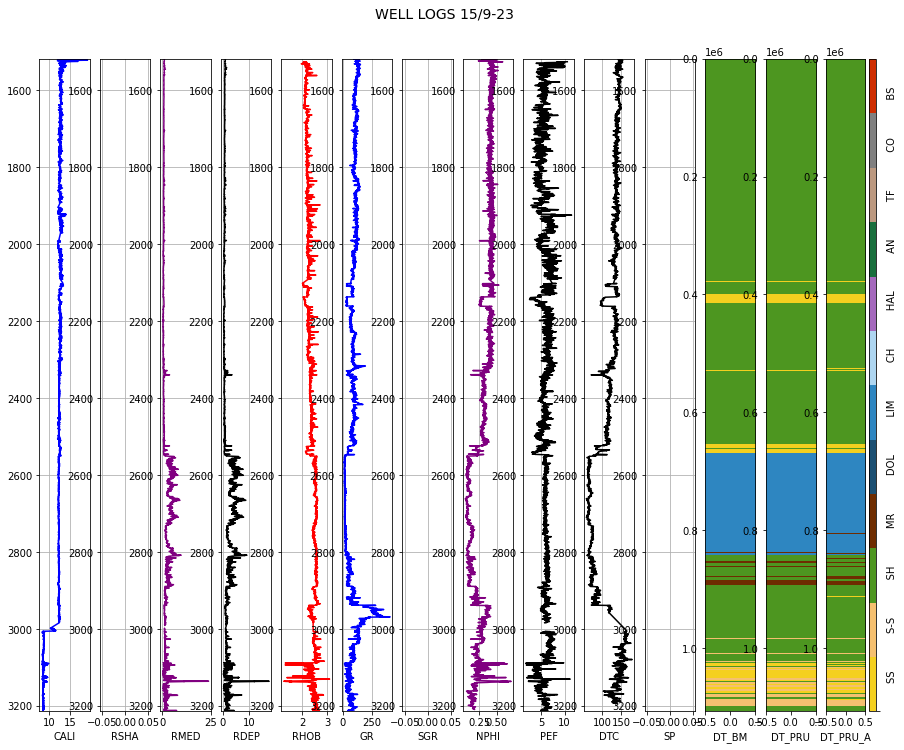

In [ ]:
#Plotting predictions - HIDDEN DATASET
for i in range(1):
  pred_log(hidden_dt_res, i, facies_colors, 2)

*The logistic regression seems to be a decent classifier for the majority classes but when it comes to the minoriy ones it does not do well. For instance with depth of 2 it separates accurately the majority classes ( accuracies = 67 and 64%). One approach to solve this might be to balance the dataset and see how it performs.*

### **E. K-NEAREST NEIGHBOUR**

#### E1. Non-argumented Data Model

In [ ]:
#Hyper-parameter tunning 
model_knn = KNeighborsClassifier()
knn_parameters = {########
                  }
random_search(model_knn, knn_parameters)

Fitting 5 folds for each of 15 candidates, totalling 75 fits
[CV] weights=distance, n_neighbors=9, metric=euclidean ...............


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:667: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=5.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  weights=distance, n_neighbors=9, metric=euclidean, score=0.928, total=  21.6s
[CV] weights=distance, n_neighbors=9, metric=euclidean ...............


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   21.6s remaining:    0.0s


[CV]  weights=distance, n_neighbors=9, metric=euclidean, score=0.929, total=  22.6s
[CV] weights=distance, n_neighbors=9, metric=euclidean ...............


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   44.2s remaining:    0.0s


[CV]  weights=distance, n_neighbors=9, metric=euclidean, score=0.927, total=  21.9s
[CV] weights=distance, n_neighbors=9, metric=euclidean ...............


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:  1.1min remaining:    0.0s


[CV]  weights=distance, n_neighbors=9, metric=euclidean, score=0.928, total=  21.3s
[CV] weights=distance, n_neighbors=9, metric=euclidean ...............


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:  1.5min remaining:    0.0s


[CV]  weights=distance, n_neighbors=9, metric=euclidean, score=0.931, total=  22.2s
[CV] weights=uniform, n_neighbors=3, metric=euclidean ................


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.8min remaining:    0.0s


[CV]  weights=uniform, n_neighbors=3, metric=euclidean, score=0.926, total=  21.8s
[CV] weights=uniform, n_neighbors=3, metric=euclidean ................


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  2.2min remaining:    0.0s


[CV]  weights=uniform, n_neighbors=3, metric=euclidean, score=0.928, total=  22.3s
[CV] weights=uniform, n_neighbors=3, metric=euclidean ................


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:  2.6min remaining:    0.0s


[CV]  weights=uniform, n_neighbors=3, metric=euclidean, score=0.925, total=  21.9s
[CV] weights=uniform, n_neighbors=3, metric=euclidean ................


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  2.9min remaining:    0.0s


[CV]  weights=uniform, n_neighbors=3, metric=euclidean, score=0.926, total=  21.8s
[CV] weights=uniform, n_neighbors=3, metric=euclidean ................


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  3.3min remaining:    0.0s


[CV]  weights=uniform, n_neighbors=3, metric=euclidean, score=0.931, total=  21.8s
[CV] weights=uniform, n_neighbors=8, metric=minkowski ................
[CV]  weights=uniform, n_neighbors=8, metric=minkowski, score=0.918, total=  21.9s
[CV] weights=uniform, n_neighbors=8, metric=minkowski ................
[CV]  weights=uniform, n_neighbors=8, metric=minkowski, score=0.918, total=  21.8s
[CV] weights=uniform, n_neighbors=8, metric=minkowski ................
[CV]  weights=uniform, n_neighbors=8, metric=minkowski, score=0.916, total=  21.7s
[CV] weights=uniform, n_neighbors=8, metric=minkowski ................
[CV]  weights=uniform, n_neighbors=8, metric=minkowski, score=0.917, total=  22.5s
[CV] weights=uniform, n_neighbors=8, metric=minkowski ................
[CV]  weights=uniform, n_neighbors=8, metric=minkowski, score=0.918, total=  21.8s
[CV] weights=distance, n_neighbors=9, metric=manhattan ...............
[CV]  weights=distance, n_neighbors=9, metric=manhattan, score=0.933, total=

[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed: 27.4min finished


Best score is: 0.9360767580574825
Tuned Model Parameter: {'weights': 'distance', 'n_neighbors': 6, 'metric': 'manhattan'}


In [ ]:
##Tuned Model and whole data
from sklearn import neighbors

model_knn = neighbors.KNeighborsClassifier(######)
model_knn.fit(x_train, y_train)

train_pred_knn = model_knn.predict(x_train)
open_pred_knn = model_knn.predict(x_test_std)
hidden_pred_knn = model_knn.predict(x_hidden_std)

In [ ]:
#Printing Reports 
print('-----------------------TRAINING SET REPORT---------------------')
print("Training set RMSE:", np.sqrt(mean_squared_error(y_train, train_pred_knn)))
print('Training set penalty matrix score:', score(y_train.values, train_pred_knn))
print('Training set report:', metrics.classification_report(y_train, train_pred_knn))
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_knn)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_knn))
print('Open set report:', metrics.classification_report(y_test, open_pred_knn))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_knn)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_knn))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_knn))

-----------------------TRAINING SET REPORT---------------------
Training set RMSE: 0.0
Training set penalty matrix score: 0.0
Training set report:               precision    recall  f1-score   support

           0       1.00      1.00      1.00    112948
           1       1.00      1.00      1.00    105588
           2       1.00      1.00      1.00    518726
           3       1.00      1.00      1.00     22774
           4       1.00      1.00      1.00       477
           5       1.00      1.00      1.00     31168
           6       1.00      1.00      1.00      8287
           7       1.00      1.00      1.00      6273
           8       1.00      1.00      1.00       578
           9       1.00      1.00      1.00     11168
          10       1.00      1.00      1.00      1319
          11       1.00      1.00      1.00        52

    accuracy                           1.00    819358
   macro avg       1.00      1.00      1.00    819358
weighted avg       1.00      1.00      1.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.71      0.72      0.72     24048
           1       0.32      0.25      0.28     17558
           2       0.82      0.88      0.85     83975
           3       0.44      0.16      0.24      3306
           4       0.00      0.00      0.00       416
           5       0.33      0.42      0.37      4798
           6       0.00      0.00      0.00       625
           7       0.00      0.00      0.00         0
           8       0.50      0.01      0.02       125
           9       0.61      0.50      0.55      1245
          10       0.82      0.19      0.31       690

    accuracy                           0.72    136786
   macro avg       0.41      0.29      0.30    136786
weighted avg       0.70      0.72      0.71    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 1.3904400487512816
Hidden set penalty matrix score: -0.7822710115444006
Hidden set report: 

**NOTE:** model_knn = neighbors.KNeighborsClassifier(weights='distance', n_neighbors=8) GAVE AN OPEN SET ACCURACY OF 69%

In [ ]:
#Storing results
test_knn_res = test_data.copy()
hidden_knn_res = hidden_data.copy()

#Appending predictions to a copy of the original datasets
test_knn_res['KNN_NA'] = open_pred_knn
hidden_knn_res['KNN_NA'] = hidden_pred_knn

In [ ]:
#Saving results 2 methods
test_knn_res.to_csv('/content/drive/MyDrive/Results_folder/KNN/test_knn_RES.csv', index=False)
hidden_knn_res.to_csv('/content/drive/MyDrive/Results_folder/KNN/hidden_knn_RES.csv', index=False)

#### E2. Non-argumented Data with K-Fold

In [ ]:
split = 10
kf = StratifiedKFold(n_splits=split, shuffle=True, random_state=1)

open_pred_knn = np.zeros((len(x_test_std), 12))
hidden_pred_knn = np.zeros((len(x_hidden_std), 12))

model_knn1 = neighbors.KNeighborsClassifier(##########)

i = 1

for (train_index, test_index) in kf.split(x_train_std, y_train):
  X_train, X_test = x_train_std.iloc[train_index], x_train_std.iloc[test_index]
  Y_train, Y_test = y_train.iloc[train_index], y_train.iloc[test_index]

  model_knn1.fit(X_train, Y_train)
  prediction = model_knn1.predict(X_test)
  print('Fold accuracy:', accuracy_score(Y_test, prediction))

  print(f'-----------------------FOLD {i}---------------------')
  i+=1

  open_pred_knn += model_knn1.predict_proba(x_test_std)
  hidden_pred_knn += model_knn1.predict_proba(x_hidden_std)

open_pred_knn = pd.DataFrame(open_pred_knn/split)
open_pred_knn = np.array(pd.DataFrame(open_pred_knn).idxmax(axis=1))

hidden_pred_knn = pd.DataFrame(hidden_pred_knn/split)
hidden_pred_knn = np.array(pd.DataFrame(hidden_pred_knn).idxmax(axis=1))


Fold accuracy: 0.918668625909852
-----------------------FOLD 1---------------------
Fold accuracy: 0.9200775730237247
-----------------------FOLD 2---------------------
Fold accuracy: 0.9185312385199614
-----------------------FOLD 3---------------------
Fold accuracy: 0.9186508445036778
-----------------------FOLD 4---------------------
Fold accuracy: 0.9193941102596305
-----------------------FOLD 5---------------------
Fold accuracy: 0.9198212744871893
-----------------------FOLD 6---------------------
Fold accuracy: 0.9193172206986698
-----------------------FOLD 7---------------------
Fold accuracy: 0.9188131669101502
-----------------------FOLD 8---------------------
Fold accuracy: 0.9198127312026382
-----------------------FOLD 9---------------------
Fold accuracy: 0.919086552015788
-----------------------FOLD 10---------------------


In [ ]:
#Printing Reports 
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_knn)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_knn))
print('Open set report:', metrics.classification_report(y_test, open_pred_knn))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_knn)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_knn))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_knn))

-----------------------OPEN SET REPORT---------------------
Open set RMSE: 1.4181059622091792
Open set penalty matrix score: -0.9211770575936133


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.67      0.65      0.66     24048
           1       0.23      0.23      0.23     17558
           2       0.77      0.79      0.78     83975
           3       0.52      0.15      0.24      3306
           4       0.03      0.00      0.01       416
           5       0.31      0.44      0.37      4798
           6       0.00      0.00      0.00       625
           7       0.00      0.00      0.00         0
           8       0.88      0.30      0.44       125
           9       0.30      0.41      0.35      1245
          10       0.82      0.31      0.45       690

    accuracy                           0.66    136786
   macro avg       0.41      0.30      0.32    136786
weighted avg       0.65      0.66      0.65    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 1.992389336537435
Hidden set penalty matrix score: -1.02311841793508
Hidden set report:    

In [ ]:
#Saving Results
test_knn_res['KNN_A'] = open_pred_knn
hidden_knn_res['KNN_A'] = hidden_pred_knn

test_knn_res.to_csv('/content/drive/MyDrive/Results_folder/KNN/test_knn_RES.csv', index=False)
hidden_knn_res.to_csv('/content/drive/MyDrive/Results_folder/KNN/hidden_knn_RES.csv', index=False)

#### E3. PLOTTING RESULTS

In [ ]:
#Importing results csv files
test_knn_res = pd.read_csv('/content/drive/MyDrive/Results_folder/KNN/test_knn_RES.csv')
hidden_knn_res = pd.read_csv('/content/drive/MyDrive/Results_folder/KNN/hidden_knn_RES.csv')

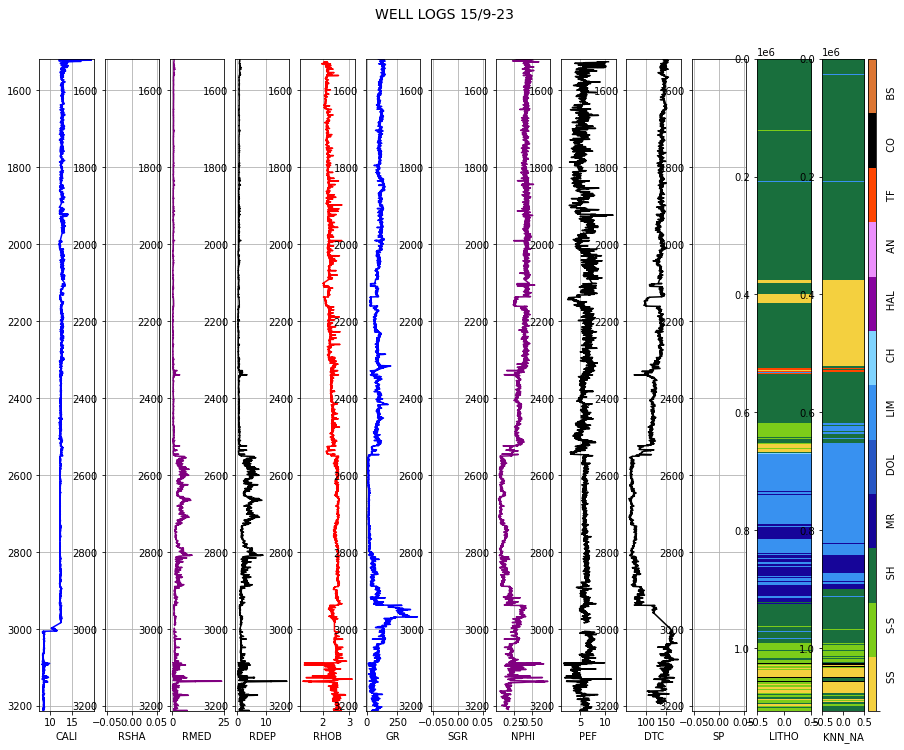

In [ ]:
#Plotting predictions - HIDDEN DATASET
for i in range(1):
  pred_log(hidden_knn_res, i, facies_colors, 1)

In [ ]:
from sklearn import neighbors 
model_knn = neighbors.KNeighborsClassifier(weights='distance', n_neighbors=8)
model_knn.fit(x_train_std, y_train)

prediction_knn = model_knn.predict(x_test_std)

accuracy_score(y_test, prediction_knn)  # Accuracy non-normalized data = 0.518 - normalized data=0.67

0.6926659161025251

## **10.2 ENSEMBLE AND BOOSTING METHODS**

### **G. RANDOM FOREST CLASSIFIER (Ensemble Method)**

#### G1. Base Model with non-argumented data


In [ ]:
#Sampling Standarized Tarining Data to Optimize Time - DEPLOYING BASE MODEL
#Merging train data
new_train = pd.concat((x_train_std, pd.DataFrame(y_train, columns=["LITHO"])), axis=1)

#Randomly sampling data
sampled_train = new_train.sample(n=819358, random_state=0)
#sampled_train['LITHO'].value_counts()

#Spliting training data
x_train = sampled_train.drop(["LITHO"], axis=1)
y_train = sampled_train["LITHO"]

In [ ]:
#Hyper-parameter tunning 
model_rf = RandomForestClassifier(random_state=1)
rf_parameters = {#########
                }

random_search(model_rf, rf_parameters)

Fitting 5 folds for each of 15 candidates, totalling 75 fits
[CV] n_estimators=300, max_depth=17, criterion=gini ..................


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:667: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=5.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  n_estimators=300, max_depth=17, criterion=gini, score=0.921, total= 1.4min
[CV] n_estimators=300, max_depth=17, criterion=gini ..................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.4min remaining:    0.0s


[CV]  n_estimators=300, max_depth=17, criterion=gini, score=0.920, total= 1.4min
[CV] n_estimators=300, max_depth=17, criterion=gini ..................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  2.8min remaining:    0.0s


[CV]  n_estimators=300, max_depth=17, criterion=gini, score=0.926, total= 1.4min
[CV] n_estimators=300, max_depth=17, criterion=gini ..................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:  4.2min remaining:    0.0s


[CV]  n_estimators=300, max_depth=17, criterion=gini, score=0.920, total= 1.4min
[CV] n_estimators=300, max_depth=17, criterion=gini ..................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:  5.6min remaining:    0.0s


[CV]  n_estimators=300, max_depth=17, criterion=gini, score=0.922, total= 1.4min
[CV] n_estimators=150, max_depth=2, criterion=entropy ................


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  6.9min remaining:    0.0s


[CV]  n_estimators=150, max_depth=2, criterion=entropy, score=0.493, total=  21.7s
[CV] n_estimators=150, max_depth=2, criterion=entropy ................


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  7.3min remaining:    0.0s


[CV]  n_estimators=150, max_depth=2, criterion=entropy, score=0.493, total=  21.8s
[CV] n_estimators=150, max_depth=2, criterion=entropy ................


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:  7.6min remaining:    0.0s


[CV]  n_estimators=150, max_depth=2, criterion=entropy, score=0.493, total=  21.8s
[CV] n_estimators=150, max_depth=2, criterion=entropy ................


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  8.0min remaining:    0.0s


[CV]  n_estimators=150, max_depth=2, criterion=entropy, score=0.493, total=  21.9s
[CV] n_estimators=150, max_depth=2, criterion=entropy ................


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  8.4min remaining:    0.0s


[CV]  n_estimators=150, max_depth=2, criterion=entropy, score=0.493, total=  21.7s
[CV] n_estimators=350, max_depth=122, criterion=gini .................
[CV]  n_estimators=350, max_depth=122, criterion=gini, score=0.938, total= 1.9min
[CV] n_estimators=350, max_depth=122, criterion=gini .................
[CV]  n_estimators=350, max_depth=122, criterion=gini, score=0.937, total= 2.0min
[CV] n_estimators=350, max_depth=122, criterion=gini .................
[CV]  n_estimators=350, max_depth=122, criterion=gini, score=0.940, total= 1.9min
[CV] n_estimators=350, max_depth=122, criterion=gini .................
[CV]  n_estimators=350, max_depth=122, criterion=gini, score=0.938, total= 1.9min
[CV] n_estimators=350, max_depth=122, criterion=gini .................
[CV]  n_estimators=350, max_depth=122, criterion=gini, score=0.937, total= 1.9min
[CV] n_estimators=250, max_depth=32, criterion=gini ..................
[CV]  n_estimators=250, max_depth=32, criterion=gini, score=0.936, total= 1.4min


[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed: 129.6min finished


Best score is: 0.938929533405368
Tuned Model Parameter: {'n_estimators': 400, 'max_depth': 32, 'criterion': 'entropy'}


In [ ]:
# PREDICTION ON THE VALIDATION SET

model_rf_tuned = RandomForestClassifier(#######)

# Fit the regressor to the training data
model_rf_tuned.fit(x_train, y_train.values.ravel())

# Prediction
train_rf = model_rf_tuned.predict(x_train)
open_rf = model_rf_tuned.predict(x_test_std)
hidden_rf = model_rf_tuned.predict(x_hidden_std)

#Printing Reports
print('-----------------------TRAIN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_train, train_rf)))
print('Open set penalty matrix score:', score(y_train.values, train_rf))
print('Open set report:', metrics.classification_report(y_train, train_rf))
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_rf)))
print('Open set penalty matrix score:', score(y_test.values, open_rf))
print('Open set report:', metrics.classification_report(y_test, open_rf))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_rf)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_rf))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_rf))

-----------------------TRAIN SET REPORT---------------------
Open set RMSE: 0.0
Open set penalty matrix score: 0.0
Open set report:               precision    recall  f1-score   support

           0       1.00      1.00      1.00    112948
           1       1.00      1.00      1.00    105588
           2       1.00      1.00      1.00    518726
           3       1.00      1.00      1.00     22774
           4       1.00      1.00      1.00       477
           5       1.00      1.00      1.00     31168
           6       1.00      1.00      1.00      8287
           7       1.00      1.00      1.00      6273
           8       1.00      1.00      1.00       578
           9       1.00      1.00      1.00     11168
          10       1.00      1.00      1.00      1319
          11       1.00      1.00      1.00        52

    accuracy                           1.00    819358
   macro avg       1.00      1.00      1.00    819358
weighted avg       1.00      1.00      1.00    819358

-

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.80      0.86      0.83     24048
           1       0.60      0.25      0.36     17558
           2       0.83      0.96      0.89     83975
           3       0.47      0.06      0.10      3306
           4       0.00      0.00      0.00       416
           5       0.51      0.53      0.52      4798
           6       0.00      0.00      0.00       625
           8       0.00      0.00      0.00       125
           9       0.71      0.42      0.53      1245
          10       0.89      0.29      0.44       690

    accuracy                           0.80    136786
   macro avg       0.48      0.34      0.37    136786
weighted avg       0.77      0.80      0.76    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 1.0787667372092016
Hidden set penalty matrix score: -0.4796492152585439
Hidden set report:               precision    recall  f1-score   support


In [ ]:
train_rf_res = labeled_data.copy()
test_rf_res = test_data.copy()
hidden_rf_res = hidden_data.copy()

In [ ]:
#Appending predictions to results file

train_rf_res['RF_BM'] = train_rf
test_rf_res['RF_BM'] = open_rf
hidden_rf_res['RF_BM'] = hidden_rf

In [ ]:
#Saving results 3 methods
train_rf_res.to_csv('/content/drive/MyDrive/Results_folder/Random_Forest/train_rf_res.csv', index=False)
test_rf_res.to_csv('/content/drive/MyDrive/Results_folder/Random_Forest/test_rf_res.csv', index=False)
hidden_rf_res.to_csv('/content/drive/MyDrive/Results_folder/Random_Forest/hidden_rf_res.csv', index=False)

#### G2. Model with argumented data

In [ ]:
# PREDICTION ON THE VALIDATION SET

model_rf_arg = RandomForestClassifier(n_estimators=250)

# Fit the regressor to the training data
model_rf_arg.fit(x_train_arg, y_train.values.ravel())

# Prediction
train_rf1 = model_rf_arg.predict(x_train_arg)
open_rf1 = model_rf_arg.predict(x_test_arg)
hidden_rf1 = model_rf_arg.predict(x_hidden_arg)

#Printing Reports
print('-----------------------TRAIN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_train, train_rf1)))
print('Open set penalty matrix score:', score(y_train.values, train_rf1))
print('Open set report:', metrics.classification_report(y_train, train_rf1))
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_rf1)))
print('Open set penalty matrix score:', score(y_test.values, open_rf1))
print('Open set report:', metrics.classification_report(y_test, open_rf1))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_rf1)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_rf1))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_rf1))

-----------------------TRAIN SET REPORT---------------------
Open set RMSE: 0.0
Open set penalty matrix score: 0.0
Open set report:               precision    recall  f1-score   support

           0       1.00      1.00      1.00    168937
           1       1.00      1.00      1.00    150455
           2       1.00      1.00      1.00    720803
           3       1.00      1.00      1.00     33329
           4       1.00      1.00      1.00      1688
           5       1.00      1.00      1.00     56320
           6       1.00      1.00      1.00     10513
           7       1.00      1.00      1.00      8213
           8       1.00      1.00      1.00      1085
           9       1.00      1.00      1.00     15245
          10       1.00      1.00      1.00      3820
          11       1.00      1.00      1.00       103

    accuracy                           1.00   1170511
   macro avg       1.00      1.00      1.00   1170511
weighted avg       1.00      1.00      1.00   1170511

-

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.78      0.85      0.81     24048
           1       0.61      0.27      0.38     17558
           2       0.83      0.94      0.88     83975
           3       0.48      0.05      0.08      3306
           4       0.00      0.00      0.00       416
           5       0.44      0.57      0.50      4798
           6       0.79      0.12      0.21       625
           8       0.00      0.00      0.00       125
           9       0.79      0.41      0.54      1245
          10       0.85      0.51      0.63       690

    accuracy                           0.79    136786
   macro avg       0.56      0.37      0.40    136786
weighted avg       0.77      0.79      0.76    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 1.0700674766962697
Hidden set penalty matrix score: -0.48318177733114376
Hidden set report:               precision    recall  f1-score   support

In [ ]:
train_rf_res = pd.read_csv('/content/drive/MyDrive/Results_folder/Random_Forest/train_rf_res.csv')
test_rf_res = pd.read_csv('/content/drive/MyDrive/Results_folder/Random_Forest/test_rf_res.csv')
hidden_rf_res = pd.read_csv('/content/drive/MyDrive/Results_folder/Random_Forest/hidden_rf_res.csv')


In [ ]:
train_rf_res['RF_A'] = train_rf1
test_rf_res['RF_A'] = open_rf1
hidden_rf_res['RF_A'] = hidden_rf1

In [ ]:
#Saving results 3 methods
train_rf_res.to_csv('/content/drive/MyDrive/Results_folder/Random_Forest/train_rf_res.csv', index=False)
test_rf_res.to_csv('/content/drive/MyDrive/Results_folder/Random_Forest/test_rf_res.csv', index=False)
hidden_rf_res.to_csv('/content/drive/MyDrive/Results_folder/Random_Forest/hidden_rf_res.csv', index=False)

#### G3. Ploting Prediction Results

In [ ]:
#Importing files
train_rf_res = pd.read_csv('/content/drive/MyDrive/Results_folder/Random_Forest/train_rf_res.csv')
test_rf_res = pd.read_csv('/content/drive/MyDrive/Results_folder/Random_Forest/test_rf_res.csv')
hidden_rf_res = pd.read_csv('/content/drive/MyDrive/Results_folder/Random_Forest/hidden_rf_res.csv')

In [ ]:
#metrics_report2(hidden_rf_res.LITHO, hidden_rf_res.RF_A)
#default_confusion_matrix(hidden_rf_res.LITHO, hidden_rf_res.RF_A)

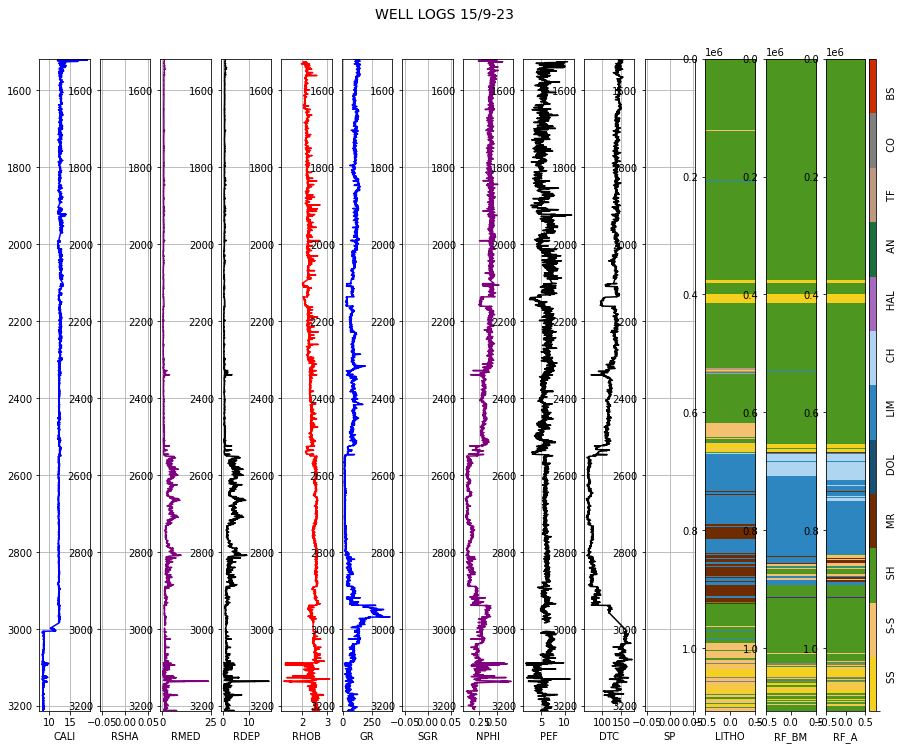

In [ ]:
#Plotting predictions - HIDDEN DATASET
for i in range(1):
  pred_log(hidden_rf_res, i, facies_colors, 2)

### **H. XGBOOSTING CLASSIFIER (Boosting Method)**

#### H1. Base Model with non-argumented data

In [ ]:
# Create the classifier - DONE WITH

model_xgb = XGBClassifier(#############)

model_xgb.fit(x_train, y_train.values.ravel(), early_stopping_rounds=100, eval_set=[(x_test, y_test)], verbose=100)

train_pred_xgb = model_xgb.predict(x_train)
open_pred_xgb = model_xgb.predict(x_test)
hidden_pred_xgb = model_xgb.predict(x_hidden)

[0]	validation_0-mlogloss:2.22584
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.6847


In [ ]:
#Printing Reports 

print('-----------------------TRAIN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_train, train_pred_xgb)))
print('Open set penalty matrix score:', score(y_train.values, train_pred_xgb))
print('Open set report:', metrics.classification_report(y_train, train_pred_xgb))
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_xgb)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_xgb))
print('Open set report:', metrics.classification_report(y_test, open_pred_xgb))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_xgb)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_xgb))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_xgb))

-----------------------TRAIN SET REPORT---------------------
Open set RMSE: 0.8335256060842033
Open set penalty matrix score: -0.2777457879507326


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.87      0.86      0.87    168937
           1       0.82      0.69      0.75    150455
           2       0.92      0.97      0.94    720803
           3       0.86      0.75      0.80     33329
           4       0.79      0.10      0.18      1688
           5       0.86      0.68      0.76     56320
           6       0.92      0.89      0.91     10513
           7       0.99      0.99      0.99      8213
           8       0.93      0.87      0.90      1085
           9       0.84      0.87      0.86     15245
          10       0.87      0.47      0.61      3820
          11       0.00      0.00      0.00       103

    accuracy                           0.89   1170511
   macro avg       0.81      0.68      0.71   1170511
weighted avg       0.89      0.89      0.89   1170511

-----------------------OPEN SET REPORT---------------------
Open set RMSE: 1.0624051449426641
Open set penalty matri

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.79      0.84      0.81     24048
           1       0.65      0.28      0.39     17558
           2       0.84      0.95      0.89     83975
           3       0.73      0.14      0.23      3306
           4       0.00      0.00      0.00       416
           5       0.48      0.56      0.52      4798
           6       0.00      0.00      0.00       625
           8       0.97      0.28      0.43       125
           9       0.75      0.62      0.68      1245
          10       0.83      0.45      0.58       690

    accuracy                           0.80    136786
   macro avg       0.60      0.41      0.45    136786
weighted avg       0.78      0.80      0.77    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 1.0801253407517626
Hidden set penalty matrix score: -0.4885567048211966
Hidden set report:               precision    recall  f1-score   support


In [ ]:
train_xgb_res = labeled_data.copy()
test_xgb_res = test_data.copy()
hidden_xgb_res = hidden_data.copy()

In [ ]:
#Appending predictions to a copy of the original datasets

train_xgb_res['XGB_BM'] = train_pred_xgb
test_xgb_res['XGB_BM'] = open_pred_xgb
hidden_xgb_res['XGB_BM'] = hidden_pred_xgb

In [ ]:
#Plotting predictions
#for i in range(10):
#  pred_log(hidden_xgb_res, i, facies_colors)
#train_xgb_res

This model has also been tested with the dataset by using just the highest confidence data which decreased the accyracy for the class 9 since it is the one with the most uncertanty (decrease the number of samples for this class). In addition, there was a light decrement on the acc for the other classes. The same occurred with the random forest classifier.

#### H2. Model with non-argumented data and with Kfold Validation

In [ ]:
# Create the classifier - DONE WITHOUT ARGUMENATTION 
import xgboost
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold

split = 10
kf = StratifiedKFold(n_splits=split, shuffle=True)

train_prob_xgb1 = np.zeros((len(x_train), 12))
open_prob_xgb1 = np.zeros((len(x_test), 12))
hidden_prob_xgb1 = np.zeros((len(x_hidden), 12))

xgbmodel_noarg = XGBClassifier(########)
i = 1

for (train_index, test_index) in kf.split(x_train, y_train):
  X_train, X_test = x_train.iloc[train_index], x_train.iloc[test_index]
  Y_train, Y_test = y_train.iloc[train_index], y_train.iloc[test_index]

  xgbmodel_noarg.fit(X_train, Y_train.values.ravel(), early_stopping_rounds=100, eval_set=[(X_test, Y_test)], verbose=100)    #APPARENTLY I SHOULD INCLUDE THE VAL DATTA INTO THE TRAIN DATA // ERASE SPLITT
  prediction = xgbmodel_noarg.predict(X_test)
  print('Fold accuracy:', accuracy_score(Y_test, prediction))

  print(f'-----------------------FOLD {i}---------------------')
  i+=1

  train_prob_xgb1 += xgbmodel_noarg.predict_proba(x_train)
  open_prob_xgb1 += xgbmodel_noarg.predict_proba(x_test)
  hidden_prob_xgb1 += xgbmodel_noarg.predict_proba(x_hidden)

train_prob_xgb1 = pd.DataFrame(train_prob_xgb1/split)
train_pred_xgb1 = np.array(pd.DataFrame(train_prob_xgb1).idxmax(axis=1))

open_prob_xgb1 = pd.DataFrame(open_prob_xgb1/split)
open_pred_xgb1 = np.array(pd.DataFrame(open_prob_xgb1).idxmax(axis=1))

hidden_prob_xgb1 = pd.DataFrame(hidden_prob_xgb1/split)
hidden_pred_xgb1 = np.array(pd.DataFrame(hidden_prob_xgb1).idxmax(axis=1))

[0]	validation_0-mlogloss:2.16809
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.333196
Fold accuracy: 0.8924580528312203
-----------------------FOLD 1---------------------
[0]	validation_0-mlogloss:2.16626
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.337192
Fold accuracy: 0.8909278861351035
-----------------------FOLD 2---------------------
[0]	validation_0-mlogloss:2.16895
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.335925
Fold accuracy: 0.8913550503626624
-----------------------FOLD 3---------------------
[0]	validation_0-mlogloss:2.16651
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.334729
Fold accuracy: 0.8924742206388668
-----------------------FOLD 4---------------------
[0]	validation_0-mlogloss:2.16923
Will train until validation_0-mlogloss hasn't improved in 100 roun

In [ ]:
#Printing Reports 

print('-----------------------TRAIN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_train, train_pred_xgb1)))
print('Open set penalty matrix score:', score(y_train.values, train_pred_xgb1))
print('Open set report:', metrics.classification_report(y_train, train_pred_xgb1))
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_xgb1)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_xgb1))
print('Open set report:', metrics.classification_report(y_test, open_pred_xgb1))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_xgb1)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_xgb1))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_xgb1))

-----------------------TRAIN SET REPORT---------------------
Open set RMSE: 0.8392732214350133
Open set penalty matrix score: -0.28091694567586295
Open set report:               precision    recall  f1-score   support

           0       0.87      0.86      0.86    168937
           1       0.82      0.69      0.75    150455
           2       0.92      0.97      0.94    720803
           3       0.85      0.75      0.80     33329
           4       0.80      0.09      0.15      1688
           5       0.86      0.67      0.76     56320
           6       0.91      0.89      0.90     10513
           7       0.99      0.99      0.99      8213
           8       0.93      0.87      0.90      1085
           9       0.84      0.87      0.85     15245
          10       0.87      0.45      0.60      3820
          11       1.00      0.02      0.04       103

    accuracy                           0.89   1170511
   macro avg       0.89      0.68      0.71   1170511
weighted avg       0.89 

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.78      0.85      0.81     24048
           1       0.66      0.27      0.38     17558
           2       0.84      0.95      0.89     83975
           3       0.74      0.14      0.23      3306
           4       0.00      0.00      0.00       416
           5       0.48      0.57      0.52      4798
           6       0.00      0.00      0.00       625
           8       0.97      0.28      0.43       125
           9       0.75      0.63      0.68      1245
          10       0.85      0.45      0.59       690

    accuracy                           0.80    136786
   macro avg       0.61      0.41      0.45    136786
weighted avg       0.78      0.80      0.77    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 1.046966082181273
Hidden set penalty matrix score: -0.4766783499595578
Hidden set report:               precision    recall  f1-score   support



In [ ]:
#Appending predictions to a copy of the original datasets

train_xgb_res['XGB_KF'] = train_pred_xgb1
test_xgb_res['XGB_KF'] = open_pred_xgb1
hidden_xgb_res['XGB_KF'] = hidden_pred_xgb1

In [ ]:
#Plotting predictions
#for i in range(10):
#  pred_log(hidden_xgb_res, i, facies_colors)
#train_xgb_res

#### H3. Model with argumented data and with Kfold Validation

In [ ]:
# Create the classifier - DONE WITH ARGUMENTATION (Check with the model above and see if the argumentation has that huge impact!!!!!!!!) ----> IT HASSS!!!!
import xgboost
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold

split = 10
kf = StratifiedKFold(n_splits=split, shuffle=True)

train_prob_xgb2 = np.zeros((len(x_train), 12))
open_prob_xgb2 = np.zeros((len(x_test_arg), 12))
hidden_prob_xgb2 = np.zeros((len(x_hidden_arg), 12))

xgbmodel_arg = XGBClassifier(#########)
i = 1

for (train_index, test_index) in kf.split(pd.DataFrame(x_train_arg), y_train):
  Xx_train, Xx_test = pd.DataFrame(x_train_arg).iloc[train_index], pd.DataFrame(x_train_arg).iloc[test_index]
  Yy_train, Yy_test = y_train.iloc[train_index], y_train.iloc[test_index]

  xgbmodel_arg.fit(Xx_train, Yy_train.values.ravel(), early_stopping_rounds=100, eval_set=[(Xx_test, Yy_test)], verbose=100)
  prediction = xgbmodel_arg.predict(Xx_test)
  print('Fold accuracy:', accuracy_score(Yy_test, prediction))

  print(f'-----------------------FOLD {i}---------------------')
  i+=1

  train_prob_xgb2 += xgbmodel_arg.predict_proba(pd.DataFrame(x_train_arg))
  open_prob_xgb2 += xgbmodel_arg.predict_proba(pd.DataFrame(x_test_arg))
  hidden_prob_xgb2 += xgbmodel_arg.predict_proba(pd.DataFrame(x_hidden_arg))

train_prob_xgb2 = pd.DataFrame(train_prob_xgb2/split)
train_pred_xgb2 = np.array(pd.DataFrame(train_prob_xgb2).idxmax(axis=1))

open_prob_xgb2 = pd.DataFrame(open_prob_xgb2/split)
open_pred_xgb2 = np.array(pd.DataFrame(open_prob_xgb2).idxmax(axis=1))

hidden_prob_xgb2 = pd.DataFrame(hidden_prob_xgb2/split)
hidden_pred_xgb2 = np.array(pd.DataFrame(hidden_prob_xgb2).idxmax(axis=1))

[0]	validation_0-mlogloss:2.16023
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.326464
Fold accuracy: 0.8916037316748112
-----------------------FOLD 1---------------------
[0]	validation_0-mlogloss:2.15985
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.322497
Fold accuracy: 0.8930209908501422
-----------------------FOLD 2---------------------
[0]	validation_0-mlogloss:2.16055
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.32509
Fold accuracy: 0.8917394981674654
-----------------------FOLD 3---------------------
[0]	validation_0-mlogloss:2.15928
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[99]	validation_0-mlogloss:0.322256
Fold accuracy: 0.89358484763052
-----------------------FOLD 4---------------------
[0]	validation_0-mlogloss:2.16029
Will train until validation_0-mlogloss hasn't improved in 100 rounds.

In [ ]:
#Printing Reports 

print('-----------------------HIDDEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_train, train_pred_xgb2)))
print('Open set penalty matrix score:', score(y_train.values, train_pred_xgb2))
print('Open set report:', metrics.classification_report(y_train, train_pred_xgb2))
print('-----------------------OPEN SET REPORT---------------------')
print("Open set RMSE:", np.sqrt(mean_squared_error(y_test, open_pred_xgb2)))
print('Open set penalty matrix score:', score(y_test.values, open_pred_xgb2))
print('Open set report:', metrics.classification_report(y_test, open_pred_xgb2))
print('-----------------------HIDDEN SET REPORT---------------------')
print("Hidden set RMSE:", np.sqrt(mean_squared_error(y_hidden, hidden_pred_xgb2)))
print('Hidden set penalty matrix score:', score(y_hidden.values, hidden_pred_xgb2))
print('Hidden set report:', metrics.classification_report(y_hidden, hidden_pred_xgb2))

-----------------------HIDDEN SET REPORT---------------------
Open set RMSE: 0.8240047295115361
Open set penalty matrix score: -0.2733257098822651
Open set report:               precision    recall  f1-score   support

           0       0.87      0.87      0.87    168937
           1       0.82      0.69      0.75    150455
           2       0.92      0.97      0.94    720803
           3       0.86      0.75      0.80     33329
           4       0.80      0.09      0.16      1688
           5       0.86      0.70      0.77     56320
           6       0.92      0.90      0.91     10513
           7       0.99      0.99      0.99      8213
           8       0.94      0.87      0.91      1085
           9       0.85      0.87      0.86     15245
          10       0.87      0.49      0.63      3820
          11       1.00      0.18      0.31       103

    accuracy                           0.90   1170511
   macro avg       0.89      0.70      0.74   1170511
weighted avg       0.89 

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Open set report:               precision    recall  f1-score   support

           0       0.79      0.84      0.81     24048
           1       0.64      0.32      0.42     17558
           2       0.84      0.95      0.89     83975
           3       0.73      0.13      0.23      3306
           4       0.00      0.00      0.00       416
           5       0.48      0.58      0.53      4798
           6       0.00      0.00      0.00       625
           8       1.00      0.10      0.19       125
           9       0.75      0.63      0.69      1245
          10       0.84      0.48      0.61       690

    accuracy                           0.80    136786
   macro avg       0.61      0.40      0.44    136786
weighted avg       0.78      0.80      0.78    136786

-----------------------HIDDEN SET REPORT---------------------
Hidden set RMSE: 1.724226450764995
Hidden set penalty matrix score: -0.6473555315898265
Hidden set report:               precision    recall  f1-score   support



In [ ]:
#Appending predictions to files
train_xgb_res['XGB_AKF'] = train_pred_xgb2
test_xgb_res['XGB_AKF'] = open_pred_xgb2
hidden_xgb_res['XGB_AKF'] = hidden_pred_xgb2

In [ ]:
#Saving results 3 methods
train_xgb_res.to_csv('/content/drive/MyDrive/Results_folder/train_xgb_res.csv', index=False)
test_xgb_res.to_csv('/content/drive/MyDrive/Results_folder/test_xgb_res.csv', index=False)
hidden_xgb_res.to_csv('/content/drive/MyDrive/Results_folder/hidden_xgb_res.csv', index=False)

#### H4. Ploting Prediction results

In [ ]:
#Importing results csv files
train_xgb_res = pd.read_csv('/content/drive/MyDrive/Results_folder/XGB/train_xgb_res.csv')
test_xgb_res = pd.read_csv('/content/drive/MyDrive/Results_folder/XGB/test_xgb_res.csv')
hidden_xgb_res = pd.read_csv('/content/drive/MyDrive/Results_folder/XGB/hidden_xgb_res.csv')

In [ ]:
#metrics_report2(hidden_xgb_res.LITHO, hidden_xgb_res.XGB_BM)
#default_confusion_matrix(hidden_xgb_res.LITHO, hidden_xgb_res.XGB_BM)

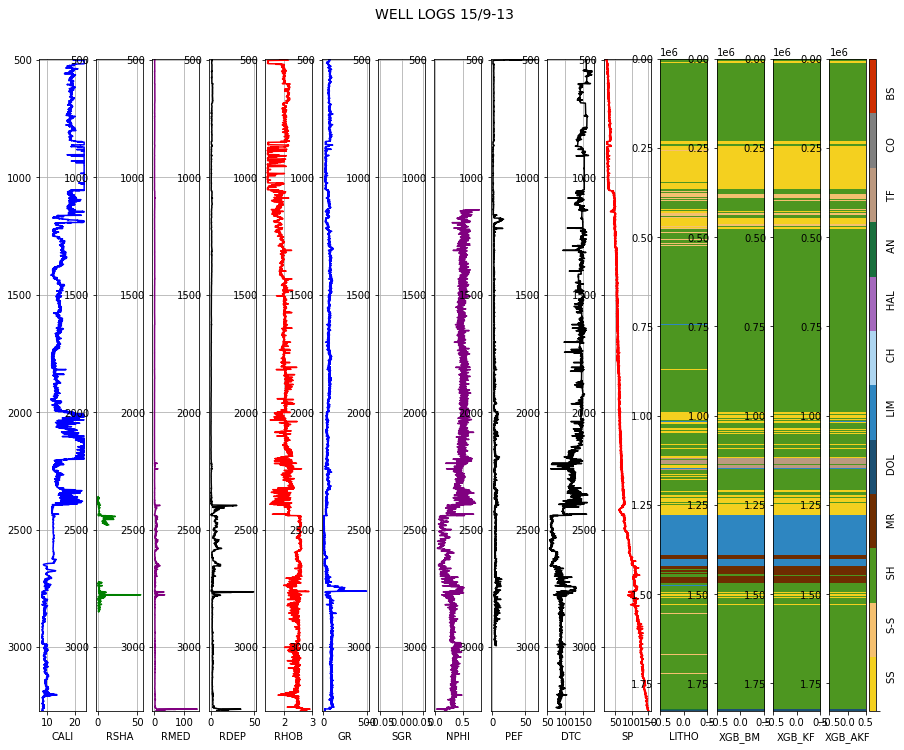

In [ ]:
#Plotting predictions - HIDDEN DATASET
for i in range(1):
  pred_log(train_xgb_res, i, facies_colors, 3)

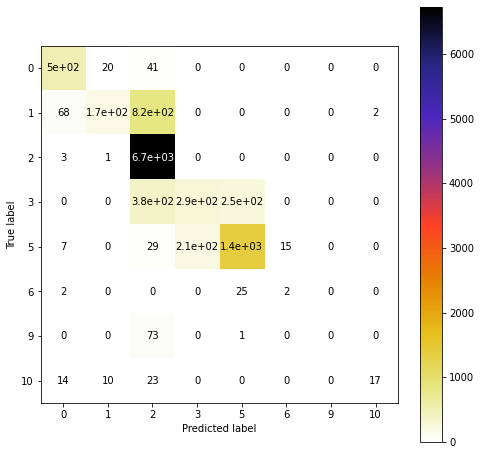

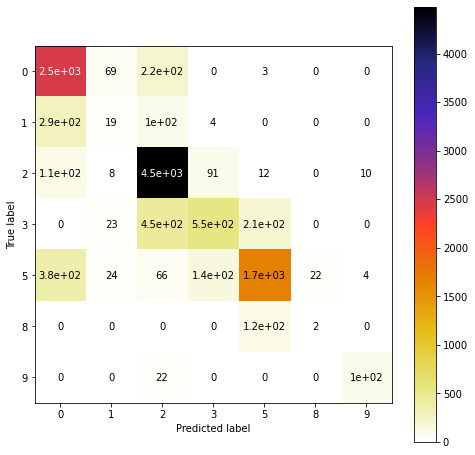

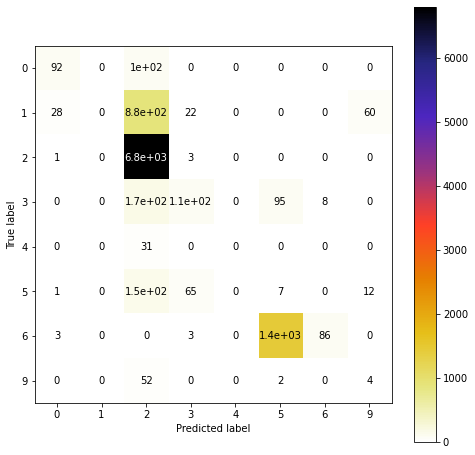

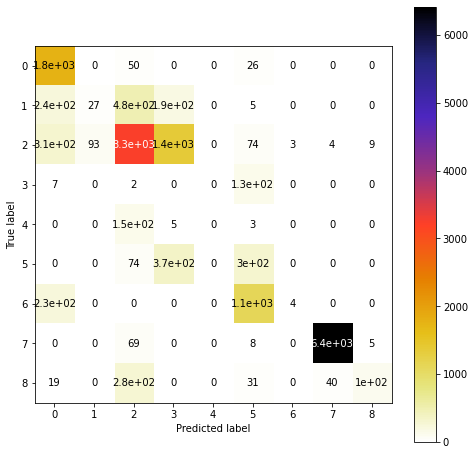

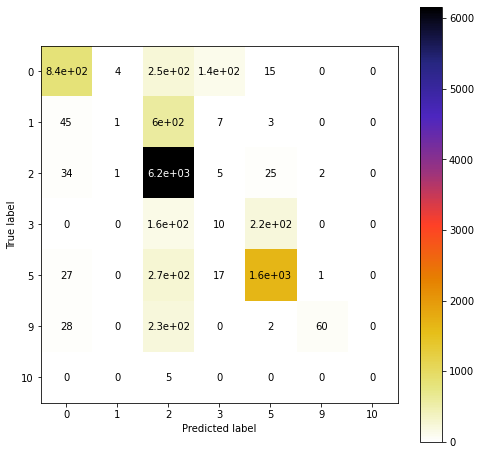

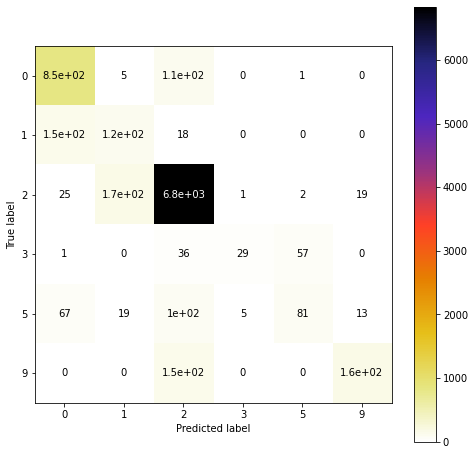

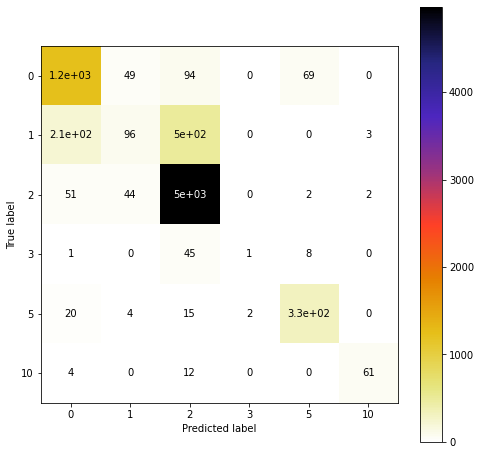

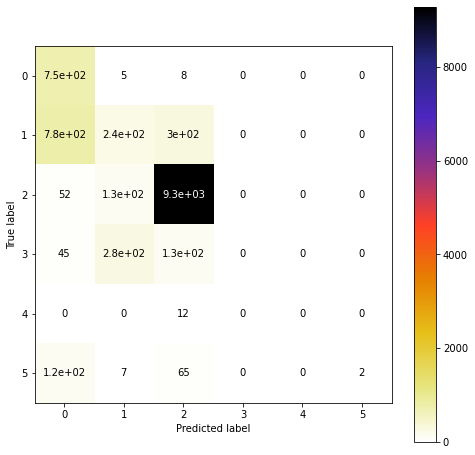

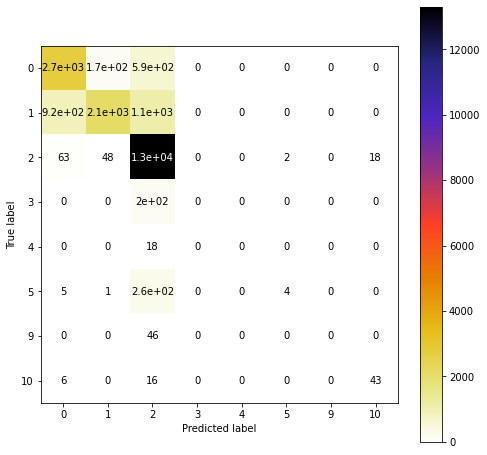

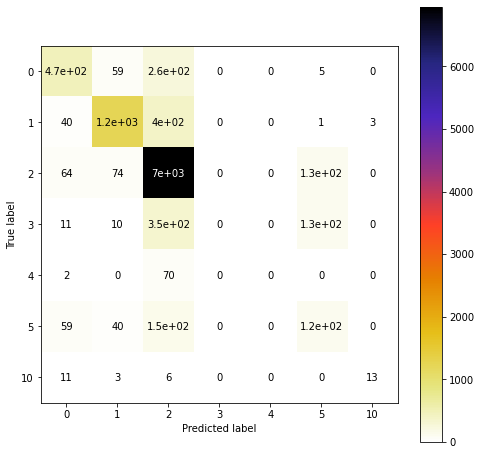

In [ ]:
#Displaying confusion matrixes for each well - HIDDEN SET
for i in range(10):
  well = hidden_xgb_res[hidden_xgb_res.WELL == hidden_xgb_res.WELL.unique()[i]]
  my_confusion_matrix(well.LITHO, well.XGB_BM)

## **11. HYPERPARAMETER TUNING FOR THE BEST METHODST**

#### Grid Search Method



In [ ]:
from sklearn import model_selection

#Grid Search method
def do_grid_search(model):
    param_grid = {'n_estimators': [100, 150],
           'max_depth': [20, 25],
           #'criterion': ['gini', 'entropy']
             }

    grid = model_selection.GridSearchCV(estimator=model, param_grid=param_grid, scoring='f1_weighted', verbose=10, n_jobs=1, cv=5)
    grid_result = grid.fit(x_train_final, y_train_final)
    print(grid_result)
    print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
    
    #means = grid_result.cv_results_['mean_test_score']
    #stds = grid_result.cv_results_['std_test_score']
    #params = grid_result.cv_results_['params']
    #for mean, stdev, param in zip(means, stds, params):
    #    print("%f (%f) with: %r" % (mean, stdev, param))

    #print("Traininig")
    #means = grid_result.cv_results_['mean_train_score']
    #stds = grid_result.cv_results_['std_train_score']
    #for mean, stdev, param in zip(means, stds, params):
    #    print("%f (%f) with: %r" % (mean, stdev, param))    


In [ ]:
#do_grid_search(model4)

#### Randomized Search Method

In [ ]:
#Randomized Search method

def do_randomized_search(model):
    param_grid = {'n_estimators': np.arange(100, 500, 50),
           'max_depth': np.arange(5, 125, 25),
           'criterion': ['gini','entropy']
             }

    rs_model = model_selection.RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=10, scoring='f1_weighted', verbose=10, n_jobs=1, cv=10)
    grid_result = rs_model.fit(x_train_final, y_train_final)
    print(grid_result)
    print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
    
    #means = grid_result.cv_results_['mean_test_score']
    #stds = grid_result.cv_results_['std_test_score']
    #params = grid_result.cv_results_['params']
    #for mean, stdev, param in zip(means, stds, params):
    #    print("%f (%f) with: %r" % (mean, stdev, param))

    #print("Traininig")
    #means = grid_result.cv_results_['mean_train_score']
    #stds = grid_result.cv_results_['std_train_score']
    #for mean, stdev, param in zip(means, stds, params):
    #    print("%f (%f) with: %r" % (mean, stdev, param))

In [ ]:
#sorted(sklearn.metrics.SCORERS.keys()) 

In [ ]:
do_randomized_search(model4)

In [ ]:
do_randomized_search(model4)

## **12. PREDICTION SECOND STAGE**

In [ ]:
df_prob = pd.read_csv('/content/drive/MyDrive/prob_preddictions.csv')

Text(114.0, 0.5, 'True Label')

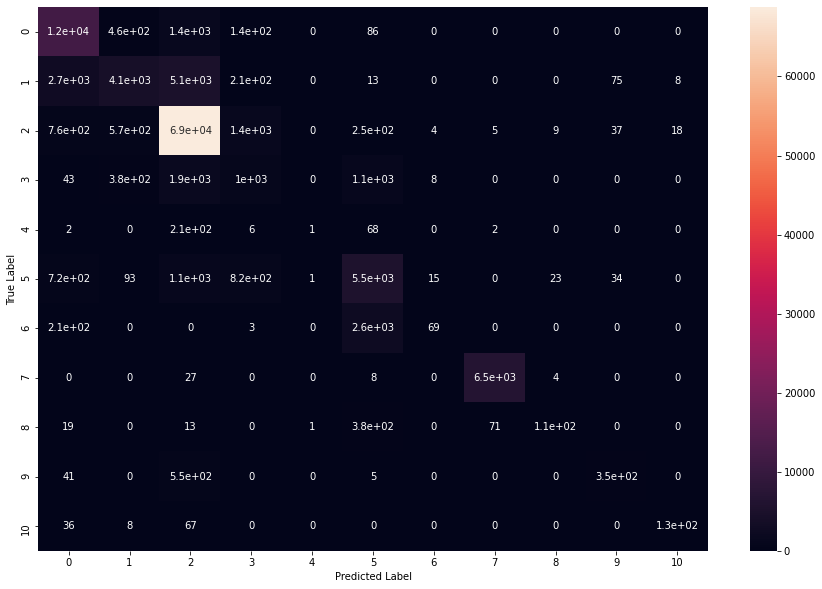

In [ ]:
## Initial Confusion Matrix 
#accuracy_confusion_matrix(xgbmodel_noarg, x_hidden, y_hidden)

cm = confusion_matrix(df_prob.Label, df_prob.Prediction)
plt.figure(figsize=(15,10))
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

In [ ]:
#Filtering an vizualizing
df_lim = df_prob[(df_prob.Label == 0) & (df_prob.Prediction == 1)]
#df_lim

In [ ]:
#Checking data with ambiguity of 5%
probs = df_prob.values

ny = probs.shape[0]
nx = probs.shape[1]

counter = 0
target_predictions = []
target_iy = []
for iy in range(0, ny):
  l = probs[iy][3:].tolist()
  list_max = max(l)
  pred_ix = np.argmax(l)
  for ix in range(3, nx):
    diff = np.abs(list_max-probs[iy][ix])
    if diff < 0.05 and diff != 0 and probs[iy][1]!=probs[iy][2]:
      target_predictions.append(pred_ix)
      target_iy.append(iy)
      counter += 1
      #print('Uncertainity in {} between predicted {} and closest {} while real is {}'.format(iy, pred_ix, ix-3, probs[iy][1]))
print('Number of instances to be checked {}'.format(counter))

Number of instances to be checked 3790


In [ ]:
#Counting target prediction 

np.unique(target_predictions, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 array([ 538,  499,  996,  288,    3, 1324,   12,   80,    6,   41,    3]))

In [ ]:
#Correcting probs function
new_probs = probs.copy()

N_neig = 3

new_preds = []
for iy_ch in target_iy:
  if iy_ch <= N_neig:     #Correcting initiasl value
    new_preds.append(probs[iy_ch][2])
  if iy_ch > N_neig and iy_ch < ny-N_neig:   #Avoiding the fist
    stacked_pred = np.zeros(nx-3)
    for i in range(iy_ch-N_neig, iy_ch+N_neig+1):     #Looping throught row
      stacked_pred += probs[i][3:]
      new_pred = np.argmax(stacked_pred)
      new_probs[iy_ch][2] = new_pred
    new_preds.append(new_pred)

In [ ]:
df_prob2 = pd.DataFrame(new_probs, columns=df_prob.columns)
#df_prob2

In [ ]:
def counting_wrong(data):
  predictions = data.Prediction
  true_label = data.Label
  counter = 0
  for i in range(len(predictions)):
    if predictions[i] != true_label[i]:
      counter += 1
  return counter

In [ ]:
counting_wrong(df_prob), counting_wrong(df_prob2)

(23941, 23251)

In [ ]:
accuracy_score(df_prob2.Label, df_prob2.Prediction)

0.810036193697558

In [ ]:
accuracy_score(df_prob.Label, df_prob.Prediction)

0.8043988006241983

In [ ]:
score(df_prob.Label, df_prob.Prediction)

-0.47552125460591355

In [ ]:
score(df_prob2.Label, df_prob2.Prediction)

-0.4613246239695417

## **13. NEURAL NETWORK**

In [ ]:
#pip install scikit-optimize

In [ ]:
##Defining the model and adding the input layer to it
import numpy as np
import seaborn as sns
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as colors
import matplotlib as mpl
from tensorflow.keras import layers
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, Input
from tensorflow.keras.layers import Dense, Dropout, Activation
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.optimizers import Adagrad, Adam, SGD, Adamax
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping

# Imports for Scikit Optimizer
import skopt
from skopt import gp_minimize, forest_minimize
from skopt.space import Real, Categorical, Integer
from skopt.plots import plot_convergence
from skopt.plots import plot_objective, plot_evaluations
from skopt.plots import plot_objective
from skopt.utils import use_named_args
#from sklearn.model_selection import train_test_split
#from sklearn.compose import ColumnTransformer
#from sklearn.preprocessing import StandardScaler

### 12.1 DATA PREPARATION

Standarized data with no outlier removal

In [ ]:
#Converting labels into categorical labels and training data into tensors
x_train_nn = tf.convert_to_tensor(x_train_std)
#y_train_nn = tf.keras.utils.to_categorical(y_train, dtype='int64')
x_test_nn = tf.convert_to_tensor(x_test_std)
#y_test_nn = tf.keras.utils.to_categorical(y_test, dtype='int64')
x_hidden_nn = tf.convert_to_tensor(x_hidden_std)

Standarized data with outlier removal

In [ ]:
#Merging train data
train_data_drop = pd.concat((x_train, pd.DataFrame(y_train, columns=["LITHO"])), axis=1)

## Removing Outliers
#
#
#
#
#
#
#
#

#Converting labels into categorical labels and training data into tensors

x_train_nnor = tf.convert_to_tensor(x_train_or)
x_test_nnor = tf.convert_to_tensor(x_test_or)
x_hidden_nnor = tf.convert_to_tensor(x_hidden_or)

### 12.2 CLASSIFICATION BY USING NEURAL NETWORK

#### 12.2.1 Base Model

In [ ]:
## Neural Network Base Model 
def design_model(features, l_rate):
  model = Sequential(name="Litho_prediction")
  num_features = features.shape[1]
  model.add(layers.InputLayer(input_shape=(num_features, )))
#
#
#
#
#
  model.compile(loss='sparse_categorical_crossentropy', metrics=['accuracy'], optimizer=opt)    #sparse_categorical_crossentropy avoids the necessity of encoding the labels and save some time and memory compared with categorical_crossentropy
  return model

In [ ]:
#------------FIRST CLASSIFICATION USING NN---------------------
#Creating a model 
nn_model = design_model(x_train_scaled, 0.01)
nn_model.summary()

Model: "Litho_prediction"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 32)                736       
_________________________________________________________________
dense_5 (Dense)              (None, 12)                396       
Total params: 1,132
Trainable params: 1,132
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#Fitting the model 
#with tf.device('/CPU:0'):         #It can be with '/CPU:0'

early_stopping = EarlyStopping(#########
                               )

with tf.device('/GPU:0'):          #It can be with '/GPU:0'
  history = nn_model.fit(x_train_nn, 
                    y_train, 
########
                    validation_data = (x_test_nn, y_test), 
                    callbacks = [early_stopping] 
                    )

Epoch 1/100
18290/18290 [==============================] - 34s 2ms/step - loss: 0.6813 - accuracy: 0.7713 - val_loss: 0.9154 - val_accuracy: 0.7265
Epoch 2/100
18290/18290 [==============================] - 34s 2ms/step - loss: 0.6699 - accuracy: 0.7756 - val_loss: 0.8607 - val_accuracy: 0.7469
Epoch 3/100
18290/18290 [==============================] - 33s 2ms/step - loss: 0.6606 - accuracy: 0.7795 - val_loss: 0.8797 - val_accuracy: 0.7193
Epoch 4/100
18290/18290 [==============================] - 33s 2ms/step - loss: 0.6679 - accuracy: 0.7801 - val_loss: 0.8386 - val_accuracy: 0.7304
Epoch 5/100
18290/18290 [==============================] - 33s 2ms/step - loss: 0.6587 - accuracy: 0.7816 - val_loss: 0.9085 - val_accuracy: 0.7361
Epoch 6/100
18290/18290 [==============================] - 33s 2ms/step - loss: 0.6575 - accuracy: 0.7817 - val_loss: 0.8602 - val_accuracy: 0.7253
Epoch 7/100
18290/18290 [==============================] - 34s 2ms/step - loss: 0.6641 - accuracy: 0.7815 - val_

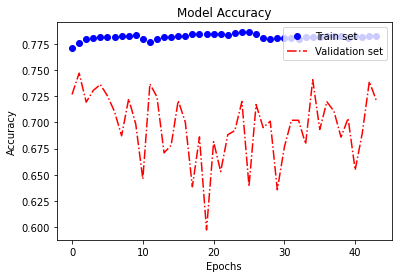

In [ ]:
## Base Model Visualization

from matplotlib import pyplot as plt
plt.plot(history.history['accuracy'], 'bo')
plt.plot(history.history['val_accuracy'], '-.r' )
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Train set', 'Validation set'], loc='upper right')
plt.show()

In [ ]:
#Predicting by using NN --- HIDDEN AS VALIDATION

nn_train_prob = nn_model.predict(x_train_nn)
train_nn1 = np.array(pd.DataFrame(nn_train_prob).idxmax(axis=1))

nn_open_prob = nn_model.predict(x_test_nn)
open_nn1 = np.array(pd.DataFrame(nn_open_prob).idxmax(axis=1))

nn_hidden_prob = nn_model.predict(x_hidden_nn)
hidden_nn1 = np.array(pd.DataFrame(nn_hidden_prob).idxmax(axis=1))

print("The training set accuracy is {} and the f1 score is {}".format(accuracy_score(y_train, train_nn1), f1_score(y_train, train_nn1, average="weighted")))
print("The open set accuracy is {} and the f1 score is {}".format(accuracy_score(y_test, open_nn1), f1_score(y_test, open_nn1, average="weighted")))
print("The hidden set accuracy is {} and the f1 score is {}". format(accuracy_score(y_hidden, hidden_nn1), f1_score(y_hidden, hidden_nn1, average="weighted")))

The training set accuracy is 0.7834022918195558 and the f1 score is 0.7629369597303808
The open set accuracy is 0.7304183176640884 and the f1 score is 0.7139276128165636
The hidden set accuracy is 0.7319705548338603 and the f1 score is 0.6930739474328512


In [ ]:
#Creating a copy of df to store results
train_nn_res = labeled_data.copy()
test_nn_res = test_data.copy()
hidden_nn_res = hidden_data.copy()

#Appending predictions to a copy of the original datasets
train_nn_res['NN_Base'] = train_nn1
test_nn_res['NN_Base'] = open_nn1
hidden_nn_res['NN_Base'] = hidden_nn1

#### 12.2.2 Bayesian Optimization

**TARGETS FOR BAYESIAN OPTIMIZATION:**

1. Learning rate?
2. Number of dense layers?
3. Number of nodes for each layer?
4. Which activation function to select (relu/sigmoid)?

##### 12.2.1 Model Design and Setting Initial Parameters

In [ ]:
#Defining the dimention of the learning rate, number of layers, and layer neurons

dim_learning_rate = ####
dim_num_dense_layers = ###
dim_num_dense_nodes = ####
dim_activation = ###

#Defining a list with all the parameters
dimensions = [dim_learning_rate,
              dim_num_dense_layers,
              dim_num_dense_nodes,
              dim_activation
              ]

defaut_parameters = [1e-3, 3, 64, 'relu']

In [ ]:
# This is a function to log traning progress so that can be viewed by TnesorBoard.
def log_dir_name(learning_rate, num_dense_layers,
                 num_dense_nodes, activation):

    # The dir-name for the TensorBoard log-dir.
    s = "./19_logs/lr_{0:.0e}_layers_{1}_nodes_{2}_{3}/"

    # Insert all the hyper-parameters in the dir-name.
    log_dir = s.format(learning_rate,
                       num_dense_layers,
                       num_dense_nodes,
                       activation)
    return log_dir

In [ ]:
#Hyper-parameter optimization
def create_model(learning_rate,
                  num_dense_layers,
                  num_dense_nodes,
                  activation
                 ):
  
  model = Sequential()
  num_features = x_train_nn.shape[1]
  model.add(layers.InputLayer(input_shape=(num_features, )))
  for i in range(num_dense_layers):
    name = 'layer_dense_{0}'.format(i+1)

    #add dense layer
    model.add(Dense(num_dense_nodes,
                    activation=activation,
                    name=name))
  #use softmax-activation for classification
  model.add(Dense(12, activation='softmax'))           #Output layer --> Check the number of neurons according to our problem!!!
  #adding an optimizer
  opt = Adam(learning_rate=learning_rate)
  #compiling the model
  model.compile(optimizer=opt,
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])                  #sparse_categorical_crossentropy avoids the necessity of encoding the labels and save some time and memory compared with categorical_crossentropy
  return model


In [ ]:
path_best_model = '19_best_model.h5'

In [ ]:
#Global variable to store accuracy
best_accuracy = 0

#Validation set
validation_data = (x_test_nn, y_test)

In [ ]:
@use_named_args(dimensions=dimensions)
def fitness(learning_rate, num_dense_layers,
            num_dense_nodes, activation):
    """
    Hyper-parameters:
    learning_rate:     Learning-rate for the optimizer.
    num_dense_layers:  Number of dense layers.
    num_dense_nodes:   Number of nodes in each dense layer.
    activation:        Activation function for all layers.
    """

    # Print the hyper-parameters.
    print('learning rate: {0:.1e}'.format(learning_rate))
    print('num_dense_layers:', num_dense_layers)
    print('num_dense_nodes:', num_dense_nodes)
    print('activation:', activation)
    print()
    
    # Create the neural network with these hyper-parameters.
    model = create_model(learning_rate=learning_rate,
                         num_dense_layers=num_dense_layers,
                         num_dense_nodes=num_dense_nodes,
                         activation=activation)

    # Dir-name for the TensorBoard log-files.
#########
    
    # Create a callback-function for Keras which will be
    # run after each epoch has ended during training.
    # This saves the log-files for TensorBoard.
    # Note that there are complications when histogram_freq=1.
    # It might give strange errors and it also does not properly
    # support Keras data-generators for the validation-set.
    callback_log = TensorBoard(
        #
        #
        #
        #
        #)
   
    # Use Keras to train the model.
    history = model.fit(x= x_train_nn,
                        y= y_train,
                        #
                        #
                        #
                        #)

    # Get the classification accuracy on the validation-set
    # after the last training-epoch.
    accuracy = history.history['val_accuracy'][-1]

    # Print the classification accuracy.
    print()
    print("Accuracy: {0:.2%}".format(accuracy))
    print()

    # Save the model if it improves on the best-found performance.
    # We use the global keyword so we update the variable outside
    # of this function.
    global best_accuracy

    # If the classification accuracy of the saved model is improved ...
    if accuracy > best_accuracy:
        # Save the new model to harddisk.
        model.save(path_best_model)
        
        # Update the classification accuracy.
        best_accuracy = accuracy

    # Delete the Keras model with these hyper-parameters from memory.
    del model
    
    # Clear the Keras session, otherwise it will keep adding new
    # models to the same TensorFlow graph each time we create
    # a model with a different set of hyper-parameters.
    K.clear_session()
    
    # NOTE: Scikit-optimize does minimization so it tries to
    # find a set of hyper-parameters with the LOWEST fitness-value.
    # Because we are interested in the HIGHEST classification
    # accuracy, we need to negate this number so it can be minimized.
    return -accuracy
# This function exactly comes from :Hvass-Labs, TensorFlow-Tutorials

##### 12.2.2 Testing Model With  Initial Parameter 

In [ ]:
## Test with dafault parameters
fitness(x= defaut_parameters)

learning rate: 1.0e-03
num_dense_layers: 3
num_dense_nodes: 64
activation: relu

Epoch 1/3
9145/9145 [==============================] - 20s 2ms/step - loss: 0.7344 - accuracy: 0.7583 - val_loss: 0.8177 - val_accuracy: 0.7478
Epoch 2/3
9145/9145 [==============================] - 19s 2ms/step - loss: 0.4641 - accuracy: 0.8435 - val_loss: 0.9486 - val_accuracy: 0.7635
Epoch 3/3
9145/9145 [==============================] - 19s 2ms/step - loss: 0.4176 - accuracy: 0.8588 - val_loss: 1.0213 - val_accuracy: 0.7200

Accuracy: 72.00%



-0.7200224995613098

##### 12.2.3 Bayesian Optimization

In [ ]:
## Optimization
%%time
search_result = gp_minimize(#
                            #
                            #
                            #
                            #)

# you may examine other kind of minimization
# search_result = forest_minimize(func=fitness,
#                             dimensions=dimensions,
#                             base_estimator='RF', 
#                             n_calls=50,
#                             random_state=4)

learning rate: 1.0e-03
num_dense_layers: 3
num_dense_nodes: 64
activation: relu

Epoch 1/3
9145/9145 [==============================] - 20s 2ms/step - loss: 0.7504 - accuracy: 0.7563 - val_loss: 0.8913 - val_accuracy: 0.7526
Epoch 2/3
9145/9145 [==============================] - 19s 2ms/step - loss: 0.4730 - accuracy: 0.8392 - val_loss: 0.9347 - val_accuracy: 0.7521
Epoch 3/3
9145/9145 [==============================] - 19s 2ms/step - loss: 0.4200 - accuracy: 0.8572 - val_loss: 0.9740 - val_accuracy: 0.7390

Accuracy: 73.90%

learning rate: 5.4e-04
num_dense_layers: 7
num_dense_nodes: 111
activation: relu

Epoch 1/3
9145/9145 [==============================] - 23s 2ms/step - loss: 0.7056 - accuracy: 0.7622 - val_loss: 0.9004 - val_accuracy: 0.7519
Epoch 2/3
9145/9145 [==============================] - 23s 2ms/step - loss: 0.4067 - accuracy: 0.8598 - val_loss: 1.0087 - val_accuracy: 0.7450
Epoch 3/3
9145/9145 [==============================] - 22s 2ms/step - loss: 0.3522 - accuracy: 0.8

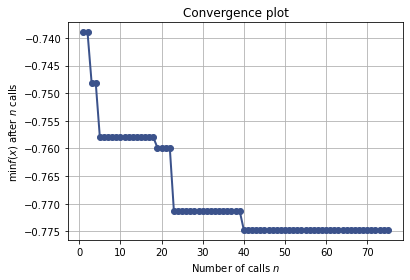

In [ ]:
#Progress Visualization 
plot_convergence(search_result) 
#plt.savefig("Converge.png", dpi=400) 

In [ ]:
#All hyper-parameters for each call 
sorted(zip(search_result.func_vals, search_result.x_iters)) 

[(-0.7747430205345154, [0.00011042176096394715, 1, 512, 'sigmoid']),
 (-0.772337794303894, [2.79429362564523e-05, 10, 200, 'relu']),
 (-0.7713362574577332, [0.00014904479808894552, 1, 512, 'sigmoid']),
 (-0.770912230014801, [3.1869275734824455e-05, 9, 286, 'relu']),
 (-0.7703931927680969, [0.00010671672713089212, 1, 512, 'sigmoid']),
 (-0.7703200578689575, [0.00010375826384291375, 1, 512, 'sigmoid']),
 (-0.7701957821846008, [0.00010760956754682652, 1, 512, 'sigmoid']),
 (-0.7692234516143799, [0.00010745434315502064, 1, 512, 'sigmoid']),
 (-0.7676662802696228, [0.00012085744888802056, 1, 512, 'sigmoid']),
 (-0.7663065195083618, [8.240880701126551e-05, 1, 455, 'sigmoid']),
 (-0.7660579085350037, [0.00010466251433972754, 1, 512, 'sigmoid']),
 (-0.765904426574707, [0.0001020663807617326, 1, 512, 'sigmoid']),
 (-0.7657143473625183, [3.513366770871015e-05, 6, 209, 'relu']),
 (-0.7656558156013489, [0.00010618360273639051, 1, 512, 'sigmoid']),
 (-0.764668881893158, [0.0004116438170258003, 1, 5

In [ ]:
#Optimal Hyperparameters and best fitness score
search_result.x, search_result.fun

([0.00011042176096394715, 1, 512, 'sigmoid'], -0.7747430205345154)

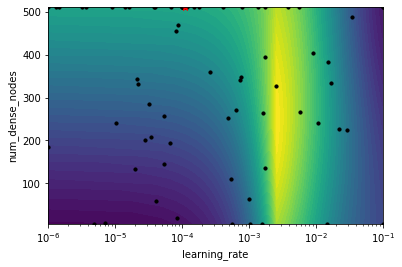

In [ ]:
#Plottign learning rate vs. number of neurons
from skopt.plots import plot_objective_2D
fig = plot_objective_2D(result=search_result,
                        dimension_identifier1='learning_rate',
                        dimension_identifier2='num_dense_nodes',
                        levels=50)
# plt.savefig("Lr_numnods.png", dpi=400)

ValueError: ignored

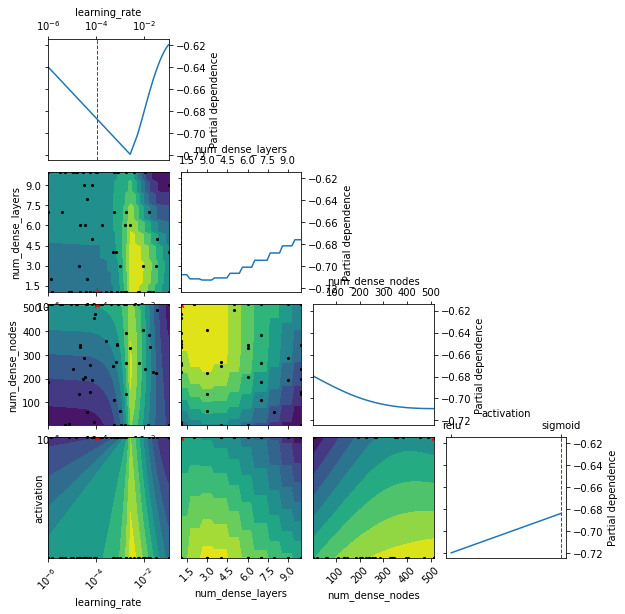

In [ ]:
# create a list for plotting
dim_names = ['learning_rate', 'num_dense_layers', 'num_dense_nodes', 'activation' ]

fig, ax = plot_objective(result=search_result, dimensions=dim_names)
plt.savefig("all_dimen.png", dpi=400)

ValueError: ignored

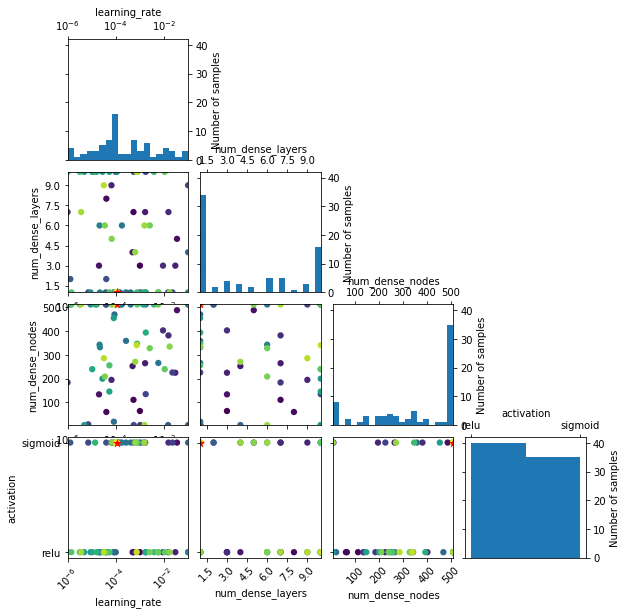

In [ ]:
#How the optimization ocurred
fig, ax = plot_evaluations(result=search_result, dimensions=dim_names)

##### 12.2.4 Testing Best Bayes-Optimized Hyperparameter 

In [ ]:
# Classification neural network
import numpy as np
import tensorflow.keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping

opt_model = Sequential()
opt_model.add(InputLayer(input_shape=(x_train_nn.shape[1])))
#
#
#

optimizer = Adam(lr=learning_rate)
    
opt_model.compile(optimizer=optimizer, 
                  loss='sparse_categorical_crossentropy',  
                  metrics=['accuracy']
                  )

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=20, 
                        verbose=1, mode='auto', restore_best_weights=True)

histories = opt_model.fit(#
                          #
                          #
                          #
                          #
                          )

Epoch 1/100
9145/9145 [==============================] - 18s 2ms/step - loss: 0.9716 - accuracy: 0.6758 - val_loss: 0.8425 - val_accuracy: 0.7453
Epoch 2/100
9145/9145 [==============================] - 17s 2ms/step - loss: 0.7114 - accuracy: 0.7574 - val_loss: 0.8061 - val_accuracy: 0.7624
Epoch 3/100
9145/9145 [==============================] - 17s 2ms/step - loss: 0.6502 - accuracy: 0.7781 - val_loss: 0.7836 - val_accuracy: 0.7694
Epoch 4/100
9145/9145 [==============================] - 17s 2ms/step - loss: 0.6121 - accuracy: 0.7935 - val_loss: 0.7609 - val_accuracy: 0.7673
Epoch 5/100
9145/9145 [==============================] - 18s 2ms/step - loss: 0.5790 - accuracy: 0.8055 - val_loss: 0.7471 - val_accuracy: 0.7713
Epoch 6/100
9145/9145 [==============================] - 17s 2ms/step - loss: 0.5541 - accuracy: 0.8154 - val_loss: 0.7729 - val_accuracy: 0.7683
Epoch 7/100
9145/9145 [==============================] - 17s 2ms/step - loss: 0.5345 - accuracy: 0.8232 - val_loss: 0.7591 -

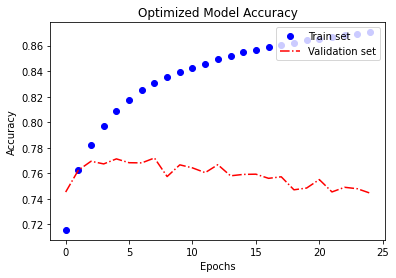

In [ ]:
## Base Model Visualization
plt.plot(histories.history['accuracy'], 'bo')
plt.plot(histories.history['val_accuracy'], '-.r' )
plt.title('Optimized Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Train set', 'Validation set'], loc='upper right')
plt.show()

In [ ]:
#Predicting With Optimized Model

nn_train_prob = opt_model.predict(x_train_nn)
train_nn2 = np.array(pd.DataFrame(nn_train_prob).idxmax(axis=1))

nn_open_prob = opt_model.predict(x_test_nn)
open_nn2 = np.array(pd.DataFrame(nn_open_prob).idxmax(axis=1))

nn_hidden_prob = opt_model.predict(x_hidden_nn)
hidden_nn2 = np.array(pd.DataFrame(nn_hidden_prob).idxmax(axis=1))

print("The training set accuracy is {} and the f1 score is {}".format(accuracy_score(y_train, train_nn2), f1_score(y_train, train_nn2, average="weighted")))
print("The open set accuracy is {} and the f1 score is {}".format(accuracy_score(y_test, open_nn2), f1_score(y_test, open_nn2, average="weighted")))
print("The hidden set accuracy is {} and the f1 score is {}". format(accuracy_score(y_hidden, hidden_nn2), f1_score(y_hidden, hidden_nn2, average="weighted")))

The training set accuracy is 0.8131670697669651 and the f1 score is 0.7986575871618143
The open set accuracy is 0.7712631409647186 and the f1 score is 0.7425661930004691
The hidden set accuracy is 0.7827397730336528 and the f1 score is 0.7731247040216316


In [ ]:
#Base Model Matrix Scores 
score(y_test.values, open_nn1), score(y_hidden.values, hidden_nn1)

(-0.7094073954936909, -0.7736382427673881)

In [ ]:
#Optimized Model Matrix Scores
score(y_test.values, open_nn2), score(y_hidden.values, hidden_nn2)

(-0.6020480897167839, -0.5612504799954248)

In [ ]:
#Appending optimized predictions
train_nn_res['NN_OPT'] = train_nn2
test_nn_res['NN_OPT'] = open_nn2
hidden_nn_res['NN_OPT'] = hidden_nn2

In [ ]:
#Saving results
train_nn_res.to_csv('/content/drive/MyDrive/Results_folder/NN/train_nn_RES.csv', index=False)
test_nn_res.to_csv('/content/drive/MyDrive/Results_folder/NN/test_nn_RES.csv', index=False)
hidden_nn_res.to_csv('/content/drive/MyDrive/Results_folder/NN/hidden_nn_RES.csv', index=False)


### 12.3 PLOTTING RESULTS

In [ ]:
#Importing results csv files
train_nn_res = pd.read_csv('/content/drive/MyDrive/Results_folder/NN/train_nn_RES.csv')
test_nn_res = pd.read_csv('/content/drive/MyDrive/Results_folder/NN/test_nn_RES.csv')
hidden_nn_res = pd.read_csv('/content/drive/MyDrive/Results_folder/NN/hidden_nn_RES.csv')

In [ ]:
#metrics_report2(hidden_nn_res.LITHO, hidden_nn_res.NN_Base)
#default_confusion_matrix(hidden_nn_res.LITHO, hidden_nn_res.NN_Base)


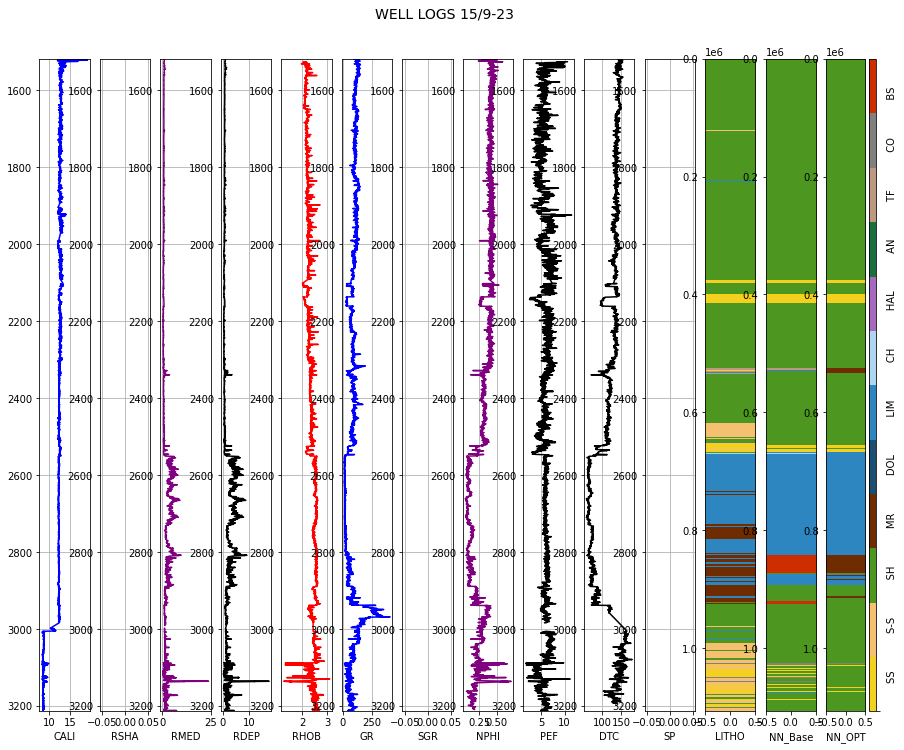

In [ ]:
#Plotting Base Model and Bayesian Optimized Model
for i in range(1):
  pred_log(hidden_nn_res, i, facies_colors, 2)

## **RESULTS COMPARITION**

In [ ]:
#Comparing Results

train_comparition = labeled_data.copy()
test_comparition = test_data.copy()
hidden_comparition = hidden_data.copy()

train_comparition = train_comparition.join([train_lr_res.LR_BM, train_gb_res.GB_BM, train_dt_res.DT_PRU_A, train_knn_res.KNN_NA, train_xgb_res.XGB_BM, train_rf_res.RF_BM, train_nn_res.NN_OPT])
test_comparition = test_comparition.join([test_lr_res.LR_BM, test_gb_res.GB_BM, test_dt_res.DT_PRU_A, test_knn_res.KNN_NA, test_xgb_res.XGB_BM, test_rf_res.RF_BM, test_nn_res.NN_OPT])
hidden_comparition = hidden_comparition.join([hidden_lr_res.LR_BM, hidden_gb_res.GB_BM, hidden_dt_res.DT_PRU_A, hidden_knn_res.KNN_NA, hidden_xgb_res.XGB_BM, hidden_rf_res.RF_BM, hidden_nn_res.NN_OPT])

In [ ]:
def final_accuracies(data):
  accuracies = []
  f1_scores = []
  precisions = []
  recalls = []
  matrix_scores = []
  model_names = ['LINEAR REGRESSION', 'GRADIENT BOOSTING', 'DECISION TREES', 'K-NEAREST NEIGHBOR', 'XGB', 'RANDOM FOREST', 'BAYESIAN OPT NEURAL NETWORK']
  for i in range(-7, 0):
    accuracy_i = accuracy_score(data.iloc[:, -8], data.iloc[:, i])
    f1_i = f1_score(data.iloc[:, -8], data.iloc[:, i], average='weighted')
    precision_i = precision_score(data.iloc[:, -8], data.iloc[:, i], average='weighted')
    recall_i = recall_score(data.iloc[:, -8], data.iloc[:, i], average='weighted')
    score_i = score(data.iloc[:, -8], data.iloc[:, i])

    accuracies.append(accuracy_i)
    f1_scores.append(f1_i)
    precisions.append(precision_i)
    recalls.append(recall_i)
    matrix_scores.append(score_i)

  df = pd.DataFrame({'MODEL':model_names, 
                     'ACCURACY %': np.around(np.array(accuracies)*100, 2), 
                     'F1 SCORE %':np.around(np.array(f1_scores)*100, 2), 
                     'PRECISION %':np.around(np.array(precisions)*100, 2), 
                     'RECALL %':np.around(np.array(recalls)*100, 2), 
                     'MATRIX SCORE':np.around(matrix_scores, 3)
                     }).sort_values('ACCURACY %', ascending=False)
  return df

#base_models = pd.DataFrame(np.around(f1_train_scores,3), model_names, columns=['F1_SCORES']).sort_values('F1_SCORES', ascending=False)

In [ ]:
final_accuracies(hidden_comparition)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



,MODEL,ACCURACY %,F1 SCORE %,PRECISION %,RECALL %,MATRIX SCORE
4,XGB,80.08,77.61,79.19,80.08,-0.489
5,RANDOM FOREST,80.03,77.35,77.38,80.03,-0.499
6,BAYESIAN OPT NEURAL NETWORK,78.27,77.31,77.38,78.27,-0.561
0,LINEAR REGRESSION,74.48,70.19,69.16,74.48,-0.694
2,DECISION TREES,71.70,67.89,65.55,71.70,-0.732
1,GRADIENT BOOSTING,67.80,61.75,67.62,67.80,-0.937
3,K-NEAREST NEIGHBOR,63.43,63.00,66.49,63.43,-1.026


In [ ]:
final_accuracies(train_comparition)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,MODEL,ACCURACY %,F1 SCORE %,PRECISION %,RECALL %,MATRIX SCORE
5,RANDOM FOREST,100.00,100.00,100.00,100.00,0.000
3,K-NEAREST NEIGHBOR,92.60,92.48,92.51,92.60,-0.198
4,XGB,89.49,89.11,89.19,89.49,-0.278
6,BAYESIAN OPT NEURAL NETWORK,81.32,79.87,80.12,81.32,-0.491
2,DECISION TREES,75.75,72.95,72.36,75.75,-0.653
1,GRADIENT BOOSTING,74.05,69.03,74.96,74.05,-0.723
0,LINEAR REGRESSION,72.28,66.29,65.56,72.28,-0.758


In [ ]:
final_accuracies(test_comparition)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



,MODEL,ACCURACY %,F1 SCORE %,PRECISION %,RECALL %,MATRIX SCORE
4,XGB,80.06,77.33,78.11,80.06,-0.519
5,RANDOM FOREST,78.54,75.46,76.08,78.54,-0.562
6,BAYESIAN OPT NEURAL NETWORK,77.13,74.26,73.89,77.13,-0.602
2,DECISION TREES,73.04,69.37,69.27,73.04,-0.730
1,GRADIENT BOOSTING,73.03,66.07,66.96,73.03,-0.741
0,LINEAR REGRESSION,70.25,65.51,63.42,70.25,-0.834
3,K-NEAREST NEIGHBOR,65.68,65.19,65.66,65.68,-0.920


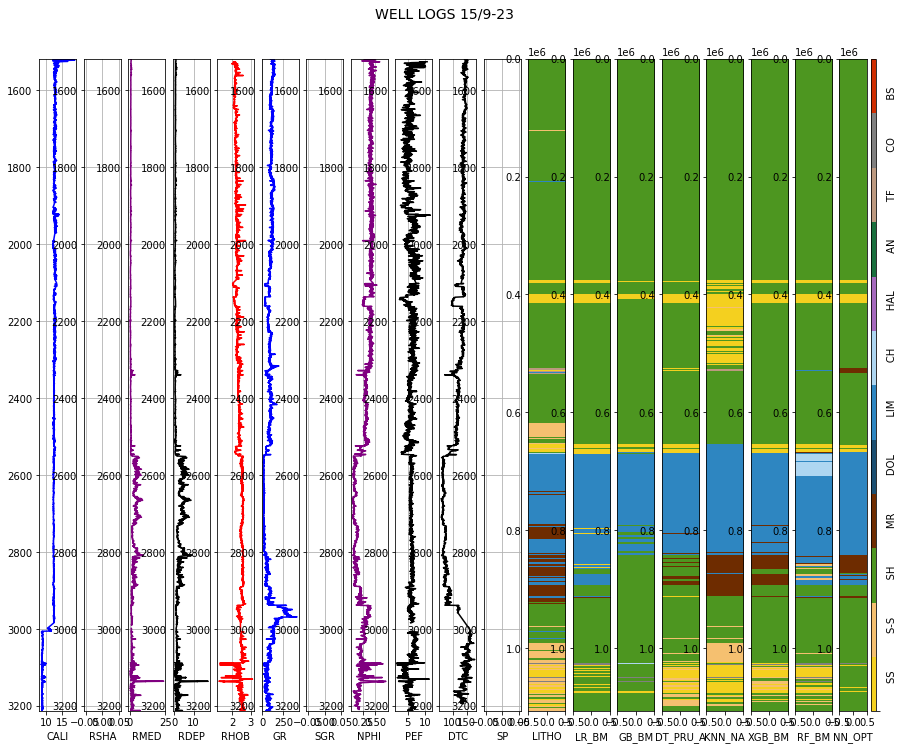

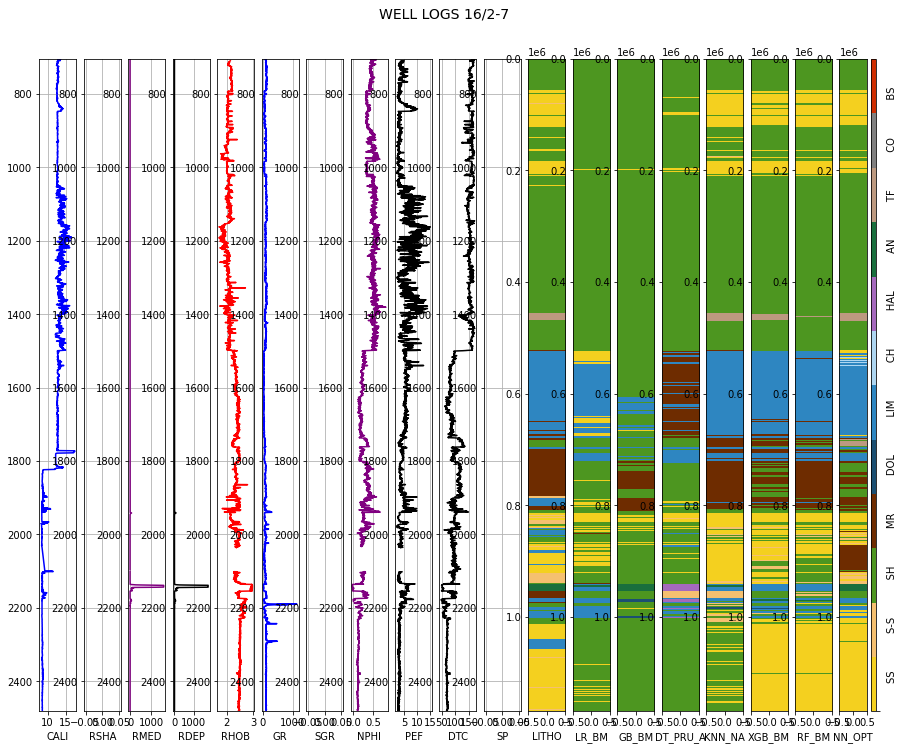

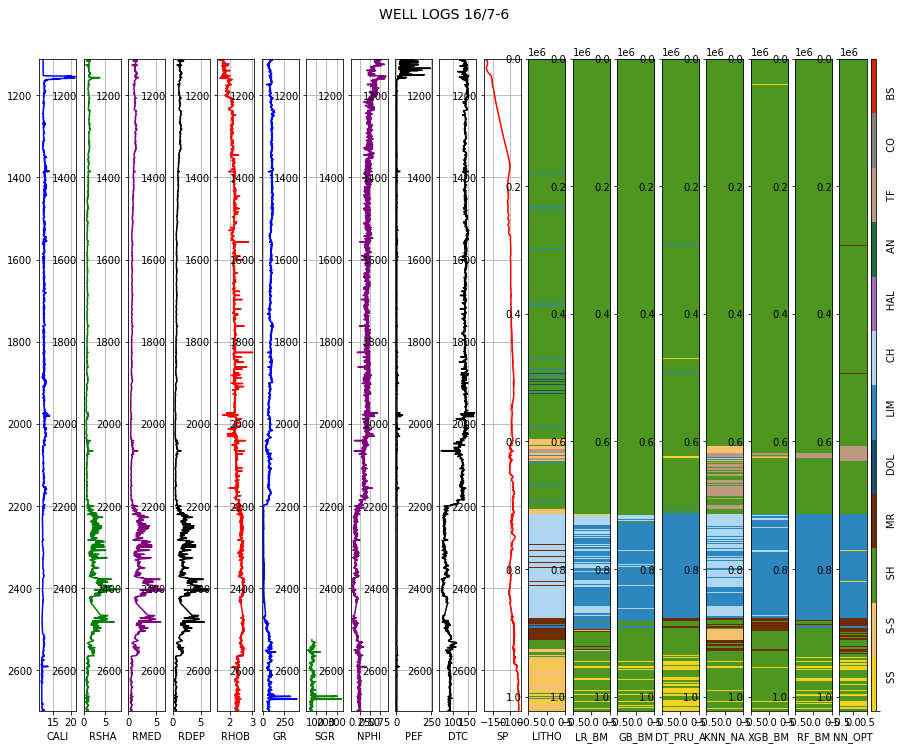

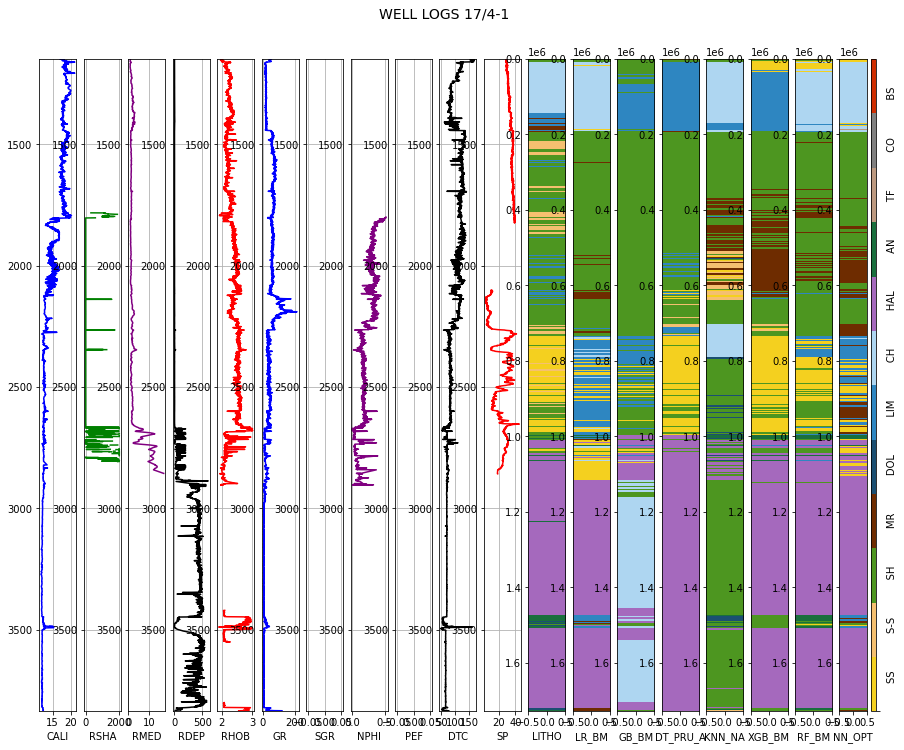

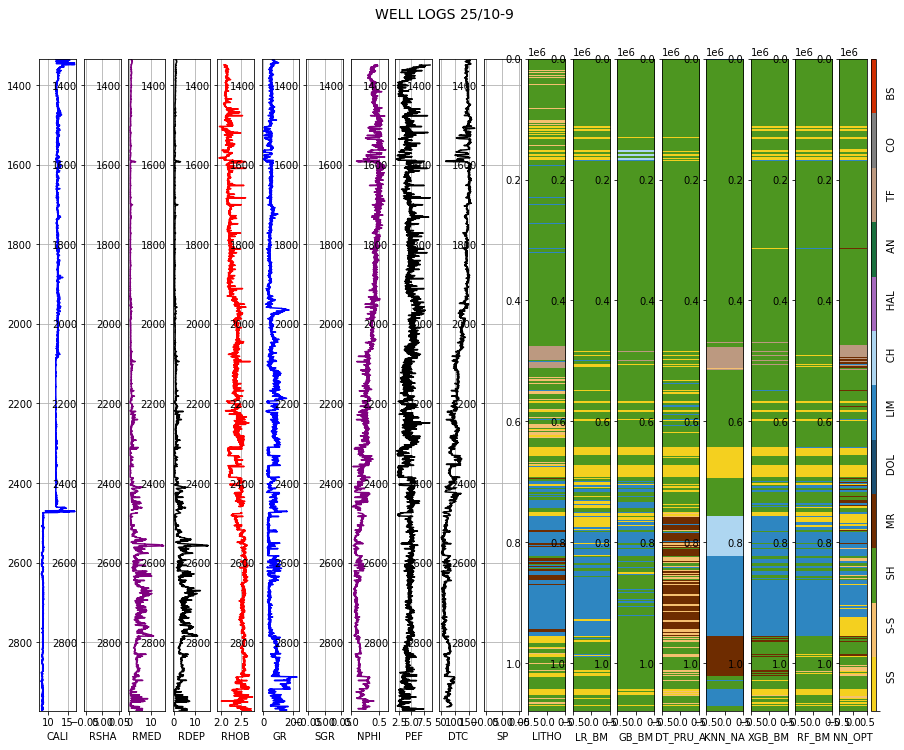

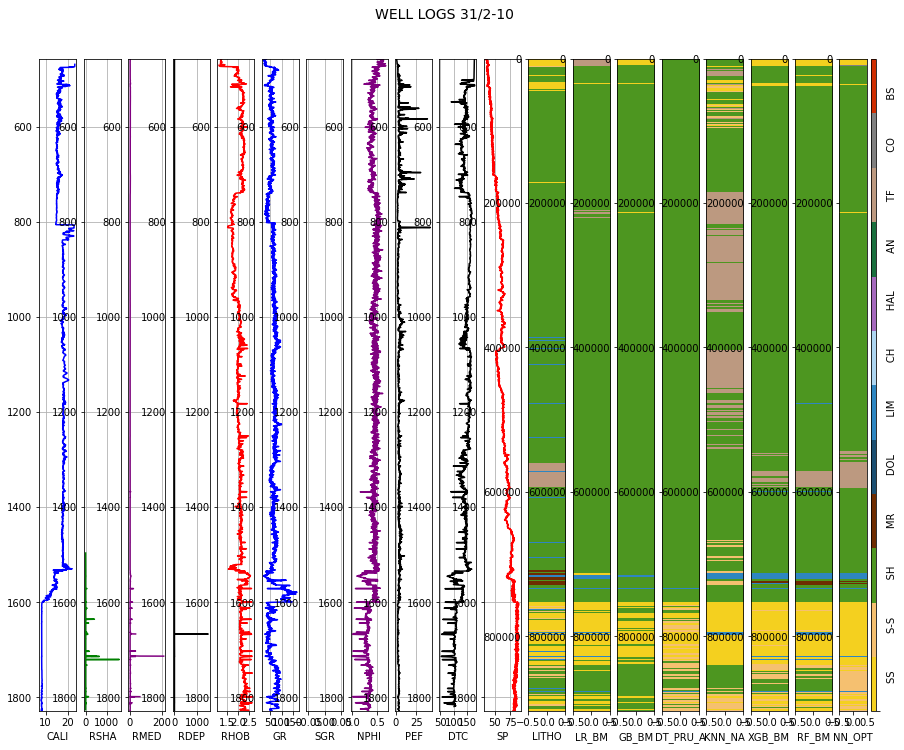

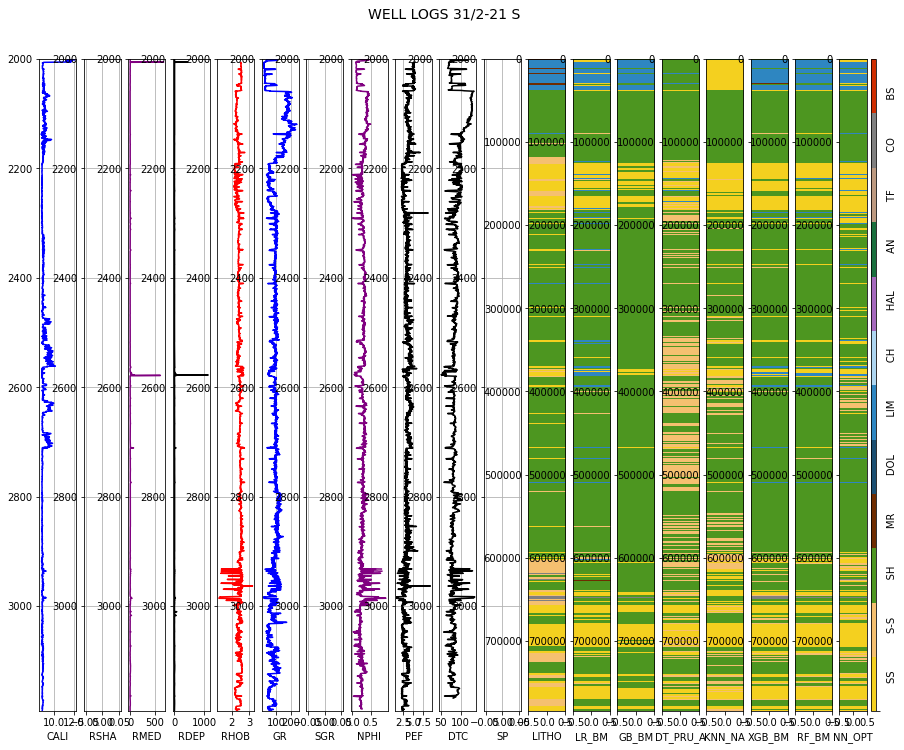

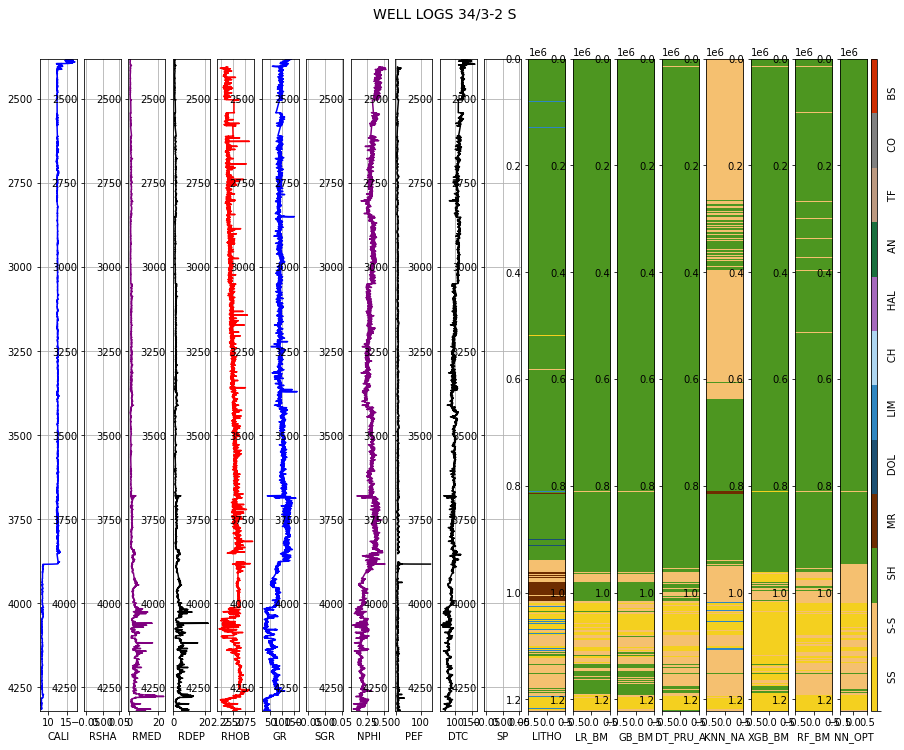

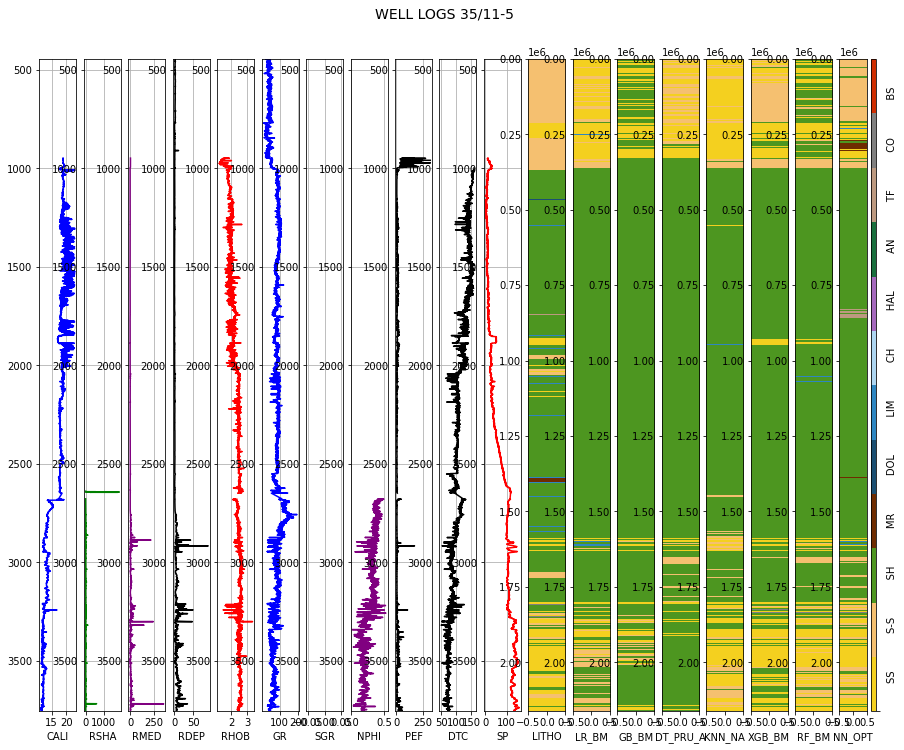

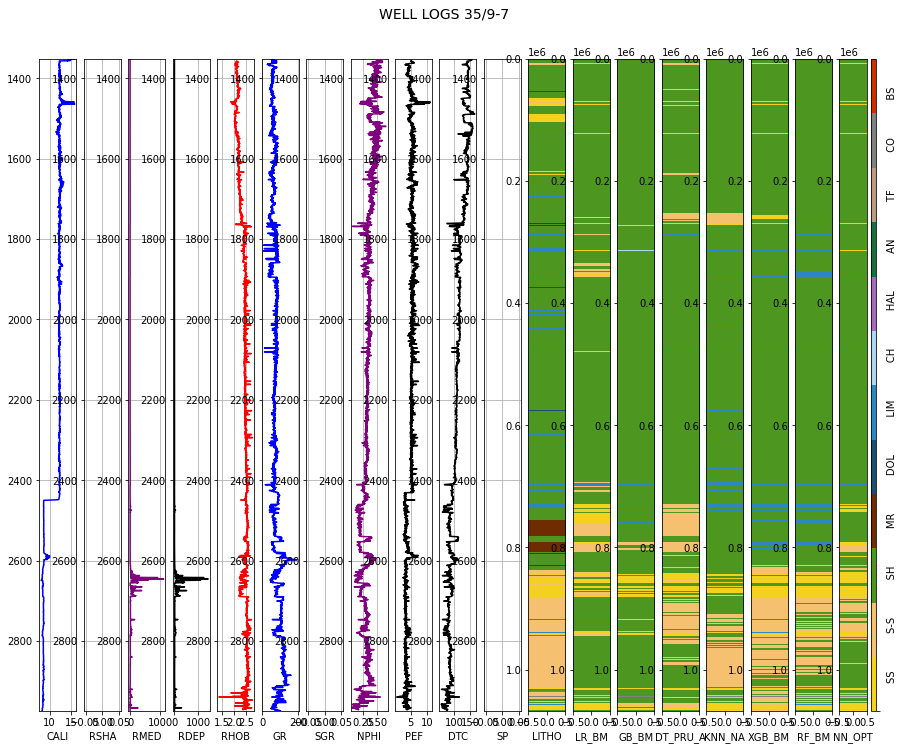

In [ ]:
#Plotting all predictions
for i in range(10):
  pred_log(hidden_comparition, i, facies_colors, 7)